# Popularity of NBA teams

## Does the popularity of a NBA team correlate with its profitability?

The National Basketball Association (NBA) is a men's professional basketball league in North
America; composed of 30 teams (29 in the United States and 1 in Canada).

The NBA is a collection of 30 teams, broken down by two conferences with three divisions apiece. The Western Conference plays host to the Northwest, Pacific and Southwest Divisions, featuring the following 15 teams:

> Northwest: Denver Nuggets, Minnesota Timberwolves, Oklahoma City Thunder, Portland Trail Blazers, Utah Jazz

> Pacific: Golden State Warriors, Los Angeles Clippers, Los Angeles Lakers, Phoenix Suns, Sacramento Kings

> Southwest: Dallas Mavericks, Houston Rockets, Memphis Grizzlies, New Orleans Pelicans, San Antonio Spurs

The Eastern Conference's 15 squads also break up across three divisions: the Atlantic, Southeast and Central.

> Atlantic: Boston Celtics, Brooklyn Nets, New York Knicks, Philadelphia 76ers, Toronto Raptors

> Central: Chicago Bulls, Cleveland Cavaliers, Detroit Pistons, Indiana Pacers, Milwaukee Bucks

> Southeast: Atlanta Hawks, Charlotte Hornets, Miami Heat, Orlando Magic, Washington Wizards


Over the years, NBA has become increasingly popular internationally. According to a Twitter study, NBA was the most
discussed sports league in 2018.
We are interested in the following question:
- <b> Does the popularity of a NBA team correlate with its profitability?<b>

# A) Business Understanding

## 1) Problem Definition
It is obvious that professional sports in the United States, as in several other countries, are profit driven institutions in an intensely competitive entertainment industry.
As profit-driven entities, sport franchises strive to increase revenues from various
sources, primarily ticket sales and television contracts. NBA teams aim to achieve such a performance level.

Based on a study  called "Poor performance Benchmarking: An International Journal" [reference = Vol. 13 No. 3, 2006 pp. 252-271 Emerald Group Publishing Limited], it is estimated to have cost NBA teams $5.3-7.8 million a year, in ticket sales alone, depending on ticket prices and the actual capacity. Such large
incremental revenue, for operations with a predominantly fixed cost structure, can
make a significant difference in profits.

## 2) Goal

Hence, NBA teams are eager to find which channels of communications can influence their profits by dragging more fans to their stadiums, potential television or radio contract revenues, or any other related business revenues.

Therefore, to conduct a quantitative analysis, I will acquire data from various sources, structure and consolidate them to build indicators for the popularity and profitability of NBA teams:
- use the engagement of a team on twitter as an indicator of its popularity
- use the sales of a team’s tickets as a basic proxy to its profitability
- Also use additional data to enhance the analysis as winning percentages

## 3) Abstract

This case study examined the effects of engagement with NBA teams’ Twitter pages on attendance, operating income, and twitter favorite / retweets number. Total number of tweets, likes, retweets, and user followers were
calculated for each NBA team.
Regression equations were run to analyze how the number of tweet likes and winning percentages with profitability income. Results indicated the average number of tweets likes had significantly correlate with 
profitability incomes.

## 4) High level steps

- 1) Raw data acquisition from various sources.
- 2) Aggregating, structuring and building datasets 
- 3) Designing, deploying and maintaining the full data processing pipeline

# B) Data acquisition

## 1) Data Sources
![](pictures/data_sources.png)



- Social Media (twitter and wikipedia):
    - Engagement of the teams
    - Sentiment analysis in real time
    
- NBA Attendance:
    - http://www.espn.com/nba/attendance/_/year/2019
    
- NBA Ticket Price:
    - https://www.nerdwallet.com/blog/which-nba-teams-most-affordable/#cleveland
    - https://www.vividseats.com/nba-basketball/denver-nuggets-tickets/nuggets-3-18-3215516.html
    - https://finance.yahoo.com/news/average-ticket-prices-nba-team-100000563.html
    - https://teammarketing.com/fci/2017-nfl-fan-cost-index/
    - https://blog.barrystickets.com/nba-ticket-prices/
    
- NBA Teams Winning Percentages:
    - https://www.basketball-reference.com/teams/
    

## 2) Data Acquisition Pipeline

### >> Profitability data acquisition

#### a) Attendance:

Firt, let's creat attendance proxy table, it represent number of tickets sold and will represent our main fact table top mesure profitability. We’ll start by making a very basic scraper that uses Scrapy as its foundation. To do that, we’ll create a Python class that subclasses scrapy.Spider, a basic spider class provided by Scrapy. This class will have two required attributes:

name — just a name for the spider.
start_urls — a list of URLs that you start to crawl from. We’ll start with one URL.

In [ ]:
# %load nba_attendance_scraper.py
import scrapy
class NBAAttendanceSpider(scrapy.Spider):
    name = "nba_attendance_spider"
    start_urls = ['http://www.espn.com/nba/attendance/_/year/2020']
    
    def parse(self, response):
        table = '.tablehead'
        for team in response.css(table):
            row = '.tr'
            for row in team.css(row):
                cell = '.td'
                for cell in row.css(cell):
                    NAME_SELECTOR = 'h1 ::text'
                    yield {
                        'name': brickset.css().extract_first(),
                    }

In [9]:
! scrapy runspider nba_attendance_scraper.py

2020-03-13 16:07:17 [scrapy.utils.log] INFO: Scrapy 1.6.0 started (bot: scrapybot)
2020-03-13 16:07:17 [scrapy.utils.log] INFO: Versions: lxml 4.4.1.0, libxml2 2.9.9, cssselect 1.1.0, parsel 1.5.2, w3lib 1.21.0, Twisted 19.10.0, Python 3.7.3 (default, Mar 27 2019, 16:54:48) - [Clang 4.0.1 (tags/RELEASE_401/final)], pyOpenSSL 19.0.0 (OpenSSL 1.1.1d  10 Sep 2019), cryptography 2.7, Platform Darwin-15.6.0-x86_64-i386-64bit
2020-03-13 16:07:17 [scrapy.crawler] INFO: Overridden settings: {'SPIDER_LOADER_WARN_ONLY': True}
2020-03-13 16:07:17 [scrapy.extensions.telnet] INFO: Telnet Password: 5a0ee606ae5ac586
2020-03-13 16:07:17 [scrapy.middleware] INFO: Enabled extensions:
['scrapy.extensions.corestats.CoreStats',
 'scrapy.extensions.telnet.TelnetConsole',
 'scrapy.extensions.memusage.MemoryUsage',
 'scrapy.extensions.logstats.LogStats']
2020-03-13 16:07:17 [scrapy.middleware] INFO: Enabled downloader middlewares:
['scrapy.downloadermiddlewares.httpauth.HttpAuthMiddleware',
 'scrapy.downloade

For time constraint, I will not finish the implementation the scraping script, it is not the priority for this case study. However, if this task is highly repetitive, it is possible to automate the copy by completing the script above.

In [199]:
#import library:
import pandas as pd
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
import numpy as np


In [156]:
#copy table from http://www.espn.com/nba/attendance/_/year/2020 before running this cell
df_att_2020 = pd.read_clipboard()
df_att_2020['Year'] = 2020

In [222]:
df_att_2020['RK'].iloc[28] = 29
df_att_2020['TEAM'].iloc[28] = 'Hornets'
df_att_2020['GMS'].iloc[28] = 31
df_att_2020['TOTAL'].iloc[28] = 478591
df_att_2020['AVG'].iloc[28] = 15438
df_att_2020['PCT'].iloc[28] = 80.9
df_att_2020['GMS.1'].iloc[28] = 34
df_att_2020['AVG.1'].iloc[28] = 17564
df_att_2020['PCT.1'].iloc[28] = 92.4
df_att_2020['GMS.2'].iloc[28] = 65
df_att_2020['AVG.2'].iloc[28] = 16550
df_att_2020['PCT.2'].iloc[28] = 86.9

In [137]:
#copy table from http://www.espn.com/nba/attendance/_/year/2019 before running this cell
df_att_2019 = pd.read_clipboard()
df_att_2019['Year'] = 2019

In [138]:
#copy table from http://www.espn.com/nba/attendance/_/year/2018 before running this cell
df_att_2018 = pd.read_clipboard()
df_att_2018['Year'] = 2018

In [139]:
#copy table from http://www.espn.com/nba/attendance/_/year/2017 before running this cell
df_att_2017 = pd.read_clipboard()
df_att_2017['Year']=2017

In [223]:
#Concatenate all years in single dataframe:
df_att = pd.concat([df_att_2020,df_att_2019,df_att_2018,df_att_2017])

In [224]:
#remove the comma from all dataframe
df_att = df_att.apply(lambda x: x.astype(str).str.replace(',',''))

In [227]:
# cast the type of the dataframe
data_type = {'RK':int, 'TEAM':str, 'GMS':int, 'TOTAL':int, 'AVG':int, 'PCT':float, 'GMS.1':int,
             'AVG.1':int, 'PCT.1':float,'GMS.2':int, 'AVG.2':int, 'PCT.2':float, 'Year':int}
for key in data_type:
    df_att[key] = df_att[key].astype(data_type[key])

In [278]:
df_att.dtypes

RK       int64  
TEAM     object 
GMS      int64  
TOTAL    int64  
AVG      int64  
PCT      float64
GMS.1    int64  
AVG.1    int64  
PCT.1    float64
GMS.2    int64  
AVG.2    int64  
PCT.2    float64
Year     int64  
dtype: object

In [228]:
#Sort the dataframe based on the year and average attendance then reset the dataframe index:
df_att.sort_values(['Year','AVG'],inplace=True,ascending=False)
df_att.index = np.array(range(df_att.shape[0]))

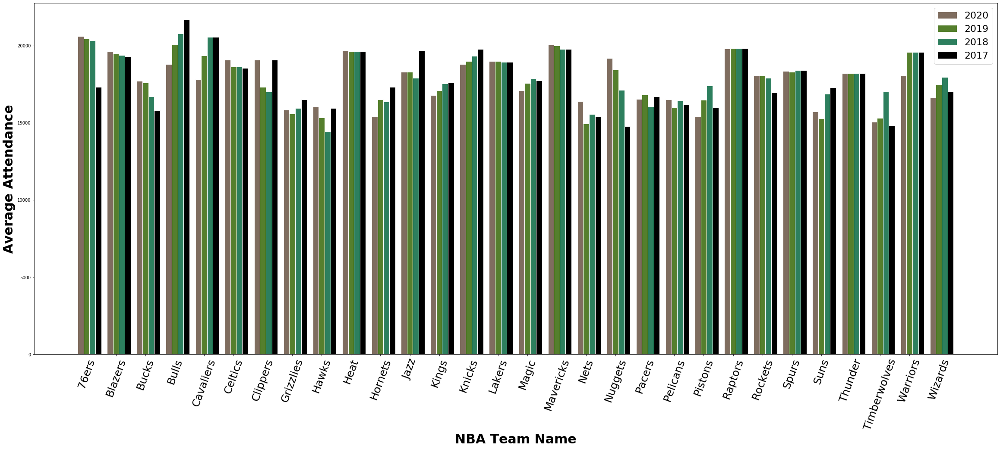

In [420]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plotNBA(df,col,xlabel,ylabel):
    # set width of bar
    barWidth = 0.20
    df.sort_values(['Year','TEAM'],inplace=True)
    # set height of bar
    bars1 = df[col][df['Year']==2020]
    bars2 = df[col][df['Year']==2019]
    bars3 = df[col][df['Year']==2018]
    bars4 = df[col][df['Year']==2017]

    # Set position of bar on X axis
    r1 = np.arange(len(bars1))
    r2 = [x + barWidth for x in r1]
    r3 = [x + barWidth for x in r2]
    r4 = [x + barWidth for x in r3]

    plt.figure(figsize=(40,15))
    # Make the plot
    plt.bar(r1, bars1, color='#7f6d5f', width=barWidth, edgecolor='white', label='2020')
    plt.bar(r2, bars2, color='#557f2d', width=barWidth, edgecolor='white', label='2019')
    plt.bar(r3, bars3, color='#2d7f5e', width=barWidth, edgecolor='white', label='2018') 
    plt.bar(r4, bars4, color='#000000', width=barWidth, edgecolor='white', label='2017') 
    # Add xticks on the middle of the group bars
    plt.xlabel(xlabel, fontweight='bold',fontsize='30')
    plt.ylabel(ylabel, fontweight='bold',fontsize='30')
    plt.xticks([r + barWidth for r in range(len(bars1))], df['TEAM'].unique(),rotation=70,fontsize='25')
    # Create legend & Show graphic
    plt.legend(fontsize='22')
    plt.show()

plotNBA(df_att,'AVG','NBA Team Name','Average Attendance')

In [425]:
df_att

,RK,TEAM,GMS,TOTAL,AVG,PCT,GMS.1,AVG.1,PCT.1,GMS.2,AVG.2,PCT.2,Year
107,18,76ers,41,710557,17330,85.3,41,17209,89.7,82,17269,87.4,2017
98,9,Blazers,41,792029,19317,99.4,41,17555,92.2,82,18436,95.8,2017
116,27,Bucks,41,648952,15828,84.6,41,17928,92.8,82,16878,88.8,2017
90,1,Bulls,41,888882,21680,103.6,41,18033,94.0,82,19856,99.0,2017
91,2,Cavaliers,41,843042,20562,100.0,41,19021,98.7,82,19791,99.4,2017
101,12,Celtics,41,760690,18553,99.6,41,18313,94.6,82,18433,97.1,2017
99,10,Clippers,41,782609,19088,100.1,41,17889,94.1,82,18488,97.1,2017
112,23,Grizzlies,41,677314,16519,91.2,41,17655,92.7,82,17087,91.9,2017
115,26,Hawks,41,654306,15958,85.2,41,17816,93.7,82,16887,89.5,2017
96,7,Heat,41,805400,19643,100.2,41,17818,92.4,82,18731,96.3,2017


In [426]:
df_att.to_csv("data/nba_attendance.csv")

#### b) Ticket Price:

In [427]:
import pandas as pd
import numpy as np

In [333]:
# copy first the table from https://www.nerdwallet.com/blog/which-nba-teams-most-affordable
df_cost = pd.read_clipboard()

In [458]:
# Helper function to extract the correct NBA Team Name
def setTeam(df,col):
    import numpy as np
    df[['0','1','2']] = df[col].str.split(" ", n = 2, expand = True)
    conditions  = [((~df['1'].isnull()) & (df['2'].isnull())),
                   (~df['2'].isnull())]
    choices     = [ df['1'],df['2']]
    df['TEAM'] = np.select(conditions, choices, default=np.nan)
    df.drop(['0','1','2'], axis=1,inplace=True)
    return df

In [364]:
# Cast the TFC column as float and split the Team column into City and TEAM. 
df_cost['TFC_dollar'] = df_cost['Total Family Cost (TFC)'].apply(lambda x: x.replace('$','')).astype(float)

# extract the NBA team name without the city name. 
# It is needed to merge with attendance dataframe "nba_attendance.csv"
df_cost = setTeam(df_cost,'Team')
df_cost

,Rank,Team,Median Resale Ticket Price,16oz. Beer,16oz. Soda,Hot Dog,Parking,Total Family Cost (TFC),TFC_dollar,TEAM
0,1,Cleveland Cavaliers,$42.00,$9.33,$4.50,$5.50,$5.00,$222.67,222.67,Cavaliers
1,2,Indiana Pacers,$55.00,$6.00,$3.25,$4.00,$8.00,$262.50,262.50,Pacers
2,3,Dallas Mavericks,$52.00,$5.33,$4.00,$4.00,$20.00,$262.67,262.67,Mavericks
3,4,Memphis Grizzlies,$55.00,$7.50,$3.20,$5.00,$15.00,$276.40,276.40,Grizzlies
4,5,San Antonio Spurs,$59.00,$5.00,$2.50,$4.75,$8.00,$278.00,278.00,Spurs
5,6,Denver Nuggets,$60.00,$4.17,$4.25,$4.50,$16.00,$290.83,290.83,Nuggets
6,7,New Orleans Pelicans,$60.00,$5.60,$5.33,$4.00,$15.00,$292.87,292.87,Pelicans
7,8,Milwaukee Bucks,$60.00,$6.50,$5.50,$4.00,$18.00,$298.00,298.00,Bucks
8,9,Washington Wizards,$64.00,$5.33,$5.00,$5.50,$20.00,$318.67,318.67,Wizards
9,10,Minnesota Timberwolves,$65.00,$9.33,$4.33,$5.50,$15.00,$324.33,324.33,Timberwolves


In [353]:
df_cost.to_csv("data/nba_total_familly_cost.csv")

#### c) Merge Attendance with Ticket Price

In [388]:
df_att = pd.read_csv("data/nba_attendance.csv")
df_cost = pd.read_csv("data/nba_total_familly_cost.csv")
df_att.drop(['Unnamed: 0'],axis=1,inplace=True)

# Merge ticket price with attendance using TEAM column as id:
df_att_cost = pd.merge(df_att,df_cost[['TEAM','TFC_dollar']],how='left',on='TEAM')
df_att_cost

,RK,TEAM,GMS,TOTAL,AVG,PCT,GMS.1,AVG.1,PCT.1,GMS.2,AVG.2,PCT.2,Year,TFC_dollar
0,1,76ers,31,639491,20628,102.4,34,17706,94.5,65,19122,98.5,2020,380.67
1,2,Mavericks,34,682096,20061,104.5,33,18249,97.8,67,19169,101.2,2020,262.67
2,3,Raptors,32,633456,19795,100.0,32,17789,94.9,64,18792,97.5,2020,505.77
3,4,Heat,32,629771,19680,100.4,33,18127,96.8,65,18891,98.6,2020,696.33
4,5,Trail Blazers,32,608634,19633,101.0,34,17941,96.6,66,18748,98.8,2020,NaN
5,6,Nuggets,33,633153,19186,98.3,32,17163,92.8,65,18190,95.7,2020,290.83
6,7,Celtics,32,610864,19089,102.5,32,18409,97.7,64,18749,100.1,2020,418.14
7,8,Clippers,32,610176,19068,100.0,32,17855,96.2,64,18461,98.1,2020,585.20
8,9,Lakers,31,588907,18997,99.6,32,18877,101.9,63,18936,100.8,2020,789.20
9,10,NY Knicks,33,620789,18811,95.0,33,17767,94.1,66,18289,94.5,2020,NaN


In [385]:
df_att_cost['TEAM'][df_att_cost['TFC_dollar'].isnull()].unique()

array(['Trail Blazers', 'NY Knicks', 'Hornets'], dtype=object)

We have missing values for 3 teams: ['Trail Blazers', 'NY Knicks', 'Hornets']
- the first 2 names 'Trail Blazers', 'NY Knicks' don't match due to the additional item (Trail, NY) 
- the third name 'Hornets', it not defined correctly in the ticket price dataframe as it was changed since 2014 based on wikipedia: https://en.wikipedia.org/wiki/Charlotte_Hornets

In [390]:
df_att['TEAM'][df_att['TEAM']=='Trail Blazers']='Blazers'
df_att['TEAM'][df_att['TEAM']=='NY Knicks']='Knicks'
df_cost['TEAM'][df_cost['TEAM']=='Bobcats']='Hornets'
print('Team name with a miss match:{}'.format(set(df_att['TEAM'].unique()) - set(df_cost['TEAM'].unique())))

Team name with a miss match:set()


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doi

In [394]:
# Merge again (with correct team names) ticket price with attendance using TEAM column as id:
df_att_cost = pd.merge(df_att,df_cost[['TEAM','TFC_dollar']],how='left',on='TEAM')
print("missing values in column TFC_dollar:{}".format(df_att_cost['TEAM'][df_att_cost['TFC_dollar'].isnull()].unique()))
display(df_att_cost)

missing values in column TFC_dollar:[]


,RK,TEAM,GMS,TOTAL,AVG,PCT,GMS.1,AVG.1,PCT.1,GMS.2,AVG.2,PCT.2,Year,TFC_dollar
0,1,76ers,31,639491,20628,102.4,34,17706,94.5,65,19122,98.5,2020,380.67
1,2,Mavericks,34,682096,20061,104.5,33,18249,97.8,67,19169,101.2,2020,262.67
2,3,Raptors,32,633456,19795,100.0,32,17789,94.9,64,18792,97.5,2020,505.77
3,4,Heat,32,629771,19680,100.4,33,18127,96.8,65,18891,98.6,2020,696.33
4,5,Blazers,32,608634,19633,101.0,34,17941,96.6,66,18748,98.8,2020,429.00
5,6,Nuggets,33,633153,19186,98.3,32,17163,92.8,65,18190,95.7,2020,290.83
6,7,Celtics,32,610864,19089,102.5,32,18409,97.7,64,18749,100.1,2020,418.14
7,8,Clippers,32,610176,19068,100.0,32,17855,96.2,64,18461,98.1,2020,585.20
8,9,Lakers,31,588907,18997,99.6,32,18877,101.9,63,18936,100.8,2020,789.20
9,10,Knicks,33,620789,18811,95.0,33,17767,94.1,66,18289,94.5,2020,878.20


In [396]:
# calculate the average profitability per NBA team and per year:
df_att_cost['AVG_Ticket_Profit'] = df_att_cost['AVG'] * df_att_cost['TFC_dollar']
df_att_cost

,RK,TEAM,GMS,TOTAL,AVG,PCT,GMS.1,AVG.1,PCT.1,GMS.2,AVG.2,PCT.2,Year,TFC_dollar,AVG_Ticket_Profit
0,1,76ers,31,639491,20628,102.4,34,17706,94.5,65,19122,98.5,2020,380.67,7852460.76
1,2,Mavericks,34,682096,20061,104.5,33,18249,97.8,67,19169,101.2,2020,262.67,5269422.87
2,3,Raptors,32,633456,19795,100.0,32,17789,94.9,64,18792,97.5,2020,505.77,10011717.15
3,4,Heat,32,629771,19680,100.4,33,18127,96.8,65,18891,98.6,2020,696.33,13703774.40
4,5,Blazers,32,608634,19633,101.0,34,17941,96.6,66,18748,98.8,2020,429.00,8422557.00
5,6,Nuggets,33,633153,19186,98.3,32,17163,92.8,65,18190,95.7,2020,290.83,5579864.38
6,7,Celtics,32,610864,19089,102.5,32,18409,97.7,64,18749,100.1,2020,418.14,7981874.46
7,8,Clippers,32,610176,19068,100.0,32,17855,96.2,64,18461,98.1,2020,585.20,11158593.60
8,9,Lakers,31,588907,18997,99.6,32,18877,101.9,63,18936,100.8,2020,789.20,14992432.40
9,10,Knicks,33,620789,18811,95.0,33,17767,94.1,66,18289,94.5,2020,878.20,16519820.20


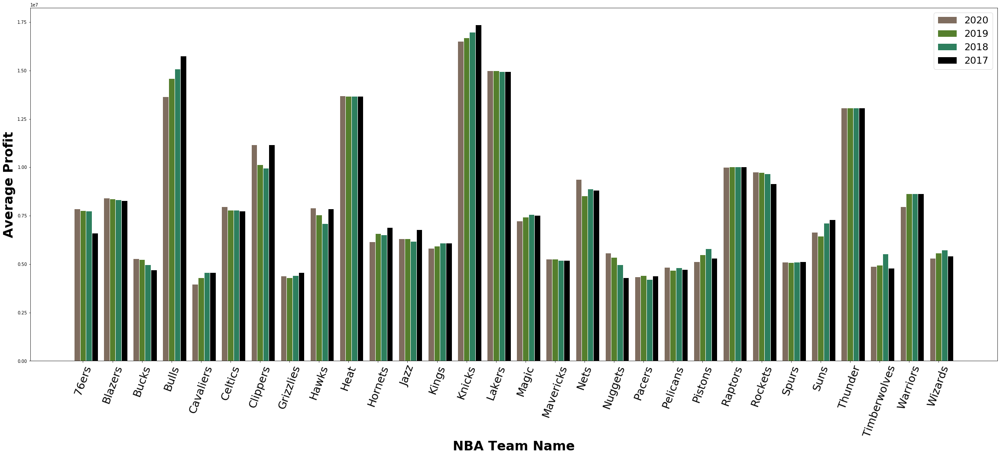

In [428]:
plotNBA(df_att_cost,'AVG_Ticket_Profit','NBA Team Name','Average Profit')

In [430]:
df_att_cost[df_att_cost['TEAM']=='Bulls']

,RK,TEAM,GMS,TOTAL,AVG,PCT,GMS.1,AVG.1,PCT.1,GMS.2,AVG.2,PCT.2,Year,TFC_dollar,AVG_Ticket_Profit
90,1,Bulls,41,888882,21680,103.6,41,18033,94.0,82,19856,99.0,2017,726.4,15748352.0
60,1,Bulls,41,851824,20776,99.3,41,18030,94.4,82,19403,97.0,2018,726.4,15091686.4
31,2,Bulls,41,823475,20084,96.0,41,17822,94.1,82,18953,95.1,2019,726.4,14589017.6
10,11,Bulls,34,639352,18804,89.9,31,17767,94.3,65,18310,91.9,2020,726.4,13659225.6


#### d) Assumption:
in this study, we are taking the assumption that the Total Familly Cost doens't change from 2017 until 2020. Idealy, we should retrieve the TFC per year but I was not able to find this data.

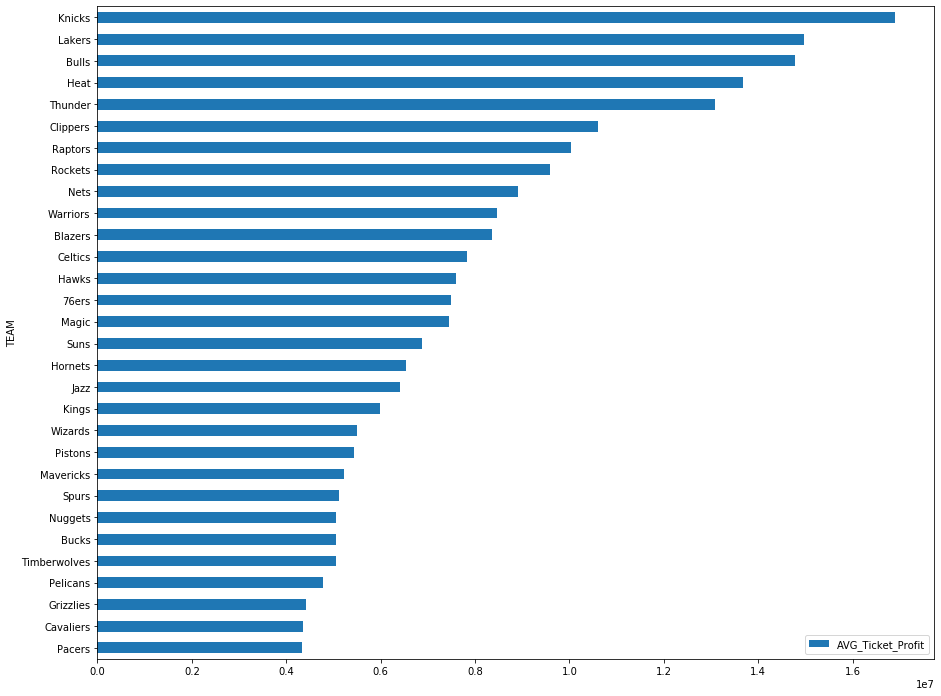

In [446]:
# 2017 to 2020 Average Ranking:
df_att_cost[['TEAM','AVG_Ticket_Profit']].groupby(['TEAM']).mean().sort_values('AVG_Ticket_Profit',ascending=True).plot.barh(figsize=(15,12))

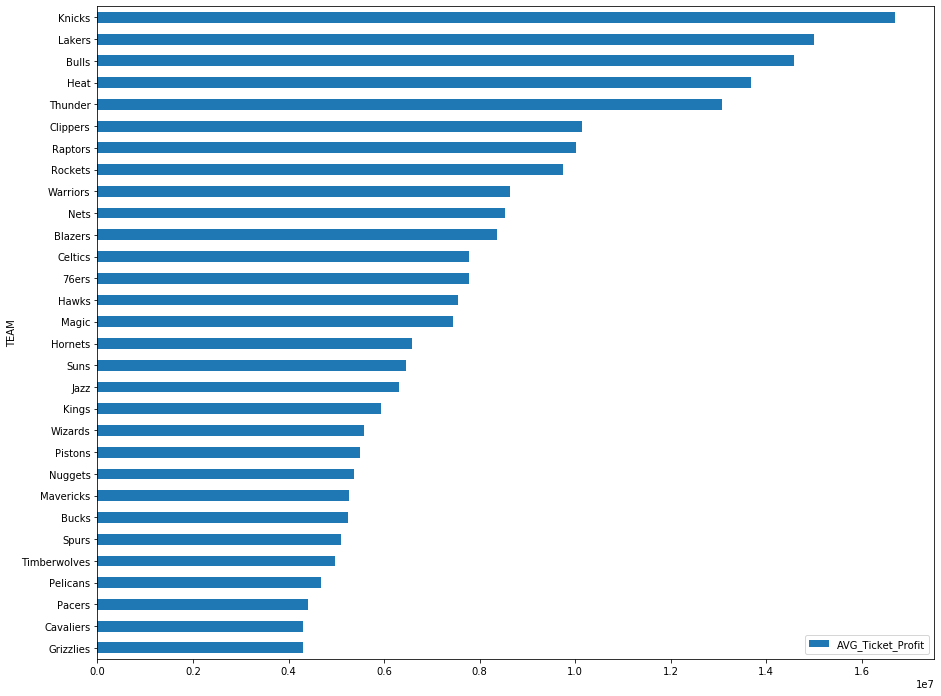

In [449]:
#2019 Ranking:
df_att_cost[['TEAM','AVG_Ticket_Profit']][df_att_cost['Year']==2019].groupby(['TEAM']).mean().sort_values('AVG_Ticket_Profit',ascending=True).plot.barh(figsize=(15,12))

#### e) Comparaison with 2019 valuation from FORBES:
https://www.forbes.com/sites/kurtbadenhausen/2019/02/06/nba-team-values-2019-knicks-on-top-at-4-billion/#51ed884e6671

![](pictures/forbes_nba_profit.png)


https://www.forbes.com/sites/baileybrautigan/2016/03/21/where-all-that-money-comes-from-nba-team-valuations-visualized/#ab5d1f5444fd

In [451]:
df_att_cost.to_csv("data/nba_profitability.csv")

### << Conclusion Profitability Data Acquisition:
Our evaluation of the profitability was limited to arena's attendances and Total Familly Cost. It does match on the extreams but not perfectly matching with Forbes ranking. However, Forbes ranking cumulate other results related to: Sport,Makret, Stadium and Brand. We did only Stadium evaluation as defined in the problem statment "sales of a team’s tickets as a basic proxy to its profitability".
In order to reduce the error and simplify the correlation study with the popularity, it is possible also to create categories per profitability:
- High
- Medium
- Low

### >> Winning Percentage data acquisition

#### a) Teams Statistiques

In [378]:
#download the CSV file from https://www.basketball-reference.com/teams/
# From "Share&More" select csv format

df_wp = pd.read_csv("data/nba_team_stats.csv", sep=';')

columns description: 
- Lg -- League
- From -- First year
- To -- Last year
- G -- Games
- W -- Wins
- L -- Losses
- W/L% -- Win-Loss Percentage
- Plyfs -- Years team made the playoffs
- Div -- Years team finished first (or tied for first) in the division
- Conf -- Years team won the conference championship
- Champ -- Years team won the league championship

In [379]:
df_wp.sort_values(['W/L%'],ascending=False)

,Franchise,Lg,From,To,Yrs,G,W,L,W/L%,Plyfs,Div,Conf,Champ
0,San Antonio Spurs,NBA/ABA,1967-68,2019-20,53,4285,2567,1718,0.60,47,22,6,5
1,Los Angeles Lakers,NBA/BAA,1948-49,2019-20,72,5678,3382,2296,0.60,61,32,18,16
2,Boston Celtics,NBA/BAA,1946-47,2019-20,74,5788,3421,2367,0.59,57,31,9,17
3,Oklahoma City Thunder,NBA,1967-68,2019-20,53,4280,2323,1957,0.54,31,11,4,1
4,Utah Jazz,NBA,1974-75,2019-20,46,3706,2005,1701,0.54,28,9,2,0
5,Portland Trail Blazers,NBA,1970-71,2019-20,50,4036,2163,1873,0.54,35,6,3,1
6,Houston Rockets,NBA,1967-68,2019-20,53,4280,2265,2015,0.53,33,7,4,2
7,Phoenix Suns,NBA,1968-69,2019-20,52,4199,2212,1987,0.53,29,6,2,0
8,Miami Heat,NBA,1988-89,2019-20,32,2559,1335,1224,0.52,20,13,5,3
9,Milwaukee Bucks,NBA,1968-69,2019-20,52,4199,2182,2017,0.52,32,14,2,1


In [382]:
#Extract the team name from the Franchise column using previous function:
df_wp = setTeam(df_wp,'Franchise')
df_wp

,Franchise,Lg,From,To,Yrs,G,W,L,W/L%,Plyfs,Div,Conf,Champ,TEAM
0,San Antonio Spurs,NBA/ABA,1967-68,2019-20,53,4285,2567,1718,0.60,47,22,6,5,Spurs
1,Los Angeles Lakers,NBA/BAA,1948-49,2019-20,72,5678,3382,2296,0.60,61,32,18,16,Lakers
2,Boston Celtics,NBA/BAA,1946-47,2019-20,74,5788,3421,2367,0.59,57,31,9,17,Celtics
3,Oklahoma City Thunder,NBA,1967-68,2019-20,53,4280,2323,1957,0.54,31,11,4,1,Thunder
4,Utah Jazz,NBA,1974-75,2019-20,46,3706,2005,1701,0.54,28,9,2,0,Jazz
5,Portland Trail Blazers,NBA,1970-71,2019-20,50,4036,2163,1873,0.54,35,6,3,1,Blazers
6,Houston Rockets,NBA,1967-68,2019-20,53,4280,2265,2015,0.53,33,7,4,2,Rockets
7,Phoenix Suns,NBA,1968-69,2019-20,52,4199,2212,1987,0.53,29,6,2,0,Suns
8,Miami Heat,NBA,1988-89,2019-20,32,2559,1335,1224,0.52,20,13,5,3,Heat
9,Milwaukee Bucks,NBA,1968-69,2019-20,52,4199,2182,2017,0.52,32,14,2,1,Bucks


#### b) Winning Percentage per team:

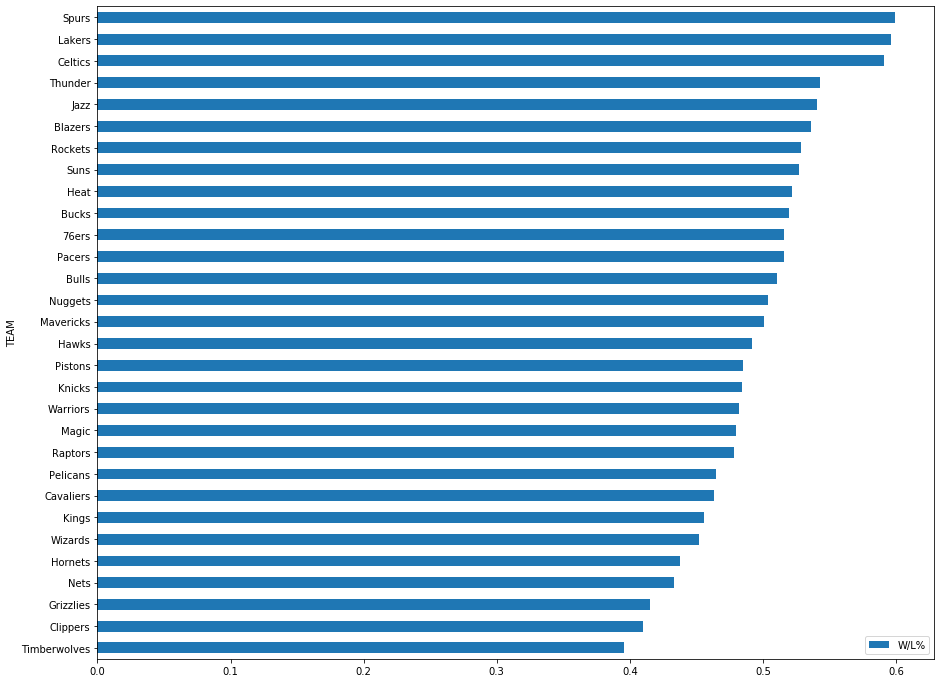

In [473]:
#Plot the winning perecentage ranking per team:
df_wp[['TEAM','W/L%']].groupby(['TEAM']).mean().sort_values('W/L%',ascending=True).plot.barh(figsize=(15,12))

#### c) Correlate the winning percentage with the profitability

In [532]:
def plotHeatMap(corr,title):
    import seaborn as sns
    import matplotlib.pyplot as plt
    fig, ax = plt.subplots(figsize=(15,10))
    ax = plt.axes()
    ax.set_title(title)
    ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
    )
    ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
    );

In [383]:
df1 = df_att_cost[['TEAM','AVG_Ticket_Profit']].groupby(['TEAM']).mean().astype(float)
df2 = df_wp[['TEAM','Yrs', 'G', 'W', 'L', 'W/L%', 'Plyfs','Div', 'Conf', 'Champ']].groupby(['TEAM']).mean().astype(float)
df3 = pd.merge(df1,df2,how='left',on='TEAM')
corr = df3.corr()

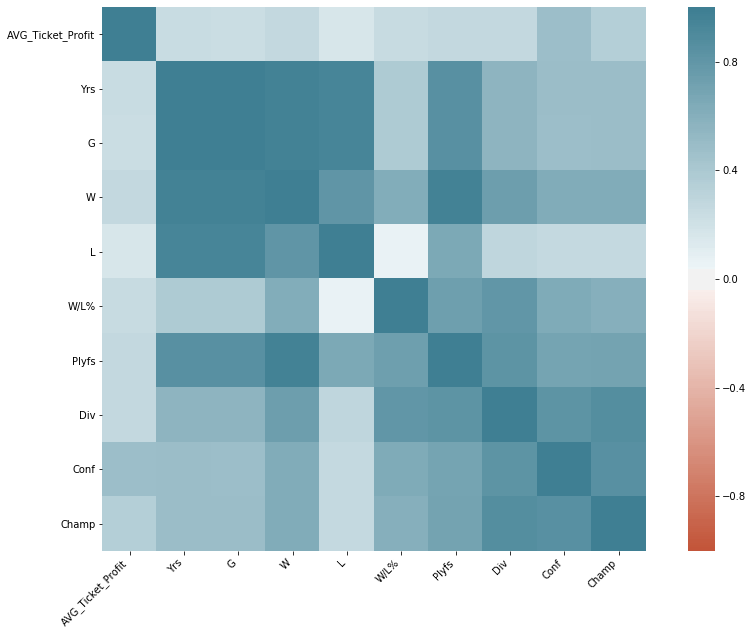

In [385]:
plotHeatMap(corr,'NBA Team Profitability / Winning Percentage')

### << Conclusion Winning Percentage
Based on the heatmap above, we can conclude that a team that won a many times the conference championship should have a better profitability than a team that won less conference championship.

- Conf -- Years team won the conference championship

### >> Social Media

Social Medias are powerful channels to engage with fans specially during the out-of-season, it enable NBA teams to communicate with fans without geographical boundaries or time limits.
<br> Engagement: <br> User engagement, or customer engagement, is the assessment of the response to a particular offer, such as a product or service. In the context of social media, pieces of content are often created with the purpose to drive traffic towards the company website or e-commerce. Measuring engagement is important as it helps in defining and understanding strategies to maximize the interactions with your network, and ultimately bring business. On Twitter, users engage by the means of retweeting or liking a particular tweet, which in return, provides more visibility to the tweet itself.

#### a) Download Twitter Data

In [101]:
import pandas as pd
# load nba teams twitter account from json file with official twitter accounts:
NBA_Teams = pd.read_json("data/nba_twitter_account.json")

In [103]:
twitter_account = NBA_Teams.values.reshape(30)
display(twitter_account,NBA_Teams.index)

array(['sixers', 'trailblazers', 'bucks', 'chicagobulls', 'cavs',
       'celtics', 'laclippers', 'memgrizz', 'atlhawks', 'miamiheat',
       'hornets', 'utahjazz', 'sacramentokings', 'nyknicks', 'lakers',
       'orlandomagic', 'dallasmavs', 'brooklynnets', 'nuggets', 'pacers',
       'pelicansnba', 'detroitpistons', 'raptors', 'houstonrockets',
       'spurs', 'suns', 'okcthunder', 'timberwolves', 'warriors',
       'washwizards'], dtype=object)

Index(['76ers', 'Blazers', 'Bucks', 'Bulls', 'Cavaliers', 'Celtics',
       'Clippers', 'Grizzlies', 'Hawks', 'Heat', 'Hornets', 'Jazz', 'Kings',
       'Knicks', 'Lakers', 'Magic', 'Mavericks', 'Nets', 'Nuggets', 'Pacers',
       'Pelicans', 'Pistons', 'Raptors', 'Rockets', 'Spurs', 'Suns', 'Thunder',
       'Timberwolves', 'Warriors', 'Wizards'],
      dtype='object')

In [203]:
# %load src/nba_twitter_dumper.py
#!/usr/bin/env python
import unicodedata
import tweepy #https://github.com/tweepy/tweepy
import csv

#Twitter API credentials
access_key = "1149598966897491968-T8FLfpaeWT9HpjbssGiHA4wFkVv8Iy"
access_secret = "u1dbZbkshYkNDivTkmUcWEnwAWSPOdPm6pHsGYtDAMWQD"
consumer_key = "gTOkUJDZajQ8EMyGEHk6Qa4zl"
consumer_secret = "VsXlE4ZQjdZYbVYqxEI8wEGG62Wx2O9AREJc8LMZTH7tW8JEcV"

def get_all_tweets(screen_name):
#Twitter only allows access to a users most recent 3240 tweets with this method
    
    #authorize twitter, initialize tweepy
    auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
    auth.set_access_token(access_key, access_secret)
    api = tweepy.API(auth)
    
    #initialize a list to hold all the tweepy Tweets
    alltweets = []
    
    #make initial request for most recent tweets (200 is the maximum allowed count)
    new_tweets = api.user_timeline(screen_name = screen_name,count=200)
    #new_tweets = tweepy.Cursor(api.user_timeline, screen_name=screen_name, count=200).items()

    #save most recent tweets
    alltweets.extend(new_tweets)
    
    #save the id of the oldest tweet less one
    oldest = alltweets[-1].id - 1
    
    #keep grabbing tweets until there are no tweets left to grab
    while len(new_tweets) > 0:
        print("getting tweets before {}".format(oldest))
    
        #all subsiquent requests use the max_id param to prevent duplicates
        #new_tweets = tweepy.Cursor(api.user_timeline, screen_name = screen_name,count=200, max_id = oldest).items()
        new_tweets = api.user_timeline(screen_name = screen_name,count=200,max_id=oldest)
        
        #save most recent tweets
        alltweets.extend(new_tweets)

        #update the id of the oldest tweet less one
        oldest = alltweets[-1].id - 1

        print("...{} tweets downloaded so far".format(len(alltweets)))

    #transform the tweepy tweets into a 2D array that will populate the csv
    outtweets = [[tweet.id_str, 
                  tweet.created_at, 
                  tweet.favorite_count, # Indicates approximately how many times this Tweet has been liked by Twitter users.
                  tweet.retweet_count,  # Number of times this Tweet has been retweeted.
                  tweet.user.screen_name,
                  tweet.user.followers_count,
                  #tweet.reply_count,    # Number of times this Tweet has been replied to.
                  #tweet.quote_count,    # Indicates approximately how many times this Tweet has been quoted by Twitter users.
                  #tweet.text.encode("utf-8")
                  tweet.text,
                  #unicodedata.normalize('NFKD',tweet.text).encode('ascii','ignore')
                 ] for tweet in alltweets]

    #write the csv
    with open("data/tweets/{}_tweets.csv".format(screen_name),'wt') as f:
        writer = csv.writer(f)
        writer.writerow(["id","created_at","favorite count","retweet count","user","user followers count","text"])
        writer.writerows(outtweets)
    
    pass

if __name__ == '__main__':
    #pass in the username of the account you want to download
    for team in twitter_account:
        print("Load tweets from page: {}".format(team))
        get_all_tweets(team)


Load tweets from page: sixers
getting tweets before 1234237240022167551
...400 tweets downloaded so far
getting tweets before 1230706231494361090
...600 tweets downloaded so far
getting tweets before 1226695473454571519
...800 tweets downloaded so far
getting tweets before 1223047573235216384
...1000 tweets downloaded so far
getting tweets before 1219658412666961919
...1200 tweets downloaded so far
getting tweets before 1217623678013378559
...1400 tweets downloaded so far
getting tweets before 1214384913522315263
...1600 tweets downloaded so far
getting tweets before 1209947561542520831
...1800 tweets downloaded so far
getting tweets before 1207488388510736385
...2000 tweets downloaded so far
getting tweets before 1204641965423255551
...2200 tweets downloaded so far
getting tweets before 1202740183801614335
...2400 tweets downloaded so far
getting tweets before 1200127217939955711
...2599 tweets downloaded so far
getting tweets before 1198079304971771903
...2799 tweets downloaded so fa

...1200 tweets downloaded so far
getting tweets before 1215768268109041663
...1400 tweets downloaded so far
getting tweets before 1211735957067591679
...1600 tweets downloaded so far
getting tweets before 1207875404695920639
...1800 tweets downloaded so far
getting tweets before 1204246121133903873
...2000 tweets downloaded so far
getting tweets before 1200598218276364288
...2200 tweets downloaded so far
getting tweets before 1197400637710843906
...2400 tweets downloaded so far
getting tweets before 1194009780722880511
...2600 tweets downloaded so far
getting tweets before 1188214637449236479
...2800 tweets downloaded so far
getting tweets before 1182463922344878080
...3000 tweets downloaded so far
getting tweets before 1167172665225826303
...3200 tweets downloaded so far
getting tweets before 1147668756102959105
...3219 tweets downloaded so far
getting tweets before 1146176949192015871
...3219 tweets downloaded so far
Load tweets from page: memgrizz
getting tweets before 1241486663383

...2397 tweets downloaded so far
getting tweets before 1192993713045114884
...2597 tweets downloaded so far
getting tweets before 1189225383364890627
...2796 tweets downloaded so far
getting tweets before 1185661908650586112
...2996 tweets downloaded so far
getting tweets before 1181577235288903680
...3196 tweets downloaded so far
getting tweets before 1177732020551598079
...3210 tweets downloaded so far
getting tweets before 1177356720059715583
...3210 tweets downloaded so far
Load tweets from page: nyknicks
getting tweets before 1234651943143911424
...400 tweets downloaded so far
getting tweets before 1230854690012835840
...600 tweets downloaded so far
getting tweets before 1226272500729950207
...800 tweets downloaded so far
getting tweets before 1221086739701403647
...1000 tweets downloaded so far
getting tweets before 1216770912336388096
...1200 tweets downloaded so far
getting tweets before 1213196990793887744
...1400 tweets downloaded so far
getting tweets before 1208553380035072

...3244 tweets downloaded so far
getting tweets before 1198792693599461375
...3244 tweets downloaded so far
Load tweets from page: pacers
getting tweets before 1235359495892676607
...400 tweets downloaded so far
getting tweets before 1232463546652319747
...600 tweets downloaded so far
getting tweets before 1227770875396677632
...800 tweets downloaded so far
getting tweets before 1225120718679150599
...1000 tweets downloaded so far
getting tweets before 1221945243433611264
...1200 tweets downloaded so far
getting tweets before 1219100197822849023
...1400 tweets downloaded so far
getting tweets before 1216107455433924608
...1600 tweets downloaded so far
getting tweets before 1212888946931326980
...1800 tweets downloaded so far
getting tweets before 1209301674986225664
...2000 tweets downloaded so far
getting tweets before 1207071426462801919
...2200 tweets downloaded so far
getting tweets before 1204212322090332159
...2400 tweets downloaded so far
getting tweets before 120149806536398438

...1000 tweets downloaded so far
getting tweets before 1220923781247459328
...1200 tweets downloaded so far
getting tweets before 1218000191451647999
...1400 tweets downloaded so far
getting tweets before 1215709978259902463
...1600 tweets downloaded so far
getting tweets before 1211881686486544383
...1800 tweets downloaded so far
getting tweets before 1209234364648701951
...2000 tweets downloaded so far
getting tweets before 1205985324465213439
...2200 tweets downloaded so far
getting tweets before 1203462516044652551
...2400 tweets downloaded so far
getting tweets before 1201029295625228288
...2600 tweets downloaded so far
getting tweets before 1198366370154475519
...2800 tweets downloaded so far
getting tweets before 1195177920089575423
...3000 tweets downloaded so far
getting tweets before 1192592011959779329
...3200 tweets downloaded so far
getting tweets before 1189633150927986688
...3247 tweets downloaded so far
getting tweets before 1189011794825633791
...3247 tweets downloaded

In [66]:
#Import the necessary methods from tweepy library
import tweepy
import json
import time
from tweepy import OAuthHandler
from tweepy import Stream
from tweepy import StreamListener

#Setting user credentials to variables
access_token = "1149598966897491968-T8FLfpaeWT9HpjbssGiHA4wFkVv8Iy"
access_token_secret = "u1dbZbkshYkNDivTkmUcWEnwAWSPOdPm6pHsGYtDAMWQD"
api_key = "gTOkUJDZajQ8EMyGEHk6Qa4zl"
api_secret_key = "VsXlE4ZQjdZYbVYqxEI8wEGG62Wx2O9AREJc8LMZTH7tW8JEcV"

#Creating the authentication handler
auth = tweepy.OAuthHandler(api_key, api_secret_key)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

#Monitor the number of remaining calls and wait if running out of calls
api.wait_on_rate_limit = True
api.wait_on_rate_limit_notify = True

#Setting the variable for the search term
date_since = "2019-01-01"
date_until = "2019-01-30"
teams= df_att_cost.TEAM.unique()
for team in twitter_account:
    print("Tweets about NBA team {}".format(team))
    word = '@' + team
    #Storing Tweets returned from the search. We are using geocode for a city and specifying a radius of 80miles
    tweets = tweepy.Cursor(api.search,q=word, lang="en", since=date_since).items()
    with open('data/nba_accounts_tweets.json', 'a') as out:
        for tweet in tweets:
            response=json.dumps(tweet._json)
            out.write(response+"\n")
    out.close()


Tweets about NBA team sixers


Rate limit reached. Sleeping for: 747
Rate limit reached. Sleeping for: 808


Tweets about NBA team trailblazers


Rate limit reached. Sleeping for: 809
Rate limit reached. Sleeping for: 809


Tweets about NBA team bucks


Rate limit reached. Sleeping for: 807
Rate limit reached. Sleeping for: 807
Rate limit reached. Sleeping for: 806


Tweets about NBA team chicagobulls


Rate limit reached. Sleeping for: 809
Rate limit reached. Sleeping for: 805
Rate limit reached. Sleeping for: 806


Tweets about NBA team cavs


Rate limit reached. Sleeping for: 808


Tweets about NBA team celtics


Rate limit reached. Sleeping for: 809
Rate limit reached. Sleeping for: 806
Rate limit reached. Sleeping for: 808
Rate limit reached. Sleeping for: 811


Tweets about NBA team laclippers


Rate limit reached. Sleeping for: 811


KeyboardInterrupt: 

#### b) Detailed analysis of NBA Teams Twitter Engagement

----------------------------1)Describtive statistics for team: 76ers----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
3164,1190848537745149952,2019-11-03 04:29:50,46002,8407,sixers,1893437,𝐀𝐑𝐄 𝐘𝐎𝐔 𝐅𝐔𝐑𝐊𝐀𝐍 𝐊𝐈𝐃𝐃𝐈𝐍𝐆 https://t.co/f52lsN1tp3
3166,1190847725866274817,2019-11-03 04:26:37,29822,5458,sixers,1893437,😤😤😤😤😤 😤😤\n😤😤😤😤😤 😤😤\n 😤😤 😤😤 \n 😤😤 😤😤😤😤\n 😤😤 😤😤 😤😤\n 😤😤 😤😤… https://t.co/4rJkf3MT0I
1602,1209944487566462977,2019-12-25 21:10:20,24075,2792,sixers,1893437,Merry.\n\nFurkan.\n\nChristmas.
906,1221274093556785153,2020-01-26 03:30:08,21962,2265,sixers,1893437,Congrats to the King for becoming the 3rd all-time leading scorer. 👑 https://t.co/aLXdpN10mm
856,1222309940578193409,2020-01-29 00:06:13,20297,3901,sixers,1893437,"A 6'6"" guard from Lower Merion High School... https://t.co/UfTKliRLS7"


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3234.00,3234.00,3234.00
mean,908.79,147.99,1893437.00
std,1909.12,920.86,0.00
min,0.00,0.00,1893437.00
25%,205.00,19.00,1893437.00
50%,406.50,38.00,1893437.00
75%,855.75,83.75,1893437.00
max,46002.00,43783.00,1893437.00


>> Most favorite tweet:
3164    𝐀𝐑𝐄 𝐘𝐎𝐔 𝐅𝐔𝐑𝐊𝐀𝐍 𝐊𝐈𝐃𝐃𝐈𝐍𝐆 https://t.co/f52lsN1tp3
Name: text, dtype: object
>> Most retweeted tweet:
881    RT @JoelEmbiid: Man I don’t even know where to start😭😭 I started playing ball because of KOBE after watching the 2010 finals. I had never w…
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-31 15:10:39] to [2020-03-25 23:30:00] / days = 146 days 08:19:21
Orignal number of tweets = 3079
Orignal number of retweets = 155
average tweets per day = 21.089041095890412

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,18.13,17137.33,3234.49
std,15.27,22995.07,7600.90
min,0.00,0.00,0.00
25%,7.00,3813.25,388.50
50%,13.50,8394.50,1087.50
75%,24.00,21526.75,3090.75
max,57.00,121037.00,67194.00


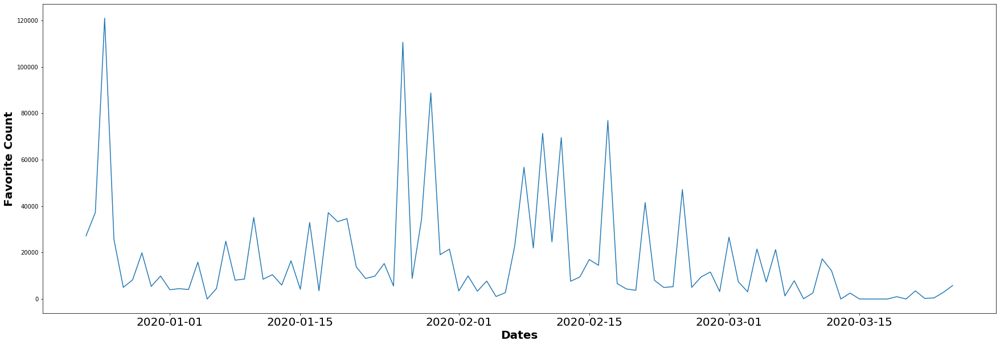

5) The Word Cloud


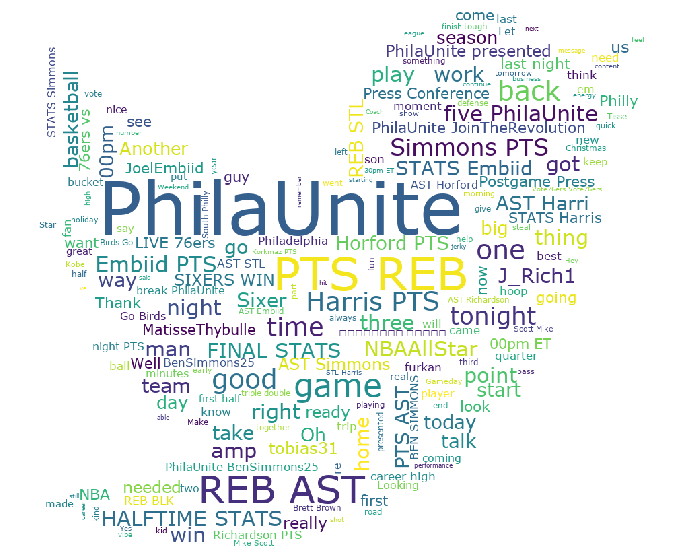

----------------------------2)Describtive statistics for team: Blazers----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
1025,1223340255748616193,2020-01-31 20:20:20,60491,13080,trailblazers,1296816,For Kobe &amp; Gigi https://t.co/yD8iY4Z5qI
2710,1196824227342684160,2019-11-19 16:15:06,27818,7249,trailblazers,1296816,"He's back.\n\nWelcome to Portland, @carmeloanthony! \n\n 🔗: https://t.co/4b1lNXcYQS https://t.co/AZqOJhG51g"
2312,1203173944464826369,2019-12-07 04:46:36,18921,2242,trailblazers,1296816,"MRI confirms Rodney Hood has a torn left Achilles tendon.\n\nWe love you, Rodney ❤️"
1092,1221669841813131264,2020-01-27 05:42:42,18888,3417,trailblazers,1296816,"""Our friendship &amp; relationship was deeper than basketball."" \n\nCarmelo Anthony remembers his brother, Kobe Bryant. https://t.co/Wxxuf0Lw5x"
1021,1223393574907047936,2020-01-31 23:52:12,15331,2382,trailblazers,1296816,"“It's a huge loss for the world, a huge loss for the game of basketball, but most importantly his family. They've g… https://t.co/55y8YxZtDm"


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3208.00,3208.00,3208.00
mean,464.20,125.09,1296816.00
std,1635.96,1284.07,0.00
min,0.00,0.00,1296816.00
25%,6.00,10.00,1296816.00
50%,161.00,24.00,1296816.00
75%,379.25,56.00,1296816.00
max,60491.00,61976.00,1296816.00


>> Most favorite tweet:
1025    For Kobe &amp; Gigi https://t.co/yD8iY4Z5qI
Name: text, dtype: object
>> Most retweeted tweet:
1022    RT @Lakers: The House That Kobe Built https://t.co/1exfvaXnE8
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-28 00:20:32] to [2020-03-26 04:30:43] / days = 150 days 04:10:11
Orignal number of tweets = 2612
Orignal number of retweets = 596
average tweets per day = 17.413333333333334

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,20.36,10560.93,3166.52
std,16.45,16033.69,9704.50
min,3.00,93.00,58.00
25%,8.00,1730.50,344.50
50%,11.50,5035.50,891.00
75%,31.00,10970.00,2008.25
max,72.00,88574.00,80532.00


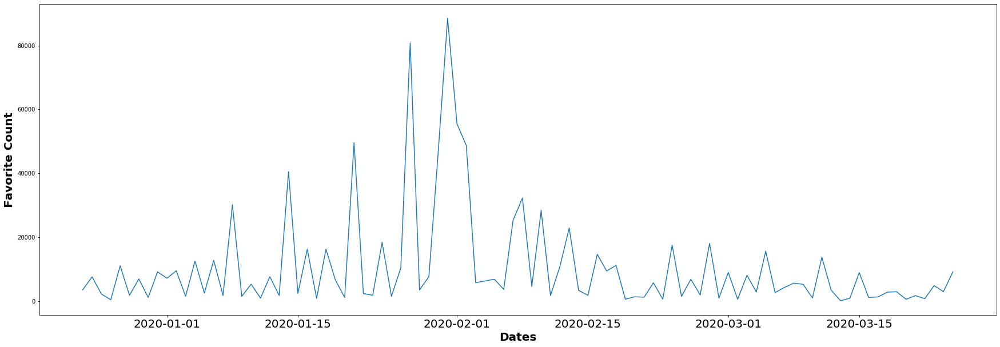

5) The Word Cloud


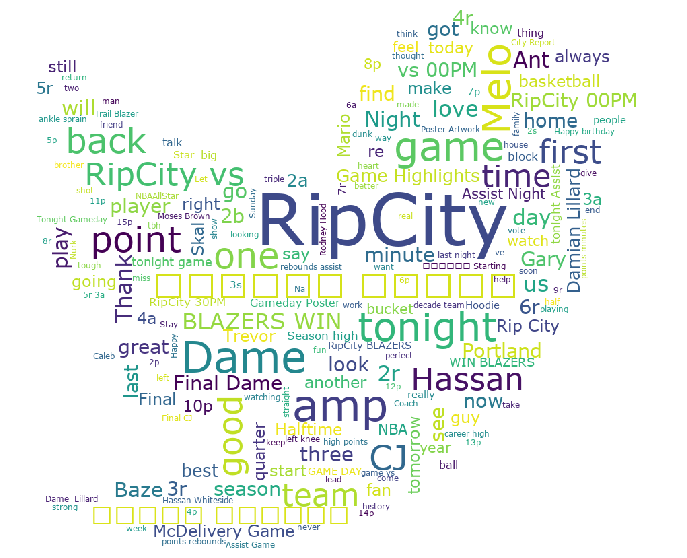

----------------------------3)Describtive statistics for team: Bucks----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2200,1207868665355546625,2019-12-20 03:41:45,114732,19585,Bucks,1232313,Was this just for preseason?\n\nAsking for a friend. https://t.co/JgRVg4itWe
2592,1202966172959821830,2019-12-06 15:01:00,21392,3944,Bucks,1232313,Happy 25th Birthday @Giannis_An34!!\n\n🎉🎊🎂 https://t.co/xAMdb3B0IK
902,1227005337506586629,2020-02-10 23:04:03,19558,1741,Bucks,1232313,"Giannis is out (new dad) tonight. \n\nCongrats, @giannis_an34 👶🏾 https://t.co/N0RLZwnQxk"
523,1232510610526609409,2020-02-26 03:40:03,13957,2949,Bucks,1232313,https://t.co/rWYOag9ZNW https://t.co/wK4gRY065U
1497,1217279195799310337,2020-01-15 02:55:50,13504,2181,Bucks,1232313,🗣️ GO PACK GO \n\n#ThePackIsBack x #FearTheDeer https://t.co/nKYOhUsY1r


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3201.00,3201.00,3201.00
mean,671.76,143.97,1232313.00
std,2347.11,1106.05,0.00
min,0.00,0.00,1232313.00
25%,139.00,16.00,1232313.00
50%,309.00,33.00,1232313.00
75%,687.00,79.00,1232313.00
max,114732.00,43983.00,1232313.00


>> Most favorite tweet:
2200    Was this just for preseason?\n\nAsking for a friend. https://t.co/JgRVg4itWe
Name: text, dtype: object
>> Most retweeted tweet:
167    RT @NBA: NBA To Suspend Season Following Tonight's Games https://t.co/2PTx2fkLlW
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-11-17 20:46:00] to [2020-03-26 02:14:04] / days = 129 days 05:28:04
Orignal number of tweets = 2779
Orignal number of retweets = 422
average tweets per day = 21.54263565891473

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,22.51,15929.15,3764.47
std,14.24,13285.70,7356.16
min,1.00,0.00,70.00
25%,10.25,6406.00,850.75
50%,18.00,11812.50,1691.50
75%,36.75,24084.50,3690.50
max,53.00,59412.00,57019.00


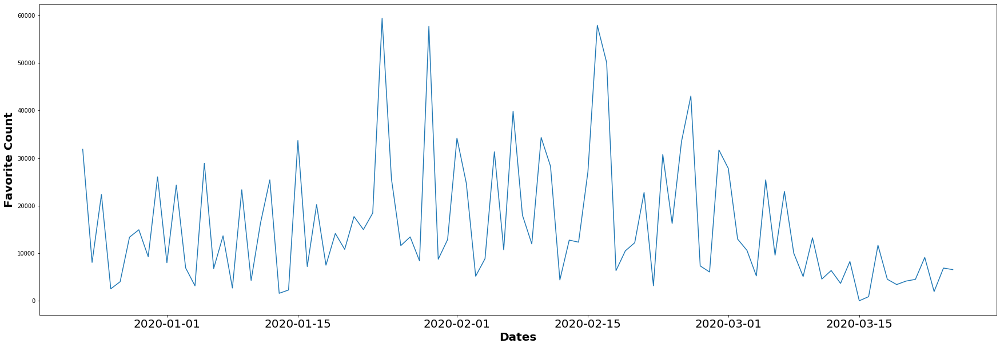

5) The Word Cloud


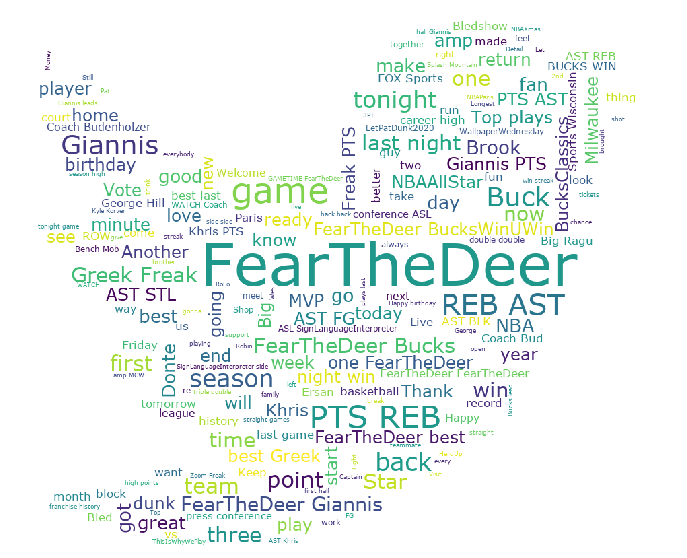

----------------------------4)Describtive statistics for team: Bulls----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
359,1229404380505481217,2020-02-17 13:57:00,54026,11901,chicagobulls,4143215,"Happy Birthday, Michael! 🐐 https://t.co/xL7hCDDePd"
602,1221966357723480064,2020-01-28 01:20:57,30920,5228,chicagobulls,4143215,For Kobe ❤️ https://t.co/IkBUXToavD
2096,1184896045077225473,2019-10-17 18:16:46,25182,4861,chicagobulls,4143215,OFFICIAL: @LuolDeng9 to retire as a Chicago Bull.\n\nMore:
383,1228495550904983553,2020-02-15 01:45:38,16236,2675,chicagobulls,4143215,Spice Adams got that handle 😂😂😂 https://t.co/vWeLIZ1sok
250,1232501264874921985,2020-02-26 03:02:54,15225,2928,chicagobulls,4143215,Coby White is the first rookie in @NBA history to score 30+ points in three consecutive games coming off the bench. https://t.co/5zyweqs19c


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3201.00,3201.00,3201.00
mean,655.78,121.00,4143215.00
std,1667.60,373.29,0.00
min,0.00,0.00,4143215.00
25%,120.00,21.00,4143215.00
50%,269.00,41.00,4143215.00
75%,648.00,99.00,4143215.00
max,54026.00,11901.00,4143215.00


>> Most favorite tweet:
359    Happy Birthday, Michael! 🐐 https://t.co/xL7hCDDePd
Name: text, dtype: object
>> Most retweeted tweet:
359    Happy Birthday, Michael! 🐐 https://t.co/xL7hCDDePd
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-04-26 15:13:25] to [2020-03-25 23:37:04] / days = 334 days 08:23:39
Orignal number of tweets = 2803
Orignal number of retweets = 398
average tweets per day = 8.392215568862275

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,11.28,9548.05,1793.82
std,7.89,13769.72,2672.28
min,0.00,0.00,0.00
25%,5.00,1911.75,363.75
50%,9.00,5941.00,949.50
75%,16.00,11575.50,2095.00
max,33.00,98256.00,19642.00


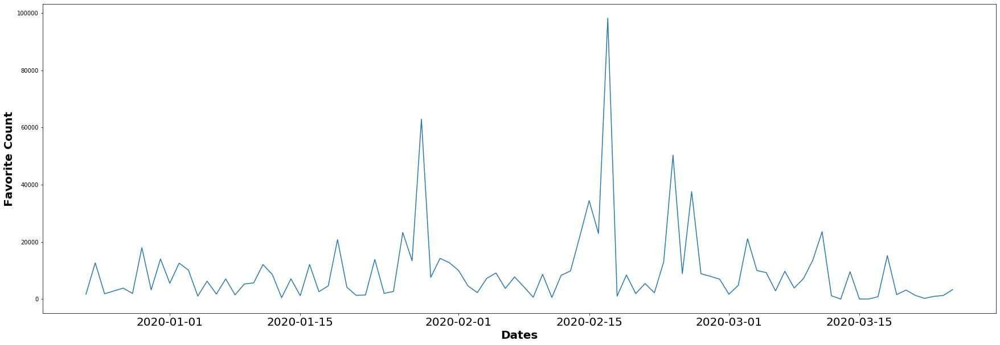

5) The Word Cloud


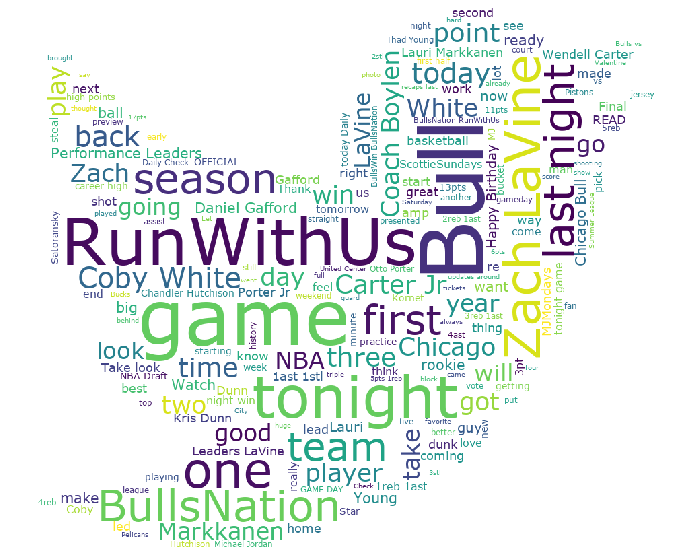

----------------------------5)Describtive statistics for team: Cavaliers----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
843,1225244771016265728,2020-02-06 02:28:12,106437,9401,cavs,3276382,"ARE YOU SERIOUS, CEDI OSMAN?! https://t.co/ncbo3Iyo4Z"
1102,1221554130478600193,2020-01-26 22:02:54,25746,3464,cavs,3276382,(1/2)\n \nWe stand in disbelief and shock at the horribly sad news of the tragic passing of NBA legend Kobe Bryant an… https://t.co/Y1CdkBItwD
1187,1220360063774273539,2020-01-23 14:58:07,23933,4174,cavs,3276382,The youngest to 30K. 👑\n\n@KingJames | #Cavs50 https://t.co/OvvCaq5wE5
1842,1208379090383728640,2019-12-21 13:30:00,23880,3202,cavs,3276382,when @kevinlove gives everybody a chest bump except the only other kevin on the team: \n\n@kevinporterjr 😂😂😂 https://t.co/XdWgsv9M78
1100,1221661899571519490,2020-01-27 05:11:08,15462,2349,cavs,3276382,"Your memory lives everywhere, Kobe. https://t.co/Wi1CRE1pqs"


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3249.00,3249.00,3249.00
mean,391.38,83.70,3276382.00
std,2136.84,831.74,0.00
min,0.00,0.00,3276382.00
25%,3.00,11.00,3276382.00
50%,146.00,21.00,3276382.00
75%,328.00,42.00,3276382.00
max,106437.00,43983.00,3276382.00


>> Most favorite tweet:
843    ARE YOU SERIOUS, CEDI OSMAN?! https://t.co/ncbo3Iyo4Z
Name: text, dtype: object
>> Most retweeted tweet:
79    RT @NBA: NBA To Suspend Season Following Tonight's Games https://t.co/2PTx2fkLlW
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-15 20:40:21] to [2020-03-26 00:00:06] / days = 162 days 03:19:45
Orignal number of tweets = 2444
Orignal number of retweets = 805
average tweets per day = 15.08641975308642

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,19.49,8692.16,2120.56
std,12.85,13831.28,5224.31
min,0.00,0.00,0.00
25%,9.00,2002.75,376.25
50%,15.50,4138.00,749.50
75%,32.75,10306.25,2201.75
max,55.00,116142.00,47877.00


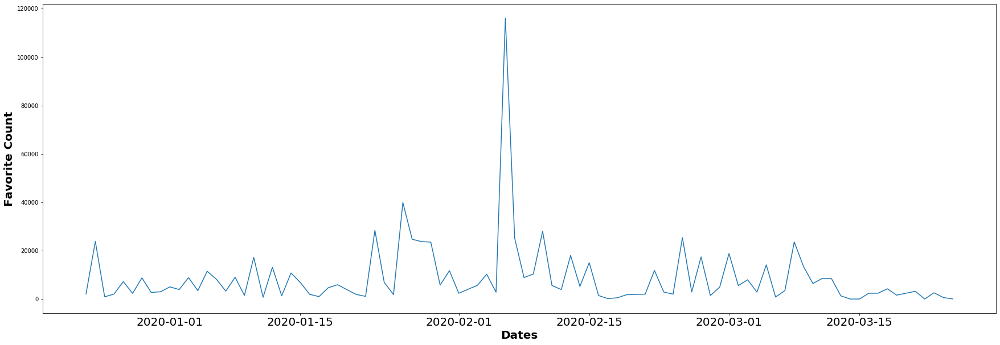

5) The Word Cloud


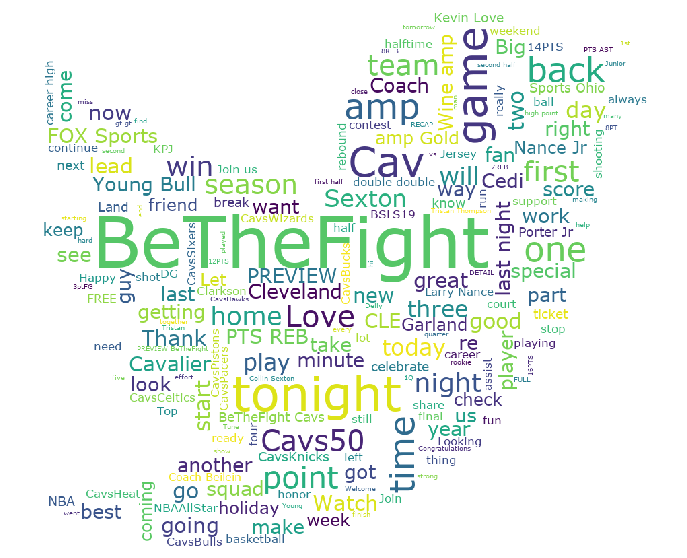

----------------------------6)Describtive statistics for team: Celtics----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
973,1221561006389911553,2020-01-26 22:30:14,62583,11688,celtics,3560217,There are no words that can convey the heartbreak the entire Celtics organization feels in the wake of the terrible… https://t.co/sR1Rmcxo8l
969,1221575124610097155,2020-01-26 23:26:20,59851,14343,celtics,3560217,"Bigger than basketball. \n\nRest In Peace, 24 🙏 https://t.co/oL4ERWEx4m"
323,1234818304780402688,2020-03-03 12:30:00,21774,3933,celtics,3560217,Happy 22nd birthday @jaytatum0! 🎉☘️🎂 https://t.co/I6ZNJHEGPs
1109,1219455532970512385,2020-01-21 03:03:50,19715,5845,celtics,3560217,#BeatLA ✅ https://t.co/Se8sSwi9bK
922,1223053338457124869,2020-01-31 01:20:13,17652,4117,celtics,3560217,Legends never die #MambaForever💜💛 https://t.co/VPTrx2zANZ


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3215.00,3215.00,3215.00
mean,1293.12,225.46,3560217.00
std,2424.07,646.99,0.00
min,0.00,0.00,3560217.00
25%,303.50,44.00,3560217.00
50%,696.00,88.00,3560217.00
75%,1360.00,192.50,3560217.00
max,62583.00,19958.00,3560217.00


>> Most favorite tweet:
973    There are no words that can convey the heartbreak the entire Celtics organization feels in the wake of the terrible… https://t.co/sR1Rmcxo8l
Name: text, dtype: object
>> Most retweeted tweet:
140    RT @smart_MS3: I was tested 5 days ago and the results came back tonight, which were positive. Ive been self quarantined since the test, th…
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-09-12 18:52:50] to [2020-03-26 01:14:26] / days = 195 days 06:21:36
Orignal number of tweets = 2898
Orignal number of retweets = 317
average tweets per day = 14.861538461538462

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,18.51,24489.02,4408.46
std,12.35,27151.55,5808.83
min,0.00,0.00,0.00
25%,8.25,7268.00,1060.50
50%,15.50,15785.00,2604.00
75%,28.75,33606.25,5083.00
max,51.00,161880.00,32012.00


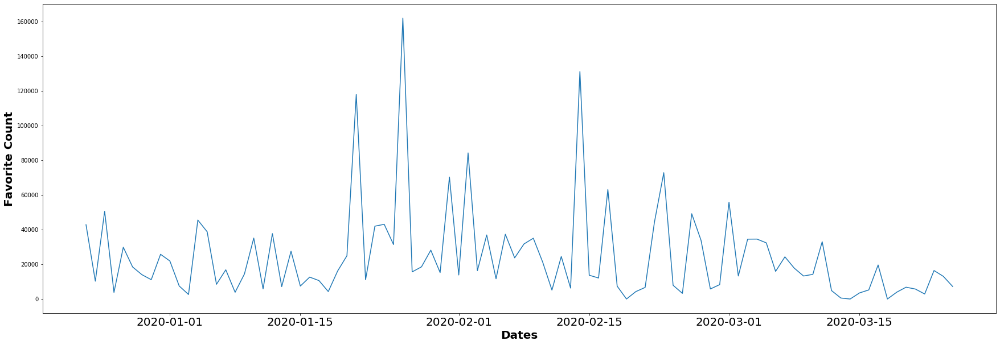

5) The Word Cloud


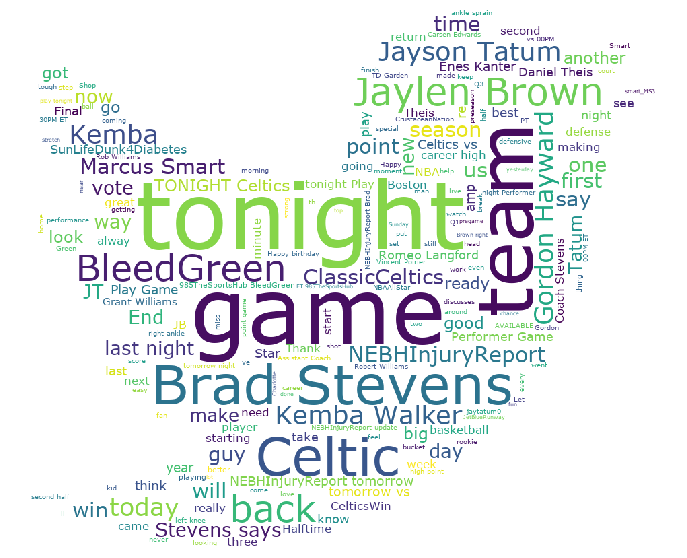

----------------------------7)Describtive statistics for team: Clippers----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
802,1223086695253282817,2020-01-31 03:32:46,35066,7088,LAClippers,1626258,𝐑𝐞𝐦𝐞𝐦𝐛𝐞𝐫𝐢𝐧𝐠 𝐊𝐨𝐛𝐞 𝐁𝐫𝐲𝐚𝐧𝐭\n\nNarrated by @Yg_Trece https://t.co/Bu8Jz6hVHE
1167,1215883376739008513,2020-01-11 06:29:21,29761,19896,LAClippers,1626258,"Thanks for stopping by, Yugyeom. \n\n@GOT7Official | #ClipperNation https://t.co/HyEr8lOPFJ"
819,1221575609823875074,2020-01-26 23:28:15,26402,6059,LAClippers,1626258,24 and 8 for No. 24 and No. 8 https://t.co/dUzZ1mX3RE
821,1221570664009584640,2020-01-26 23:08:36,23411,3715,LAClippers,1626258,Statement from Jerry West. https://t.co/xzseGDLaLm
3158,1148993141912961024,2019-07-10 16:31:26,22215,5462,LAClippers,1626258,𝙒𝙀𝙇𝘾𝙊𝙈𝙀 𝙃𝙊𝙈𝙀\n\n@kawhileonard is officially a Clipper. https://t.co/EuZ5Zaixy0


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3219.00,3219.00,3219.00
mean,688.50,121.63,1626258.00
std,1560.34,514.32,0.00
min,0.00,0.00,1626258.00
25%,193.00,23.00,1626258.00
50%,345.00,43.00,1626258.00
75%,682.00,93.00,1626258.00
max,35066.00,19896.00,1626258.00


>> Most favorite tweet:
802    𝐑𝐞𝐦𝐞𝐦𝐛𝐞𝐫𝐢𝐧𝐠 𝐊𝐨𝐛𝐞 𝐁𝐫𝐲𝐚𝐧𝐭\n\nNarrated by @Yg_Trece https://t.co/Bu8Jz6hVHE
Name: text, dtype: object
>> Most retweeted tweet:
1167    Thanks for stopping by, Yugyeom. \n\n@GOT7Official | #ClipperNation https://t.co/HyEr8lOPFJ
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-07-02 22:00:54] to [2020-03-25 21:24:16] / days = 266 days 23:23:22
Orignal number of tweets = 3026
Orignal number of retweets = 193
average tweets per day = 11.37593984962406

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,16.27,10646.95,1854.50
std,14.58,13971.63,3412.58
min,0.00,0.00,0.00
25%,5.00,2349.50,299.25
50%,11.00,6351.00,779.50
75%,25.75,14386.75,1979.25
max,51.00,83896.00,22649.00


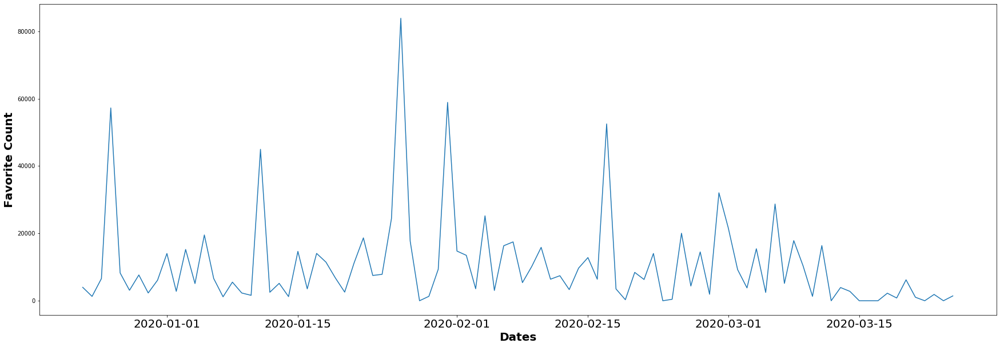

5) The Word Cloud


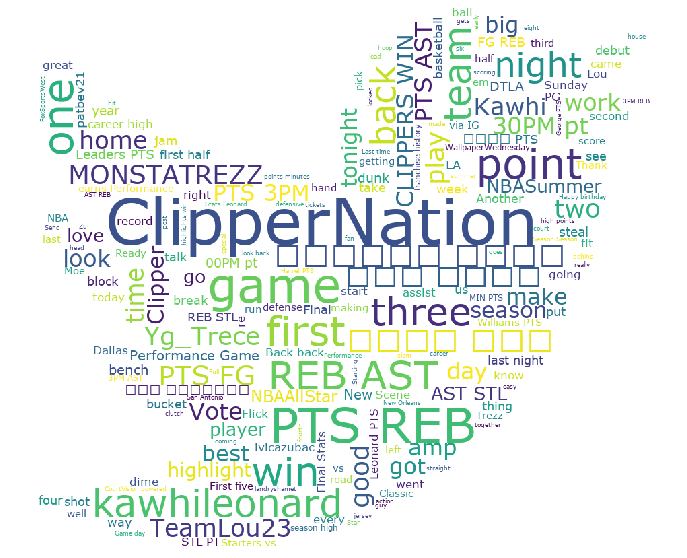

----------------------------8)Describtive statistics for team: Grizzlies----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
767,1231073162374320129,2020-02-22 04:28:08,17476,1708,memgrizz,1097162,**cue Spiderman meme** https://t.co/MPCo9SPJqw
2720,1206058776559792128,2019-12-15 03:49:54,15776,3093,memgrizz,1097162,歴史 \n\n🤝🇯🇵\n\n@wacchi1013 x @rui_8mura https://t.co/ogyXOkhbif
1714,1218370851076288513,2020-01-18 03:13:41,15691,3124,memgrizz,1097162,unreal. https://t.co/1OIDOjUxFt
1231,1224691650800312321,2020-02-04 13:50:17,12967,999,memgrizz,1097162,Waking up reading our mentions like....... https://t.co/bWgiOXQB7s
1312,1223796822914801664,2020-02-02 02:34:34,10475,1319,memgrizz,1097162,#12 will never be worn again at @RacersHoops.\n\n@JaMorant | #GrzNxtGen https://t.co/uAJkDR2BGT


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3248.00,3248.00,3248.00
mean,211.45,84.91,1097162.00
std,760.50,592.10,0.00
min,0.00,0.00,1097162.00
25%,2.00,6.00,1097162.00
50%,58.00,14.00,1097162.00
75%,165.00,36.25,1097162.00
max,17476.00,25037.00,1097162.00


>> Most favorite tweet:
767    **cue Spiderman meme** https://t.co/MPCo9SPJqw
Name: text, dtype: object
>> Most retweeted tweet:
931    RT @JaMorant: control what you can control ✍🏽
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-11-27 17:27:32] to [2020-03-26 12:00:00] / days = 119 days 18:32:28
Orignal number of tweets = 2467
Orignal number of retweets = 781
average tweets per day = 20.73109243697479

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,25.96,6153.98,2527.98
std,20.56,7539.29,4059.69
min,0.00,0.00,0.00
25%,10.00,996.00,427.50
50%,19.50,3531.50,1076.00
75%,41.75,7089.00,2749.50
max,80.00,33911.00,29278.00


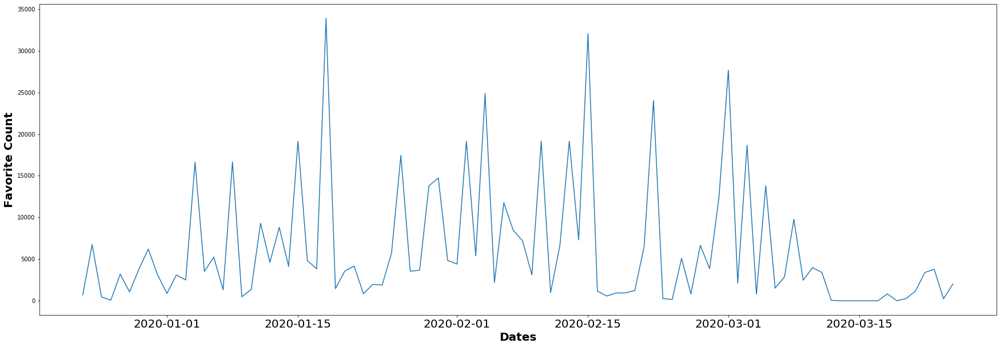

5) The Word Cloud


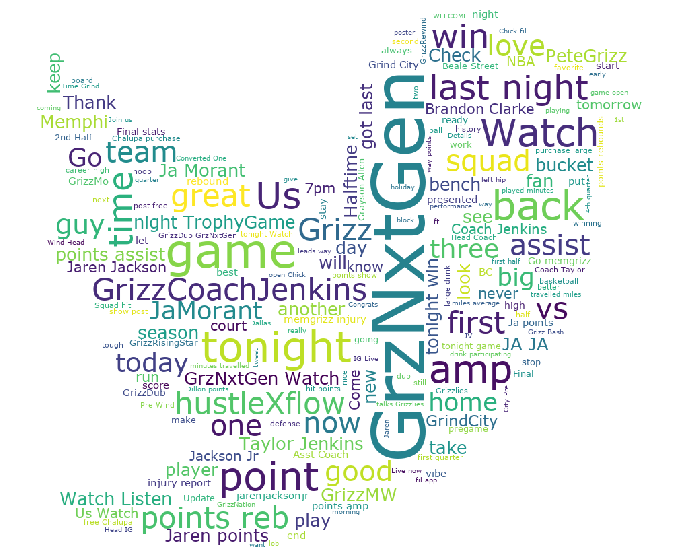

----------------------------9)Describtive statistics for team: Hawks----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2915,1191918338643046400,2019-11-06 03:20:51,17747,2480,ATLHawks,1271936,1-800-CALL-TRAE ❄️ https://t.co/dTOmDCbHQC
2256,1200979024136327168,2019-12-01 03:24:47,17160,2427,ATLHawks,1271936,Final from Houston. https://t.co/p8lrqUfcfT
2591,1196294265401311232,2019-11-18 05:09:13,15218,1369,ATLHawks,1271936,❄️ x 🐍\n\n#TrueToAtlanta https://t.co/h4X6wr5lbc
1075,1221584136009388032,2020-01-27 00:02:08,10854,1361,ATLHawks,1271936,No. 8 https://t.co/i7YyFdCydA
849,1225275880362127361,2020-02-06 04:31:49,9075,1103,ATLHawks,1271936,"🗣🗣🗣\n\n@CapelaClint checking in for the first time, Hawks fans \n\n#TrueToAtlanta https://t.co/We9KOPNH9x"


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3200.00,3200.00,3200.00
mean,211.94,40.20,1271940.56
std,701.67,231.99,17.67
min,0.00,0.00,1271936.00
25%,39.75,8.00,1271936.00
50%,81.00,14.00,1271936.00
75%,174.00,28.00,1271936.00
max,17747.00,11431.00,1272009.00


>> Most favorite tweet:
2915    1-800-CALL-TRAE ❄️ https://t.co/dTOmDCbHQC
Name: text, dtype: object
>> Most retweeted tweet:
1126    RT @TheTraeYoung: MAMA IMMA ALL STAR😭🙏🏽❤️❄️ https://t.co/DnPP3UdhQ0
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-25 01:28:26] to [2020-03-26 03:11:15] / days = 153 days 01:42:49
Orignal number of tweets = 3146
Orignal number of retweets = 54
average tweets per day = 20.562091503267975

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,19.70,4360.46,858.74
std,14.88,5413.41,1604.83
min,0.00,0.00,0.00
25%,7.00,730.00,126.50
50%,15.50,2548.50,432.50
75%,32.00,5568.50,1084.50
max,57.00,30248.00,13800.00


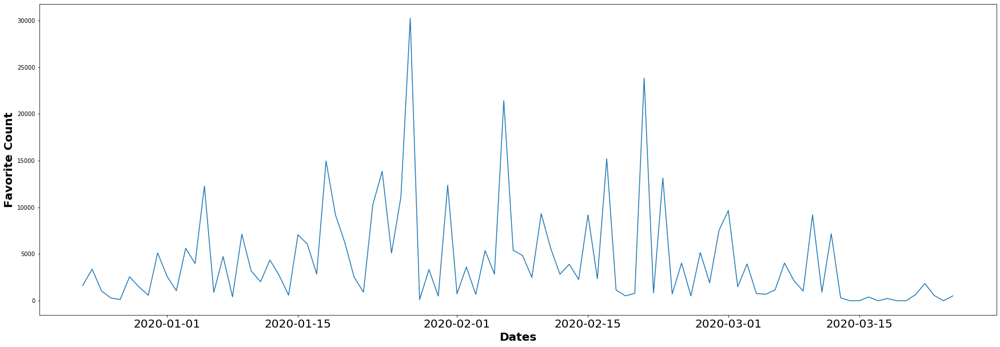

5) The Word Cloud


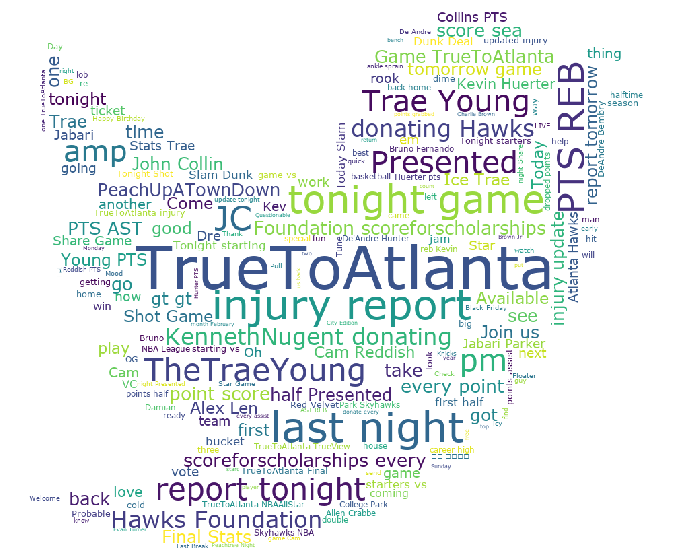

----------------------------10)Describtive statistics for team: Heat----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
629,1228904286077227008,2020-02-16 04:49:48,28355,6677,MiamiHEAT,4735009,Mood 🏆🏆 https://t.co/rh2Nuzjn1g
1030,1221534369854214150,2020-01-26 20:44:23,26140,4847,MiamiHEAT,4735009,"Our hearts are heavy with extreme sadness at this time. We extend our deepest prayers, thoughts and condolences to… https://t.co/dBk8QxZMHm"
537,1231067824103227393,2020-02-22 04:06:56,24281,6244,MiamiHEAT,4735009,❤️ https://t.co/c5kVHoUHZQ
492,1231436122661715969,2020-02-23 04:30:25,21195,5254,MiamiHEAT,4735009,This is and forever will be HIS house. https://t.co/cmRYZS2Sgf
1658,1210744438281998342,2019-12-28 02:09:03,20201,5459,MiamiHEAT,4735009,It’s been 3 years since @SilvaObame has seen his mother. Tonight they reunited and it was everything you could imag… https://t.co/aeWqPIhCEf


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3238.00,3238.00,3238.00
mean,979.87,182.80,4735009.00
std,1685.64,385.95,0.00
min,0.00,0.00,4735009.00
25%,235.00,33.00,4735009.00
50%,496.00,74.00,4735009.00
75%,1059.00,171.00,4735009.00
max,28355.00,6677.00,4735009.00


>> Most favorite tweet:
629    Mood 🏆🏆 https://t.co/rh2Nuzjn1g
Name: text, dtype: object
>> Most retweeted tweet:
629    Mood 🏆🏆 https://t.co/rh2Nuzjn1g
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-09-27 17:57:54] to [2020-03-26 03:13:10] / days = 180 days 09:15:16
Orignal number of tweets = 3199
Orignal number of retweets = 39
average tweets per day = 17.772222222222222

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,18.19,19797.00,3610.76
std,15.35,25043.35,5450.49
min,0.00,0.00,0.00
25%,5.00,4501.25,605.25
50%,14.00,11382.50,1763.50
75%,31.25,25781.75,4315.00
max,59.00,158289.00,34484.00


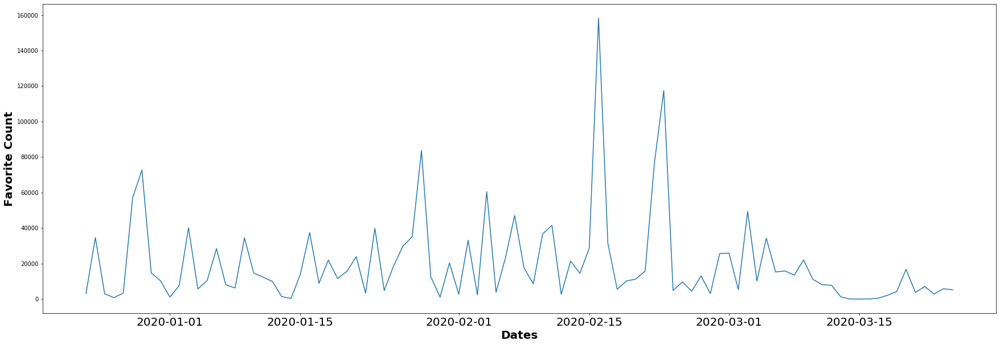

5) The Word Cloud


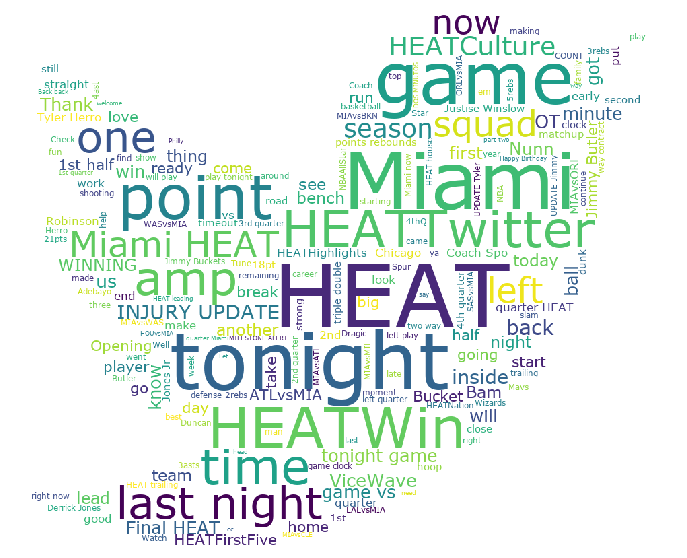

----------------------------11)Describtive statistics for team: Hornets----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2349,1198081153544134656,2019-11-23 03:29:40,27120,2834,hornets,979503,Get well soon Kemba.\n\n💜
3094,1187177627779588098,2019-10-24 01:22:57,12650,2187,hornets,979503,"Consider this a warning, @NBA.\n\n#AllFly https://t.co/barFeCIrO8"
352,1234199883495739395,2020-03-01 19:32:37,9577,621,hornets,979503,Our guy @DaBabyDaBaby and his son are in the house! 😀 #AllFly https://t.co/uLzB25LEou
1032,1222304625950437377,2020-01-28 23:45:06,8363,1008,hornets,979503,Tonight we’re wearing arm sleeves to honor Kobe Bryant. 💜 https://t.co/lColAmksft
2715,1192610171366912000,2019-11-08 01:09:57,6670,1586,hornets,979503,#BuzzCity will always have love for @KembaWalker. ✊🏽 https://t.co/sEVk71iFQP


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3209.00,3209.00,3209.00
mean,125.67,32.81,979503.00
std,632.36,319.81,0.00
min,0.00,0.00,979503.00
25%,24.00,5.00,979503.00
50%,44.00,9.00,979503.00
75%,98.00,19.00,979503.00
max,27120.00,15071.00,979503.00


>> Most favorite tweet:
2349    Get well soon Kemba.\n\n💜
Name: text, dtype: object
>> Most retweeted tweet:
1056    RT @esteep: Statement from Michael Jordan: https://t.co/oI7w6e7HLI
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-18 22:45:31] to [2020-03-26 01:25:19] / days = 159 days 02:39:48
Orignal number of tweets = 2976
Orignal number of retweets = 233
average tweets per day = 18.71698113207547

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,17.69,2118.45,703.74
std,12.12,2265.45,1873.21
min,0.00,0.00,0.00
25%,7.00,616.00,125.50
50%,16.00,1415.50,309.50
75%,28.00,2857.75,547.50
max,47.00,13017.00,15102.00


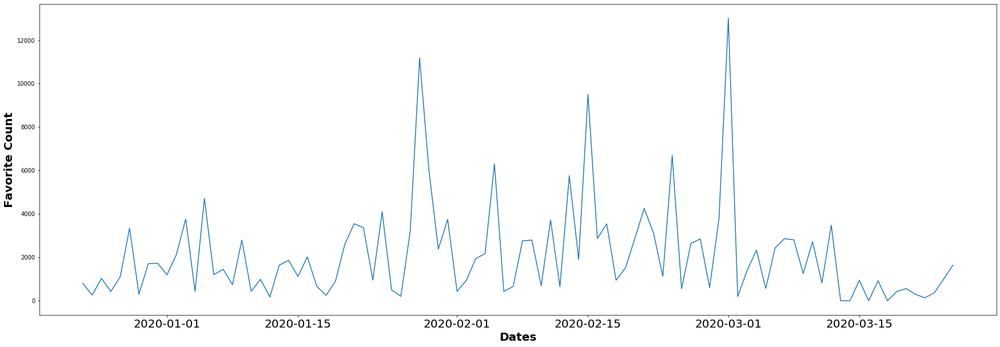

5) The Word Cloud


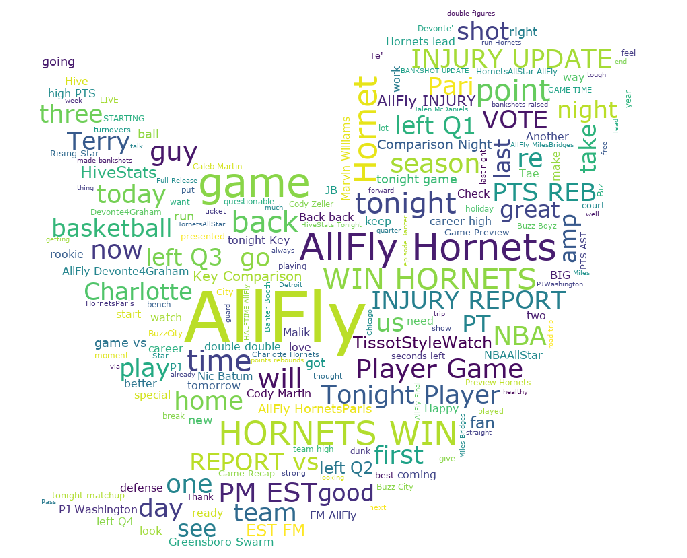

----------------------------12)Describtive statistics for team: Jazz----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
64,1238919215865716736,2020-03-14 20:05:33,18188,3276,utahjazz,992391,"Rudy Gobert is donating more than $500,000 to support both the employee relief fund at Vivint Smart Home Arena and… https://t.co/LYyZDmVeMl"
92,1237235414936633344,2020-03-10 04:34:44,13035,263,utahjazz,992391,@WorldWideWob somehow I doubt that
812,1226693450575175681,2020-02-10 02:24:44,8831,2416,utahjazz,992391,BIG. SHOT. BOJAN. \n\n#TakeNote https://t.co/1wWzd5HFPL
3113,1196603419764461569,2019-11-19 01:37:41,8511,896,utahjazz,992391,"We've got your back, Luc ❤️ https://t.co/4khlZsQh6I"
62,1239243993608667136,2020-03-15 17:36:06,6530,600,utahjazz,992391,A message from @rudygobert27 to the fans ❤️ https://t.co/8zAGDt97BR


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3229.00,3229.00,3229.00
mean,299.21,47.48,992391.00
std,645.63,360.56,0.00
min,0.00,0.00,992391.00
25%,84.00,5.00,992391.00
50%,152.00,10.00,992391.00
75%,291.00,24.00,992391.00
max,18188.00,14855.00,992391.00


>> Most favorite tweet:
64    Rudy Gobert is donating more than $500,000 to support both the employee relief fund at Vivint Smart Home Arena and… https://t.co/LYyZDmVeMl
Name: text, dtype: object
>> Most retweeted tweet:
58    RT @spidadmitchell: I’m seeing people still out and going to bars clubs restaurants beaches etc... as a country let’s help others and stay…
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-11-13 02:00:48] to [2020-03-26 01:12:38] / days = 133 days 23:11:50
Orignal number of tweets = 2933
Orignal number of retweets = 296
average tweets per day = 22.05263157894737

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,23.81,7869.04,1311.26
std,19.70,8619.77,2201.15
min,0.00,0.00,0.00
25%,8.00,1752.25,286.25
50%,15.50,3876.50,618.50
75%,38.00,11965.75,1289.75
max,75.00,39820.00,14855.00


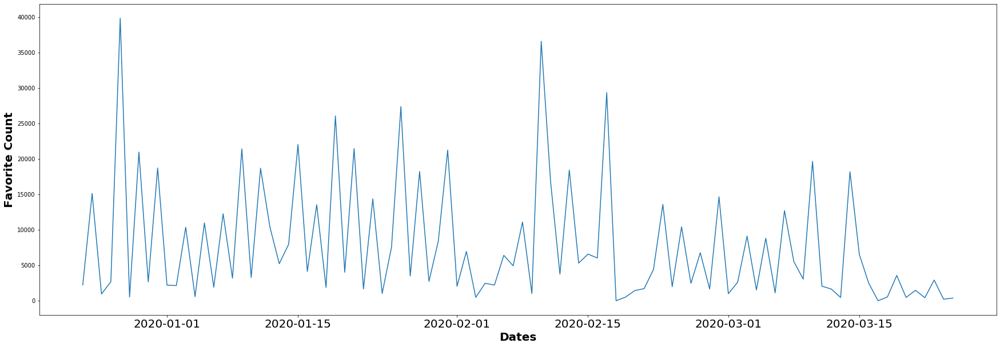

5) The Word Cloud


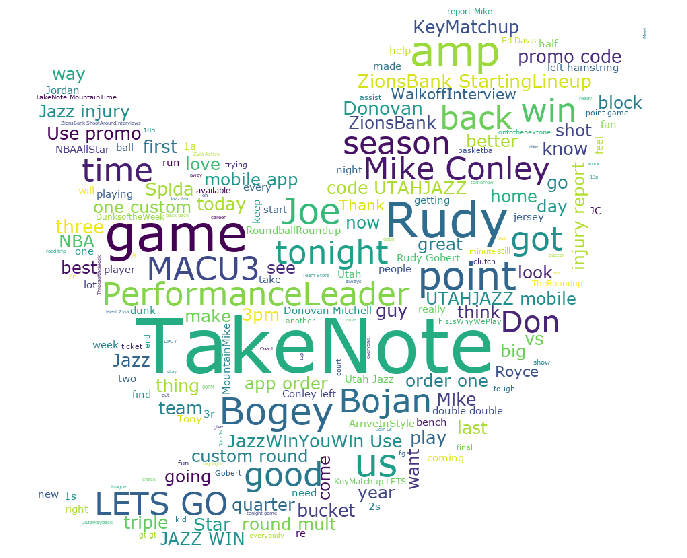

----------------------------13)Describtive statistics for team: Kings----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
1701,1204241763910578176,2019-12-10 03:29:44,22156,4344,SacramentoKings,1081477,Protest that. #KingsFTW
908,1222716814754492416,2020-01-30 03:03:00,17890,4229,SacramentoKings,1081477,"Rivalries come and go, but legends never die. \n\nFor Kobe &amp; Gianna 💜💛 https://t.co/yYUZ5Syz09"
842,1223789191089160192,2020-02-02 02:04:14,13983,1376,SacramentoKings,1081477,For Mamba &amp; Mambacita. https://t.co/10nUO0wx7B
59,1238332467095826432,2020-03-13 05:14:01,13190,337,SacramentoKings,1081477,@WorldWideWob We're on it ✊
779,1225147116760121344,2020-02-05 20:00:09,9970,519,SacramentoKings,1081477,"👑 x @GibsonHazard\n\nIntroducing the Kings newest intro video collaboration, presented by Lucky Lager 🎥 https://t.co/ZYfnUr8cdq"


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3210.00,3210.00,3210.00
mean,226.71,64.17,1081477.00
std,805.72,799.37,0.00
min,0.00,0.00,1081477.00
25%,0.00,4.00,1081477.00
50%,51.00,12.00,1081477.00
75%,176.00,37.00,1081477.00
max,22156.00,43983.00,1081477.00


>> Most favorite tweet:
1701    Protest that. #KingsFTW
Name: text, dtype: object
>> Most retweeted tweet:
96    RT @NBA: NBA To Suspend Season Following Tonight's Games https://t.co/2PTx2fkLlW
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-09-26 22:58:10] to [2020-03-26 00:14:36] / days = 181 days 01:16:26
Orignal number of tweets = 2308
Orignal number of retweets = 902
average tweets per day = 12.751381215469614

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,15.49,4278.90,1421.15
std,10.79,8164.85,4844.33
min,0.00,0.00,0.00
25%,7.00,339.50,175.25
50%,13.00,1836.00,334.50
75%,22.00,3770.75,895.75
max,46.00,46466.00,44206.00


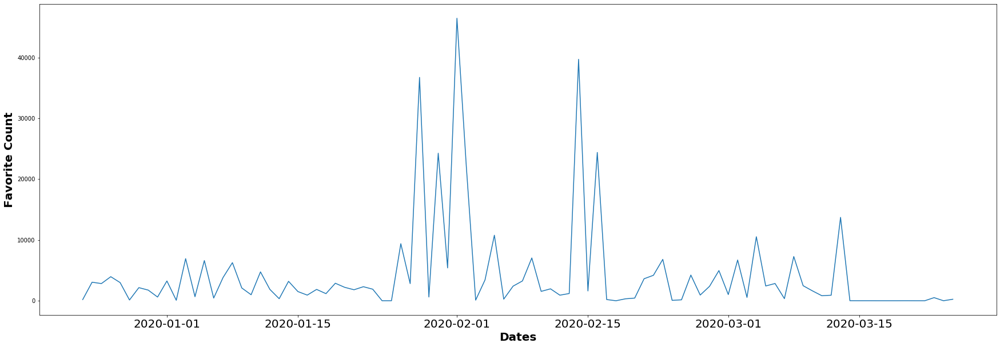

5) The Word Cloud


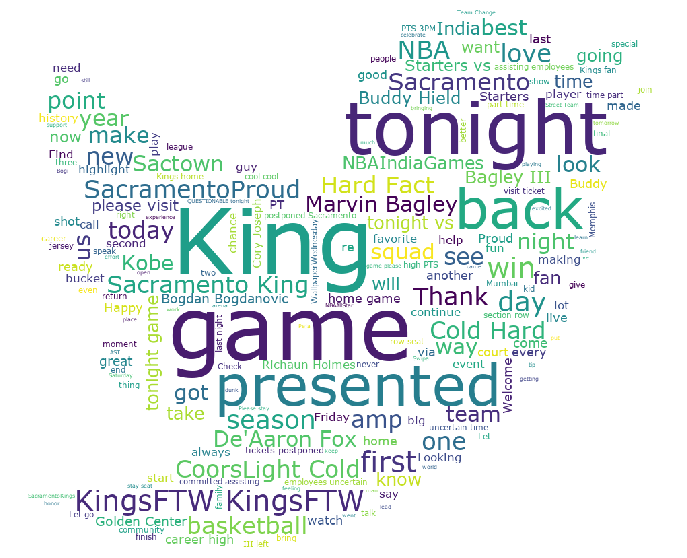

----------------------------14)Describtive statistics for team: Knicks----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
782,1221578887735513088,2020-01-26 23:41:17,25329,6451,nyknicks,2178385,"A moment of silence for the NBA and global icon, Kobe Bryant. https://t.co/wTLAv7Hq2R"
779,1221601622117310467,2020-01-27 01:11:37,18349,3623,nyknicks,2178385,"Thank you, Kobe. https://t.co/C2UArGthGv"
2859,1142915447840563201,2019-06-23 22:00:51,17393,3615,nyknicks,2178385,No feeling like your first Garden welcome ✨ #NewYorkForever https://t.co/go1263Trpv
2907,1141856190944538625,2019-06-20 23:51:45,14306,6136,nyknicks,2178385,🗣 LET’S GOOOOOOOOOOOO #KnicksDraft2019 (@sapsports) https://t.co/YVD1PU0xmb
2801,1147328380246736896,2019-07-06 02:16:16,8971,1117,nyknicks,2178385,1st bucket for @RjBarrett6 🙌 https://t.co/wqs3xFokAg


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3244.00,3244.00,3244.00
mean,565.93,92.98,2178385.00
std,1055.44,242.45,0.00
min,0.00,0.00,2178385.00
25%,137.00,18.00,2178385.00
50%,269.50,35.00,2178385.00
75%,586.00,81.00,2178385.00
max,25329.00,6451.00,2178385.00


>> Most favorite tweet:
782    A moment of silence for the NBA and global icon, Kobe Bryant. https://t.co/wTLAv7Hq2R
Name: text, dtype: object
>> Most retweeted tweet:
782    A moment of silence for the NBA and global icon, Kobe Bryant. https://t.co/wTLAv7Hq2R
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-04-01 00:33:01] to [2020-03-25 15:43:27] / days = 359 days 15:10:26
Orignal number of tweets = 3034
Orignal number of retweets = 210
average tweets per day = 8.45125348189415

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,14.71,6497.35,1020.78
std,10.99,7132.93,1433.48
min,0.00,0.00,0.00
25%,7.00,2210.75,286.75
50%,12.50,4420.50,621.50
75%,23.75,8672.25,1150.00
max,50.00,40645.00,10038.00


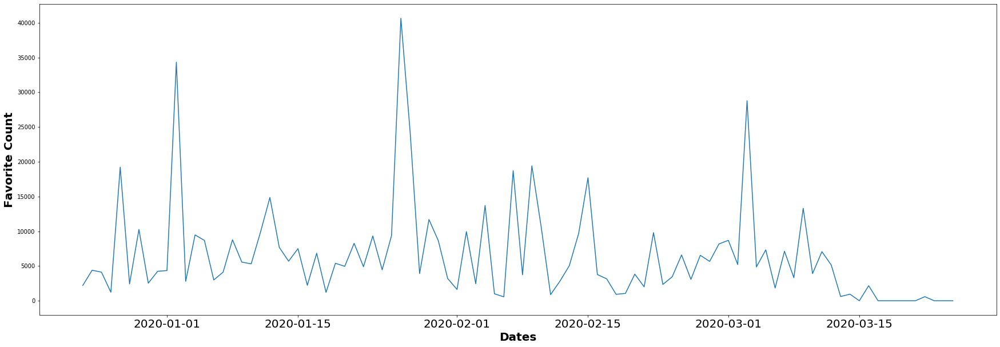

5) The Word Cloud


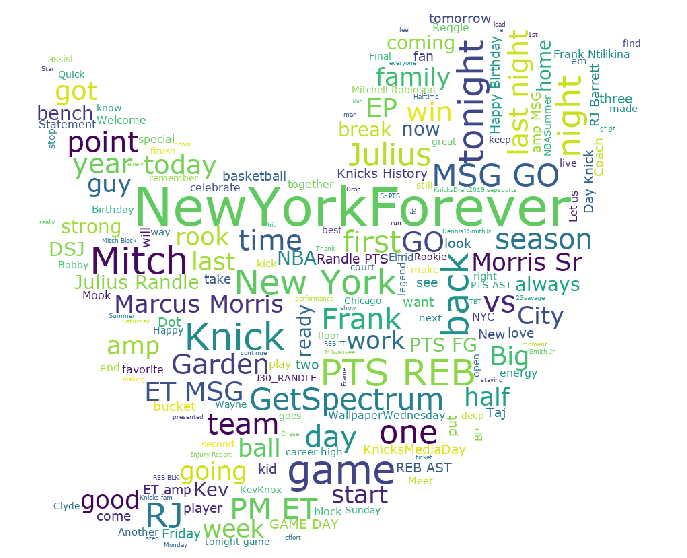

----------------------------15)Describtive statistics for team: Lakers----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
1075,1222730020377858048,2020-01-30 03:55:28,1038594,152137,Lakers,8803559,https://t.co/xC6TfbWzqp
898,1225939385515823104,2020-02-08 00:28:21,759441,209814,Lakers,8803559,Same arena. Same basket. Same dunk. 19 years apart. 💜💛 https://t.co/fj7HRmqv3c
1050,1223456959766024192,2020-02-01 04:04:04,379120,96754,Lakers,8803559,"""Tonight we celebrate the kid that came here at 18, retired at 38 and became probably the best dad we've seen over… https://t.co/BeOrn7Wtvv"
1069,1223369668238307328,2020-01-31 22:17:12,340382,61976,Lakers,8803559,The House That Kobe Built https://t.co/1exfvaXnE8
1061,1223418462925549568,2020-02-01 01:31:06,277857,63236,Lakers,8803559,#GirlDad https://t.co/vAdwfoKcJh


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3235.00,3235.00,3235.00
mean,6316.75,1472.73,8803559.32
std,27211.27,11413.67,0.47
min,0.00,0.00,8803559.00
25%,806.50,166.00,8803559.00
50%,2389.00,355.00,8803559.00
75%,5860.50,908.00,8803560.00
max,1038594.00,522842.00,8803560.00


>> Most favorite tweet:
1075    https://t.co/xC6TfbWzqp
Name: text, dtype: object
>> Most retweeted tweet:
1084    RT @kobebryant: Continuing to move the game forward @KingJames. Much respect my brother 💪🏾 #33644
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-31 21:11:47] to [2020-03-26 00:01:03] / days = 146 days 02:49:16
Orignal number of tweets = 2684
Orignal number of retweets = 551
average tweets per day = 18.383561643835616

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,20.21,159908.50,38819.44
std,17.62,283459.18,87280.99
min,0.00,0.00,0.00
25%,6.00,25086.00,5433.25
50%,11.00,67017.00,11294.50
75%,37.50,181159.25,34756.75
max,58.00,2207229.00,563041.00


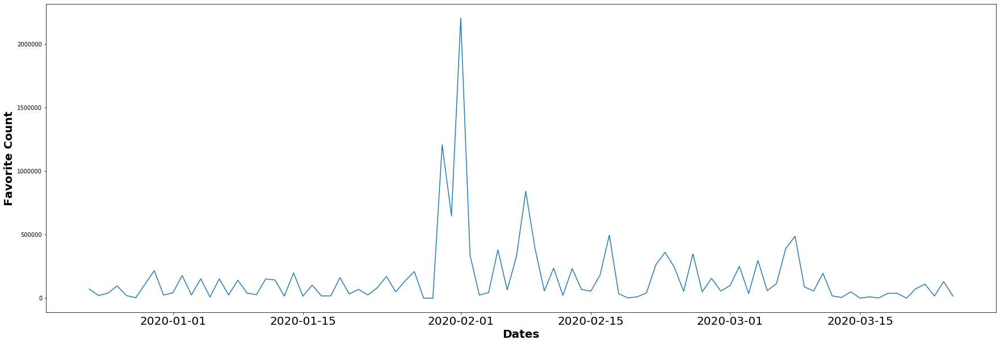

5) The Word Cloud


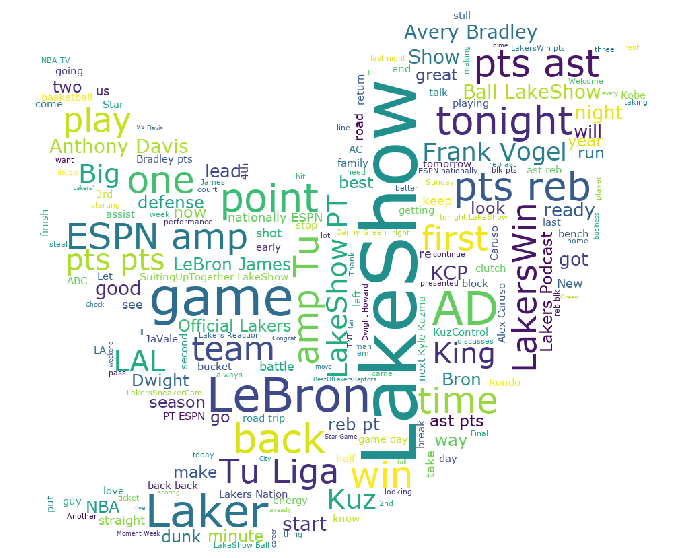

----------------------------16)Describtive statistics for team: Magic----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
808,1221573521471610880,2020-01-26 23:19:57,21935,6174,OrlandoMagic,1505759,𝟐𝟒 𝐟𝐨𝐫 𝐍𝐨. 𝟐𝟒\n\n𝟖 𝐟𝐨𝐫 𝐍𝐨. 𝟖\n\n#RIPMAMBA https://t.co/4gFefGCFei
809,1221535975207309318,2020-01-26 20:50:46,6310,1300,OrlandoMagic,1505759,The Orlando Magic is deeply saddened to learn of the passing of Kobe Bryant. Our thoughts and prayers go out to the… https://t.co/TbWGNUCke6
2892,1176898340283408391,2019-09-25 16:36:44,5353,1410,OrlandoMagic,1505759,In case you were wondering what Markelle's been up to... https://t.co/3RE39oLN51
492,1228886127165214721,2020-02-16 03:37:38,5180,1188,OrlandoMagic,1505759,"""𝐘𝐨𝐮 𝐝𝐮𝐧𝐤 𝐨𝐯𝐞𝐫 𝐓𝐚𝐜𝐤𝐨 𝐲𝐨𝐮 (𝙨𝙝𝙤𝙪𝙡𝙙) 𝐰𝐢𝐧.""\n\n@Double0AG | #MagicAboveAll https://t.co/SltG5wUniI"
727,1224392306880544770,2020-02-03 18:00:48,3854,162,OrlandoMagic,1505759,Ending the week at our place! https://t.co/M31lizDlqw


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3239.00,3239.00,3239.00
mean,150.03,51.14,1505759.00
std,492.53,786.91,0.00
min,0.00,0.00,1505759.00
25%,30.00,5.00,1505759.00
50%,66.00,11.00,1505759.00
75%,140.50,25.00,1505759.00
max,21935.00,32050.00,1505759.00


>> Most favorite tweet:
808    𝟐𝟒 𝐟𝐨𝐫 𝐍𝐨. 𝟐𝟒\n\n𝟖 𝐟𝐨𝐫 𝐍𝐨. 𝟖\n\n#RIPMAMBA https://t.co/4gFefGCFei
Name: text, dtype: object
>> Most retweeted tweet:
15    RT @Nike: Now more than ever, we are one team. #playinside #playfortheworld https://t.co/LRLhL4FwkG
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-07-25 00:07:46] to [2020-03-26 05:46:11] / days = 245 days 05:38:25
Orignal number of tweets = 2916
Orignal number of retweets = 323
average tweets per day = 11.902040816326531

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,15.98,2582.45,1161.04
std,10.72,3587.76,4793.40
min,0.00,0.00,0.00
25%,8.00,791.50,104.75
50%,12.00,1583.50,247.00
75%,24.00,3550.50,601.25
max,41.00,28651.00,33817.00


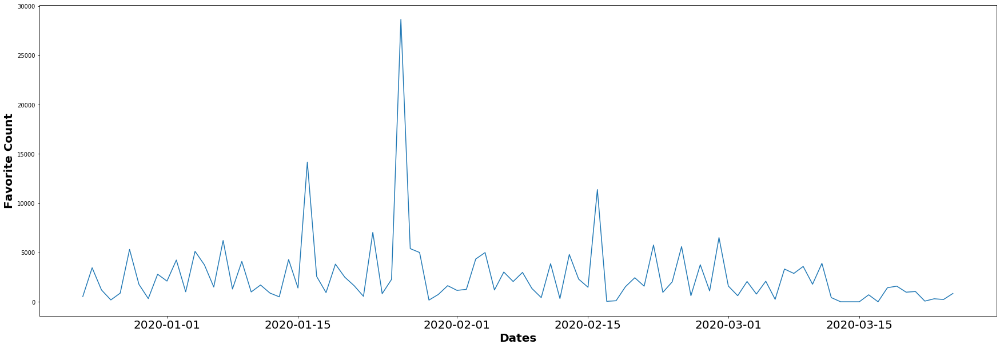

5) The Word Cloud


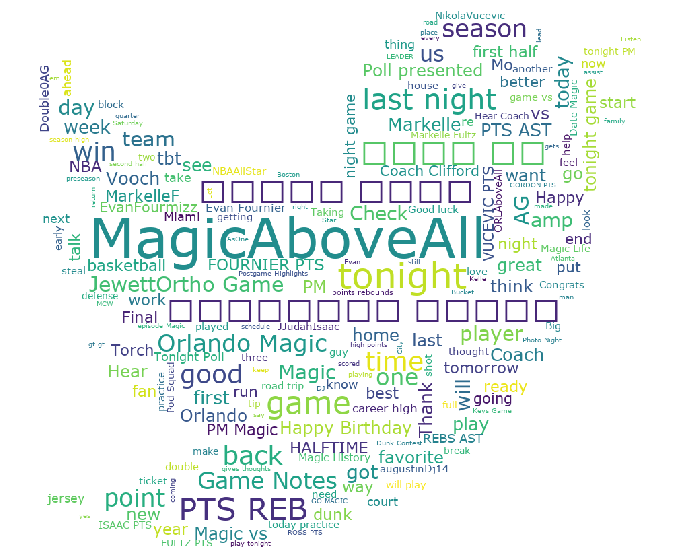

----------------------------17)Describtive statistics for team: Mavericks----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
496,1231992249812226049,2020-02-24 17:20:16,46388,4977,dallasmavs,1724260,2/24 🙏💔 https://t.co/uDaxaQuDP6
1058,1221796193908535299,2020-01-27 14:04:47,36807,6991,dallasmavs,1724260,"You will be dearly missed, Legend 🙏 No Maverick will ever wear 24 again. https://t.co/GSrWUDcuFk"
1638,1211511250972299265,2019-12-30 04:56:05,33096,5304,dallasmavs,1724260,Respect. 🙌\n\n@luka7doncic | @kobebryant https://t.co/wDu3Wr3ciW
288,1235443100761407489,2020-03-05 05:52:43,29247,4878,dallasmavs,1724260,.@luka7doncic 🤝 @hazardeden10 ⚽️\nPlus a surprise guest crashes at the end 🤣\n#MFFL https://t.co/Ui1vo2BXjE
1046,1221947716252643329,2020-01-28 00:06:52,27149,4286,dallasmavs,1724260,Luka has the victims of the tragedy written on his Kobe’s. 💔\n\n#RIPmamba 🐍 https://t.co/RdjlyV6LUB


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3203.00,3203.00,3203.00
mean,718.27,171.71,1724260.00
std,1916.83,774.71,0.00
min,0.00,0.00,1724260.00
25%,98.00,21.00,1724260.00
50%,265.00,43.00,1724260.00
75%,661.50,104.00,1724260.00
max,46388.00,27371.00,1724260.00


>> Most favorite tweet:
496    2/24 🙏💔 https://t.co/uDaxaQuDP6
Name: text, dtype: object
>> Most retweeted tweet:
1059    RT @swish41: https://t.co/rLKrYwjwIu
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-09-26 12:14:37] to [2020-03-26 01:55:06] / days = 181 days 13:40:29
Orignal number of tweets = 2759
Orignal number of retweets = 444
average tweets per day = 15.243093922651934

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,18.60,14428.53,3432.98
std,11.99,14986.02,6653.92
min,0.00,0.00,0.00
25%,8.00,4145.50,550.50
50%,16.00,8648.50,1377.00
75%,28.00,20103.75,3940.75
max,52.00,70033.00,58757.00


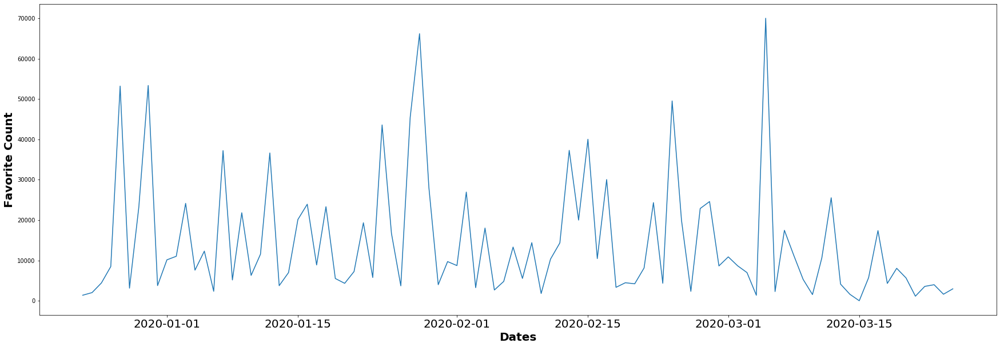

5) The Word Cloud


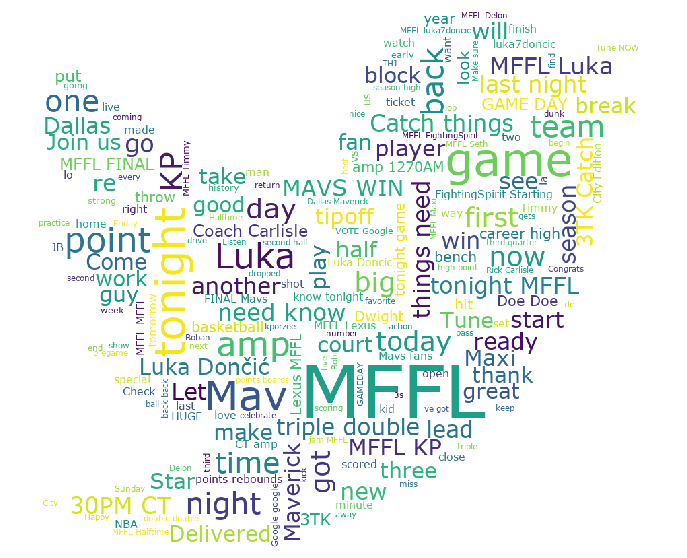

----------------------------18)Describtive statistics for team: Nets----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
956,1222245356660019201,2020-01-28 19:49:35,22730,2377,BrooklynNets,1102718,"Honor your people.\n\nNumber 26, Spencer Dinwiddie. https://t.co/Y3oZREw602"
394,1232011355961643011,2020-02-24 18:36:11,14351,1550,BrooklynNets,1102718,🖤🤍 2/24 💜💛\n\n🎨 | @AndaluzArt https://t.co/u45CxKl7Th
963,1221910352516067329,2020-01-27 21:38:24,10093,1518,BrooklynNets,1102718,Mamba + Mambacita Forever. https://t.co/B3P6Zy2Hj3
1675,1208537317528494080,2019-12-21 23:58:44,8251,855,BrooklynNets,1102718,✌️ @kobebryant https://t.co/0CmdzODj82
3016,1184460207675576320,2019-10-16 13:24:54,7569,1625,BrooklynNets,1102718,𝐓𝐡𝐞𝐲 𝐠𝐨𝐧' 𝐥𝐨𝐯𝐞 𝐮𝐬 𝐟𝐨𝐫 𝐨𝐮𝐫 𝐚𝐦𝐛𝐢𝐭𝐢𝐨𝐧.\n\nNets Basketball: 7 Days https://t.co/t6chdHVtHu


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3219.00,3219.00,3219.00
mean,334.88,69.35,1102718.00
std,731.64,256.68,0.00
min,0.00,0.00,1102718.00
25%,94.50,14.00,1102718.00
50%,171.00,26.00,1102718.00
75%,332.50,53.00,1102718.00
max,22730.00,8368.00,1102718.00


>> Most favorite tweet:
956    Honor your people.\n\nNumber 26, Spencer Dinwiddie. https://t.co/Y3oZREw602
Name: text, dtype: object
>> Most retweeted tweet:
957    RT @SDinwiddie_25: Everything in life evolves. #26 🙏🏾
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-02 22:30:00] to [2020-03-25 18:47:36] / days = 174 days 20:17:36
Orignal number of tweets = 3042
Orignal number of retweets = 177
average tweets per day = 17.482758620689655

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,17.47,5619.94,1231.74
std,14.41,7257.39,2332.07
min,0.00,0.00,0.00
25%,6.25,1260.75,241.25
50%,12.00,2879.50,504.00
75%,31.00,6719.00,987.75
max,53.00,42783.00,12896.00


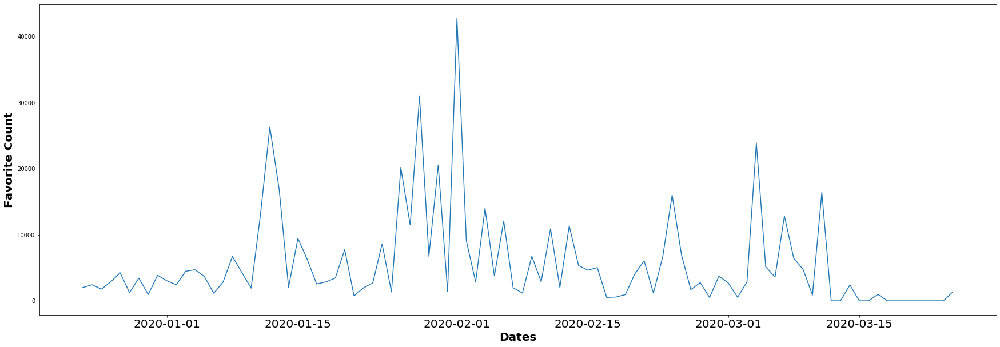

5) The Word Cloud


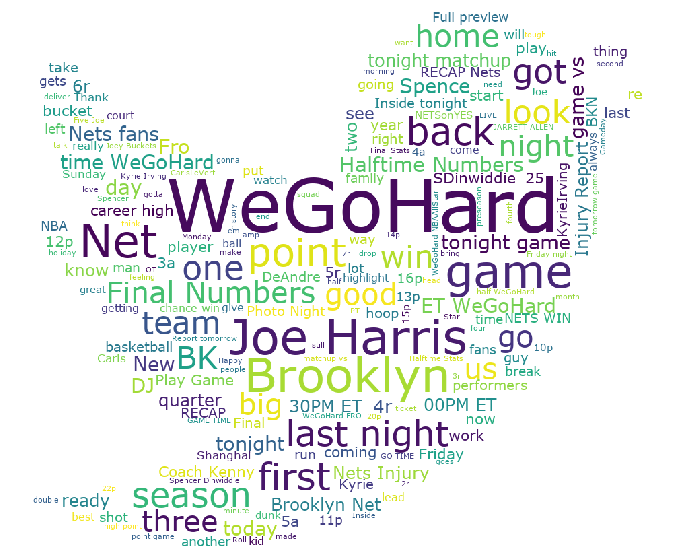

----------------------------19)Describtive statistics for team: Nuggets----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2571,1207067432742817792,2019-12-17 22:37:56,9292,1374,nuggets,970069,The most wholesome content for your timeline!\n\n#MileHighBasketball https://t.co/RRF9qvrmtF
988,1225302615342235648,2020-02-06 06:18:03,6827,997,nuggets,970035,THE SEVEN.\n\n#MileHighBasketball https://t.co/ehlIsQ0ebw
146,1237208674780581890,2020-03-10 02:48:28,6464,1088,nuggets,970035,This *would've* been the dunk of the year....\n\nBut it didn't count..\n\nStill gnarly tho. https://t.co/OanuriaYfz
1282,1221612125979701248,2020-01-27 01:53:21,6387,1098,nuggets,970035,Honoring a legend at Pepsi Center tonight. https://t.co/msvtYUMaaH
1295,1221551677674622977,2020-01-26 21:53:09,5714,936,nuggets,970035,The world lost a legend today. We mourn the loss of Kobe Bryant and the lives of others that were tragically lost t… https://t.co/2JlITj2pOu


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3244.00,3244.00,3244.00
mean,222.74,100.45,970037.10
std,544.39,3308.90,8.18
min,0.00,0.00,970035.00
25%,3.00,1.00,970035.00
50%,78.00,8.00,970035.00
75%,196.25,21.00,970035.00
max,9292.00,186347.00,970069.00


>> Most favorite tweet:
2571    The most wholesome content for your timeline!\n\n#MileHighBasketball https://t.co/RRF9qvrmtF
Name: text, dtype: object
>> Most retweeted tweet:
1290    RT @NBA: https://t.co/CSHJBaG6ZQ
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-11-25 02:37:05] to [2020-03-26 08:00:00] / days = 122 days 05:22:55
Orignal number of tweets = 3081
Orignal number of retweets = 163
average tweets per day = 25.25409836065574

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,25.62,6395.69,3273.14
std,19.15,6523.51,22232.46
min,1.00,0.00,23.00
25%,10.25,1500.25,212.25
50%,20.50,4130.00,482.50
75%,40.00,9604.00,1157.25
max,76.00,31940.00,216122.00


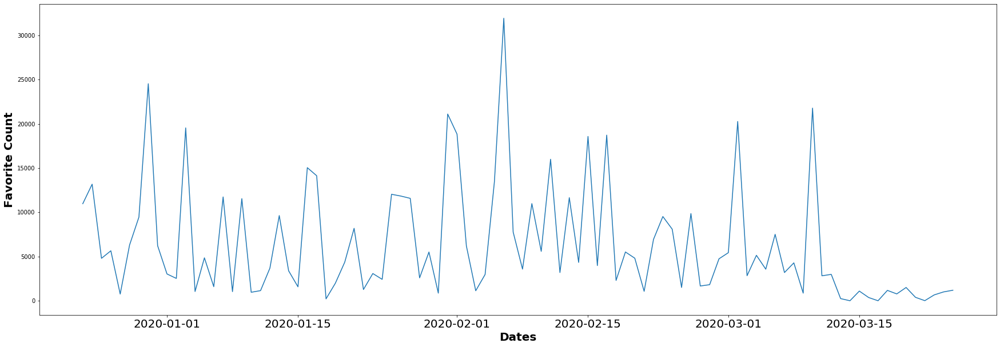

5) The Word Cloud


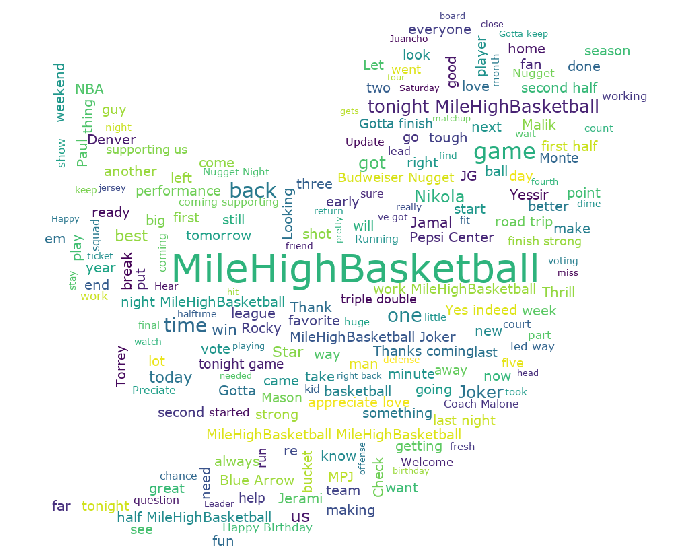

----------------------------20)Describtive statistics for team: Pacers----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
970,1222630123750543364,2020-01-29 21:18:31,17190,1860,Pacers,1261105,for Kobe 🙏🏾 https://t.co/VClThvGsBj
1360,1216897289928749057,2020-01-14 01:38:17,8800,1343,Pacers,1261105,got ourselves a nice game going into the fourth https://t.co/Mgvy70ogAj
946,1222685042163535872,2020-01-30 00:56:45,6306,802,Pacers,1261105,𝒸𝒽𝑒𝒸𝓀𝒾𝓃𝑔 𝒾𝓃 https://t.co/OfUJrFeFwk
931,1222706102984421379,2020-01-30 02:20:26,5511,1694,Pacers,1261105,"as if there was ever a doubt, @VicOladipo is BACK. https://t.co/P2SqrFz7FU"
1968,1207124733579448320,2019-12-18 02:25:38,5433,1657,Pacers,1261105,They stay sleeping 😴\n\nWe stay winning 🙌\n\n#PacersWin https://t.co/rpD9noltZy


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3231.00,3231.00,3231.00
mean,221.74,99.49,1261107.66
std,534.14,3284.17,10.36
min,0.00,0.00,1261105.00
25%,51.00,8.00,1261105.00
50%,105.00,13.00,1261105.00
75%,204.50,27.00,1261105.00
max,17190.00,186347.00,1261148.00


>> Most favorite tweet:
970    for Kobe 🙏🏾 https://t.co/VClThvGsBj
Name: text, dtype: object
>> Most retweeted tweet:
1020    RT @NBA: https://t.co/CSHJBaG6ZQ
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-29 00:46:07] to [2020-03-25 21:47:03] / days = 148 days 21:00:56
Orignal number of tweets = 2817
Orignal number of retweets = 414
average tweets per day = 19.033783783783782

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,19.85,5000.16,2986.13
std,15.46,6702.72,19392.04
min,0.00,0.00,0.00
25%,8.00,1135.75,199.00
50%,15.00,2476.50,375.50
75%,33.00,6369.25,1049.25
max,73.00,44511.00,188321.00


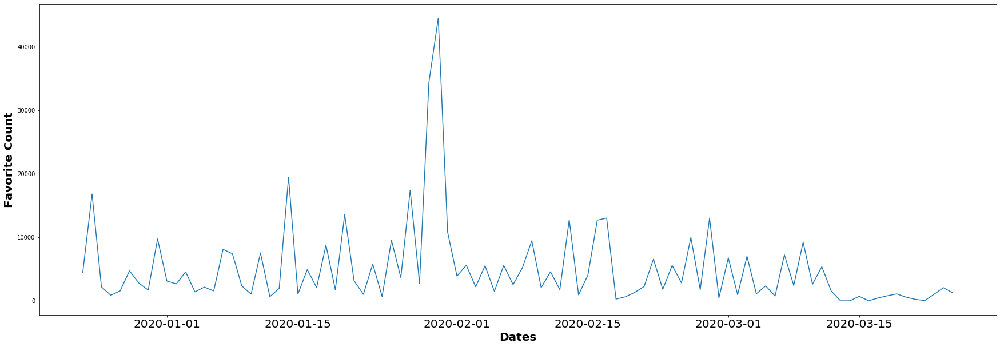

5) The Word Cloud


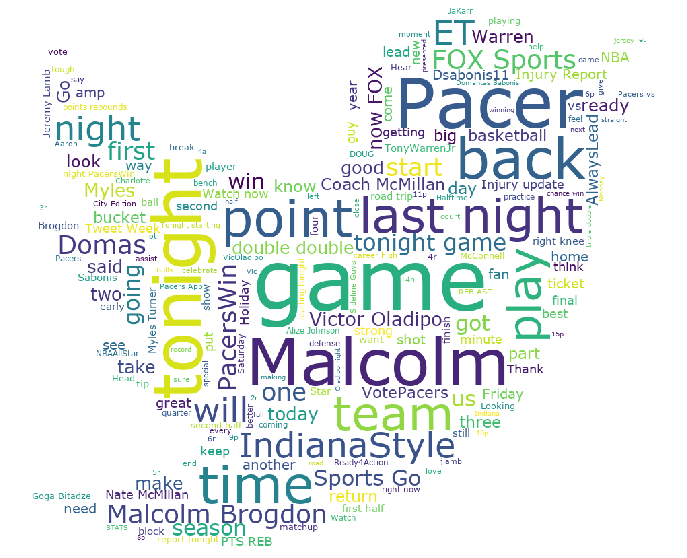

----------------------------21)Describtive statistics for team: Pelicans----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
1582,1218667612994985984,2020-01-18 22:52:55,52084,9366,PelicansNBA,1081289,Wild finish to the #Pelicans dance cam 🔥🤣\n\n#WontBowDown https://t.co/dfF7WXk89E
1353,1221572625958305795,2020-01-26 23:16:24,20671,3713,PelicansNBA,1081289,The New Orleans Pelicans held a 24-second moment of silence for Kobe Bryant and his daughter Gianna before today's… https://t.co/RlZ8p6nFOe
1357,1221559711151140865,2020-01-26 22:25:05,18621,3938,PelicansNBA,1081289,.@ZO2_ honors Kobe Bryant and his daughter Gianna on his shoes before today's game https://t.co/QFaTLxI1hP
323,1236071064104390656,2020-03-06 23:28:01,18005,2473,PelicansNBA,1081289,The birthday boy arrives...\n\nWith a new hoodie 😂\n\n👋 @rihanna https://t.co/qm8eYoMMpV
1180,1223752897759809536,2020-02-01 23:40:01,15526,3009,PelicansNBA,1081289,https://t.co/xKKh0rTinb https://t.co/XV8IT446RY


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3206.00,3206.00,3206.00
mean,436.97,88.84,1081289.00
std,1448.65,333.83,0.00
min,0.00,0.00,1081289.00
25%,19.00,7.00,1081289.00
50%,109.00,19.00,1081289.00
75%,355.00,58.00,1081289.00
max,52084.00,9366.00,1081289.00


>> Most favorite tweet:
1582    Wild finish to the #Pelicans dance cam 🔥🤣\n\n#WontBowDown https://t.co/dfF7WXk89E
Name: text, dtype: object
>> Most retweeted tweet:
1582    Wild finish to the #Pelicans dance cam 🔥🤣\n\n#WontBowDown https://t.co/dfF7WXk89E
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-11-10 00:42:21] to [2020-03-25 23:00:59] / days = 136 days 22:18:38
Orignal number of tweets = 2523
Orignal number of retweets = 683
average tweets per day = 18.551470588235293

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,23.37,12494.50,2563.38
std,17.19,13907.15,2996.02
min,1.00,0.00,57.00
25%,10.00,2803.25,603.25
50%,17.00,7643.00,1688.00
75%,36.75,18834.50,3441.50
max,77.00,77443.00,14382.00


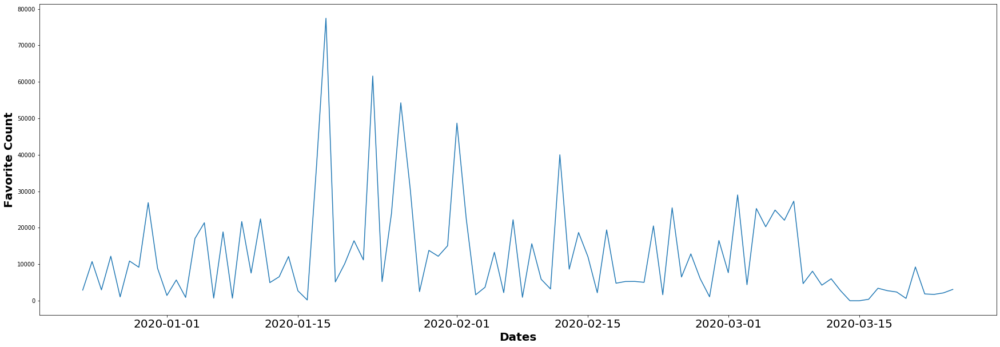

5) The Word Cloud


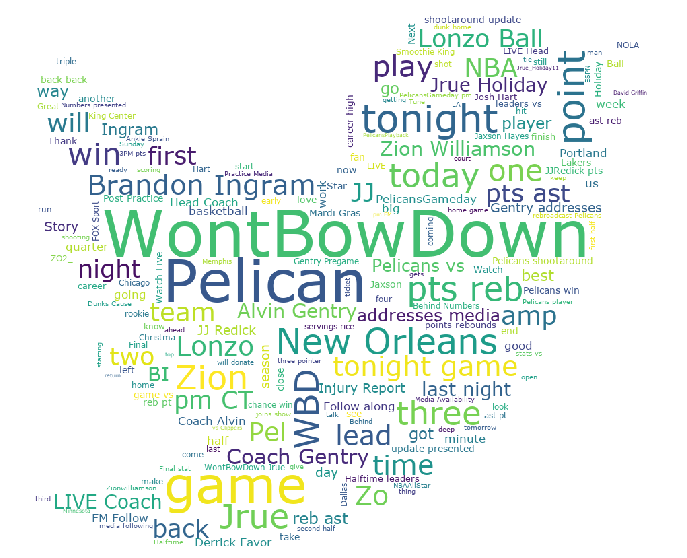

----------------------------22)Describtive statistics for team: Pistons----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
885,1221962011107581952,2020-01-28 01:03:41,7933,1723,DetroitPistons,949575,For Kobe. https://t.co/ZWJxxC5XTb
2576,1194028253540999173,2019-11-11 23:04:54,5250,489,DetroitPistons,949574,Who's back of the week: The Blake of the Year. https://t.co/sOqMfu1P8c
1524,1212770526156017666,2020-01-02 16:20:00,4896,2091,DetroitPistons,949574,🌹\n\nHelp send @DRose to Chicago for the All-Star game. Your vote counts DOUBLE today: https://t.co/y8vDsj0cT4\n\nShout… https://t.co/UKVBQq26tg
911,1221568722948763648,2020-01-26 23:00:53,4735,682,DetroitPistons,949575,The Detroit Pistons organization joins the entire NBA family in expressing our sorrow regarding the unexpected pass… https://t.co/oA2GKExPcJ
1405,1214704100736147456,2020-01-08 00:23:20,4210,1286,DetroitPistons,949574,.@sekou_doums DUNK OF THE DECADE.\n\n#PistonsNow powered by @RocketFiber https://t.co/hPwSpUYw7O


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3222.00,3222.00,3222.00
mean,137.88,53.90,949574.37
std,341.85,925.14,0.48
min,0.00,0.00,949574.00
25%,25.00,5.00,949574.00
50%,54.00,10.00,949574.00
75%,117.00,19.00,949575.00
max,7933.00,43982.00,949575.00


>> Most favorite tweet:
885    For Kobe. https://t.co/ZWJxxC5XTb
Name: text, dtype: object
>> Most retweeted tweet:
48    RT @NBA: NBA To Suspend Season Following Tonight's Games https://t.co/2PTx2fkLlW
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-12 00:17:28] to [2020-03-26 01:39:36] / days = 166 days 01:22:08
Orignal number of tweets = 2888
Orignal number of retweets = 334
average tweets per day = 17.397590361445783

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,18.03,2433.19,1414.53
std,12.62,2714.13,5449.62
min,0.00,0.00,0.00
25%,9.00,822.50,149.00
50%,15.50,1628.00,296.50
75%,28.00,3259.75,629.00
max,47.00,16133.00,44227.00


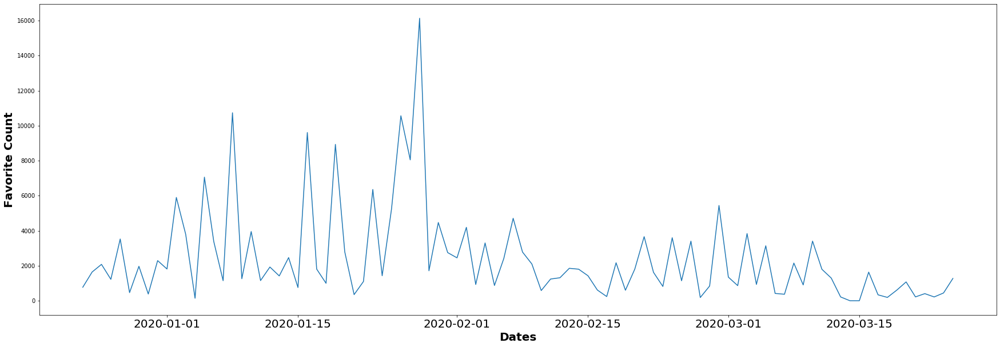

5) The Word Cloud


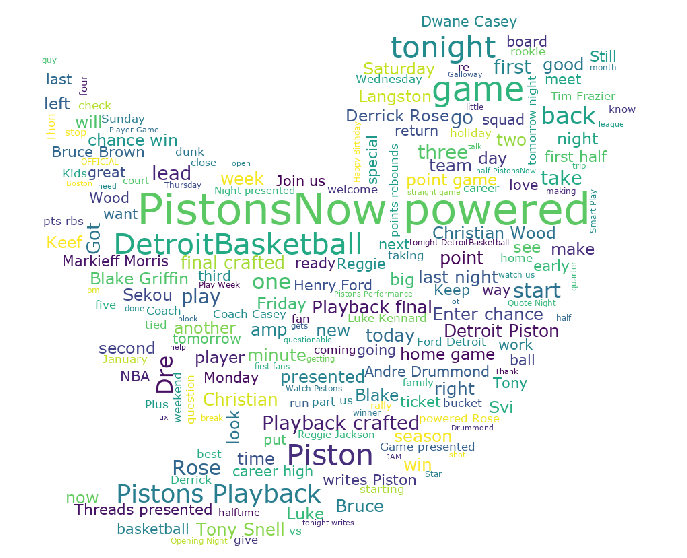

----------------------------23)Describtive statistics for team: Raptors----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
986,1222285011283517442,2020-01-28 22:27:10,74838,12836,Raptors,2180121,Legends Live Forever https://t.co/TUDyJST2ha
768,1225181859732250624,2020-02-05 22:18:12,35932,5718,Raptors,2180121,... “I’ve been in the scarf game 10 years now.” https://t.co/hboWNFfAbt
1001,1221545533963145216,2020-01-26 21:28:45,35759,8723,Raptors,2180121,"Pausing to remember a great one, gone too soon. https://t.co/YOAIkldiX4"
3191,1173259111586238465,2019-09-15 15:35:44,34639,5093,Raptors,2180122,"A year to remember. \n\nFelicidades, @MarcGasol! \n\n#WeTheNorth | #FIBAWC https://t.co/BBsDuoR6cS"
549,1228419584191062023,2020-02-14 20:43:46,33098,4106,Raptors,2180121,We got a ring wrapped around ours. https://t.co/RN249p7byU


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3210.00,3210.00,3210.00
mean,1401.37,260.74,2180121.63
std,2720.49,2277.74,0.48
min,0.00,0.00,2180121.00
25%,387.00,51.00,2180121.00
50%,749.00,89.00,2180122.00
75%,1496.50,181.00,2180122.00
max,74838.00,124841.00,2180122.00


>> Most favorite tweet:
986    Legends Live Forever https://t.co/TUDyJST2ha
Name: text, dtype: object
>> Most retweeted tweet:
947    RT @Bell_LetsTalk: Today is Bell Let’s Talk Day. For every view of this video 👇, Bell will donate 5¢ towards Canadian mental health initiat…
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-09-05 02:14:50] to [2020-03-26 02:36:14] / days = 203 days 00:21:24
Orignal number of tweets = 2936
Orignal number of retweets = 274
average tweets per day = 14.463054187192117

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,18.04,24454.99,5219.07
std,13.08,24338.51,17235.77
min,2.00,0.00,72.00
25%,7.00,5632.75,947.25
50%,14.00,14423.50,2082.50
75%,30.00,38579.00,5164.00
max,63.00,101096.00,167008.00


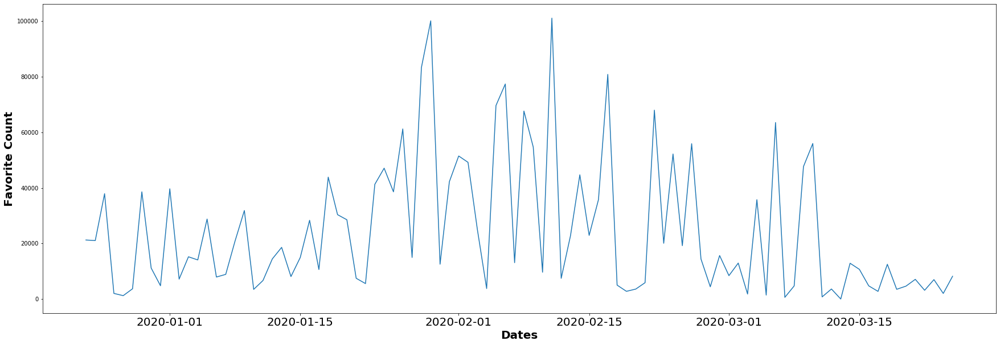

5) The Word Cloud


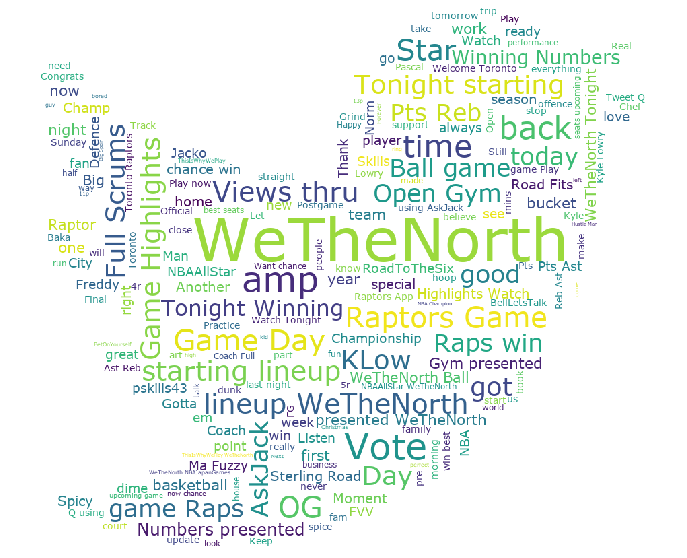

----------------------------24)Describtive statistics for team: Rockets----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2241,1204865079449149440,2019-12-11 20:46:34,28926,3885,HoustonRockets,3068469,"💃@Lizzo, we like your moves! You have an open invite to come home to Houston and dance with @OfficialCCD on the cou… https://t.co/VlAxW3lnNn"
845,1225661119064199169,2020-02-07 06:02:37,25858,5394,HoustonRockets,3068469,https://t.co/o1M5tw3lEd
343,1233969837078204417,2020-03-01 04:18:29,22243,4193,HoustonRockets,3068469,Celtics expectation vs. reality https://t.co/FZa5b8exGw
579,1230905054267396097,2020-02-21 17:20:08,18835,2325,HoustonRockets,3068469,"Cool shirt, Quaden! We're on your team. We'd like to invite you to Houston to come to a game when you visit the U.S… https://t.co/tN0FiSbtnN"
2624,1198120024126263297,2019-11-23 06:04:08,14417,4663,HoustonRockets,3068469,THIS MAN IS NOT HUMAN https://t.co/ooQsdc9Ifb


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3231.00,3231.00,3231.00
mean,846.90,153.74,3068469.00
std,1487.43,358.08,0.00
min,0.00,0.00,3068469.00
25%,231.00,28.00,3068469.00
50%,413.00,53.00,3068469.00
75%,869.50,125.00,3068469.00
max,28926.00,7846.00,3068469.00


>> Most favorite tweet:
2241    💃@Lizzo, we like your moves! You have an open invite to come home to Houston and dance with @OfficialCCD on the cou… https://t.co/VlAxW3lnNn
Name: text, dtype: object
>> Most retweeted tweet:
104    RT @NBA: A Letter to NBA Fans https://t.co/hPX6xhmy9d
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-29 00:58:26] to [2020-03-26 02:47:09] / days = 149 days 01:48:43
Orignal number of tweets = 3121
Orignal number of retweets = 110
average tweets per day = 20.946308724832214

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,20.55,17210.13,2974.04
std,17.71,20564.21,3692.09
min,0.00,0.00,0.00
25%,7.00,3689.00,588.75
50%,11.00,8555.50,1453.00
75%,36.00,23440.50,4008.25
max,60.00,101352.00,18931.00


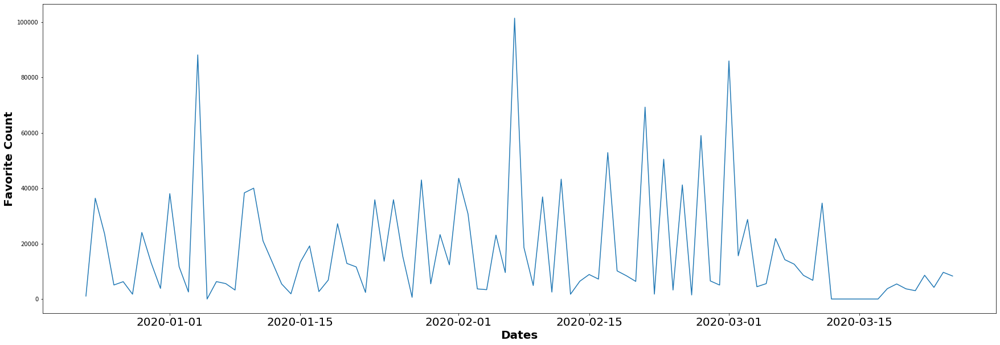

5) The Word Cloud


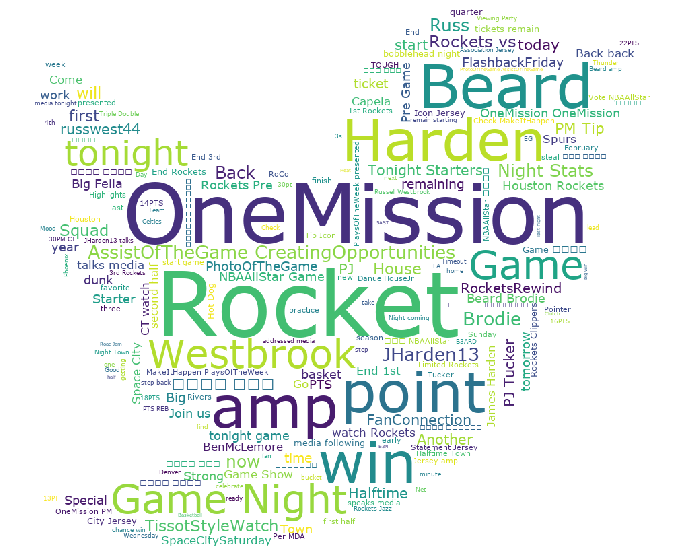

----------------------------25)Describtive statistics for team: Spurs----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2451,1194108879761821696,2019-11-12 04:25:17,36490,11223,spurs,3495222,It's official!\n\n@tonyparker's No. 9 jersey will live on in the rafters forever. #MerciTony https://t.co/DNqrnZLRew
2510,1193909877556600833,2019-11-11 15:14:31,21303,5172,spurs,3495222,What a career. 👏\n\n#MerciTony https://t.co/k6GFDt5Xgm
897,1221651545218895873,2020-01-27 04:30:00,15116,2391,spurs,3495222,"24 for 24\n\nAt the beginning of today's game, we shared a moment with the @Raptors to honor Kobe Bryant. https://t.co/uHdYgUT0Vs"
2492,1194050628898738177,2019-11-12 00:33:48,13178,2103,spurs,3495222,The man of the hour! \n\n#MerciTony https://t.co/jZMZrPuTyI
258,1234978017929154560,2020-03-03 23:04:38,12076,1970,spurs,3495221,Gregg Popovich will miss tonight's Spurs-Hornets game due to personal business.\n\nTim Duncan will serve as the Spurs… https://t.co/8TmZSmcE4W


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3225.00,3225.00,3225.00
mean,636.65,155.58,3495221.75
std,1311.36,1098.49,0.43
min,0.00,0.00,3495221.00
25%,153.00,22.00,3495222.00
50%,329.00,40.00,3495222.00
75%,645.00,93.00,3495222.00
max,36490.00,43982.00,3495222.00


>> Most favorite tweet:
2451    It's official!\n\n@tonyparker's No. 9 jersey will live on in the rafters forever. #MerciTony https://t.co/DNqrnZLRew
Name: text, dtype: object
>> Most retweeted tweet:
95    RT @NBA: NBA To Suspend Season Following Tonight's Games https://t.co/2PTx2fkLlW
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-08 15:22:45] to [2020-03-26 02:35:58] / days = 169 days 11:13:13
Orignal number of tweets = 2745
Orignal number of retweets = 480
average tweets per day = 16.242603550295858

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,17.11,9744.18,2859.48
std,14.48,10496.02,8401.75
min,0.00,0.00,0.00
25%,6.25,2122.25,350.50
50%,10.00,4035.00,927.00
75%,29.00,15856.50,2761.75
max,47.00,39287.00,68404.00


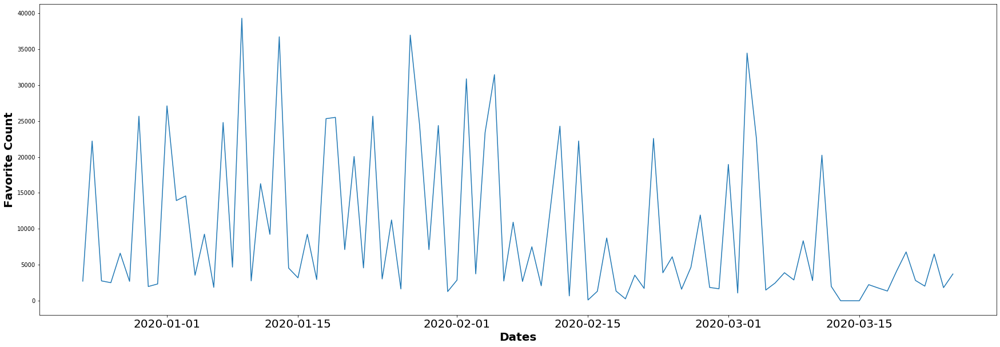

5) The Word Cloud


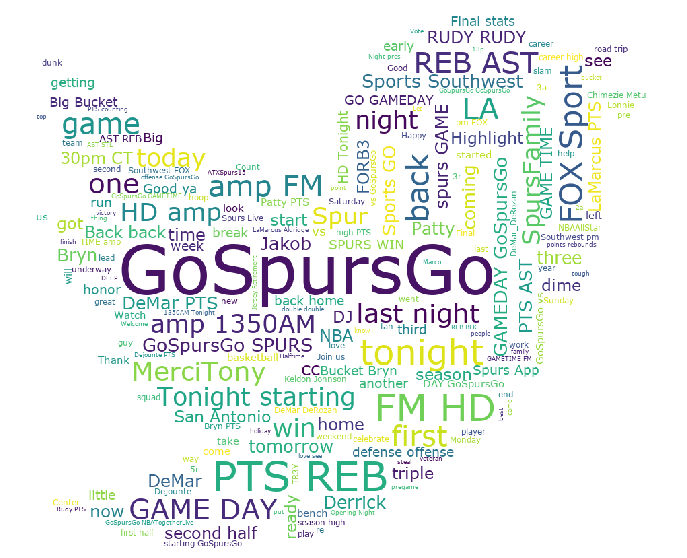

----------------------------26)Describtive statistics for team: Suns----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
3038,1191574088411566083,2019-11-05 04:32:55,79103,11542,Suns,1120116,Mission COMPLETE. https://t.co/XLJVmacOBh
3106,1191050318206816257,2019-11-03 17:51:39,25143,2921,Suns,1120116,Challenge accepted. https://t.co/XLJVmacOBh
745,1225998813816426496,2020-02-08 04:24:29,21605,3890,Suns,1120116,https://t.co/CpfIgLrTu3 https://t.co/L3ctsp6B86
980,1221535469764255748,2020-01-26 20:48:45,15055,2592,Suns,1120116,"Rest In Peace, Mamba. Forever legendary. 🙏 https://t.co/Z6lfIm5H7o"
2656,1197711754672787457,2019-11-22 03:01:49,14602,1348,Suns,1120116,🏀 x 🎮\n\n@DevinBook x @100Thieves https://t.co/tQB42FCqWG


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3247.00,3247.00,3247.00
mean,471.40,94.37,1120116.00
std,1710.35,894.72,0.00
min,0.00,0.00,1120116.00
25%,107.00,10.00,1120116.00
50%,209.00,21.00,1120116.00
75%,439.00,52.00,1120116.00
max,79103.00,45174.00,1120116.00


>> Most favorite tweet:
3038    Mission COMPLETE. https://t.co/XLJVmacOBh
Name: text, dtype: object
>> Most retweeted tweet:
975    RT @espn: Trae Young and Devin Booker took 24 shots each and combined for 81 points tonight. \n\n(h/t @okuzgie) https://t.co/aGfSc72jA6
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-10-29 02:51:17] to [2020-03-26 02:00:14] / days = 148 days 23:08:57
Orignal number of tweets = 3117
Orignal number of retweets = 130
average tweets per day = 21.06081081081081

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,19.24,8850.47,2155.36
std,14.68,9557.16,5437.25
min,0.00,0.00,0.00
25%,7.25,2346.25,279.25
50%,14.00,5265.00,678.50
75%,28.50,11185.75,1770.50
max,66.00,49193.00,46530.00


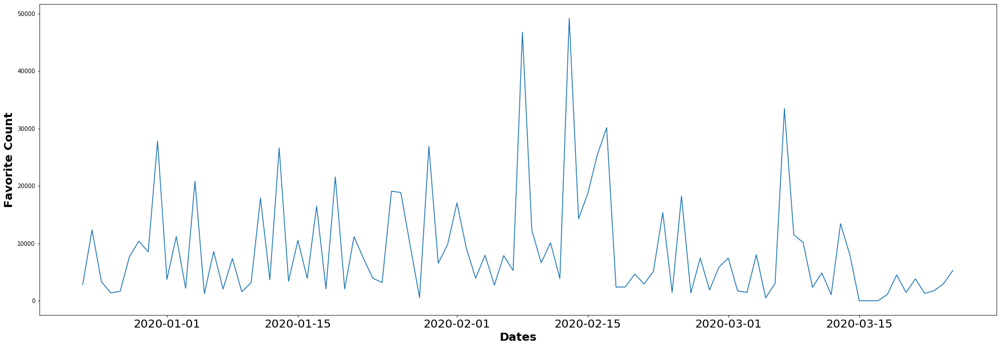

5) The Word Cloud


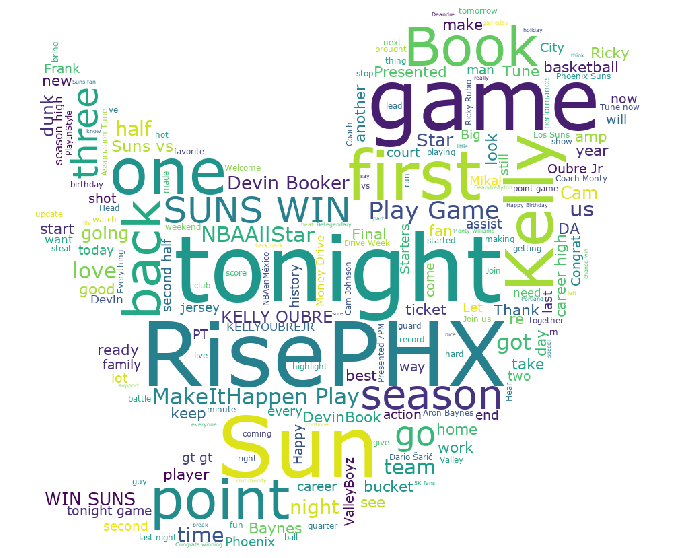

----------------------------27)Describtive statistics for team: Thunder----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
2683,1149804677673996288,2019-07-12 22:16:12,122427,34220,okcthunder,2796524,💙#Russ https://t.co/OlVx1K48SJ
1026,1215463235702415360,2020-01-10 02:39:52,41127,11913,okcthunder,2796524,Russ returns to OKC. Here's our tribute video he watched in the arena tonight. https://t.co/tNsf3J8nGe
684,1221921829952151552,2020-01-27 22:24:01,24211,3448,okcthunder,2796524,https://t.co/6rvLwOmKqD
2681,1151287556203601923,2019-07-17 00:28:37,24097,4009,okcthunder,2796524,A legacy like none other. We grew alongside you and wish you the best. Thanks Russ! https://t.co/xqNW127G0O
3161,1113269426906857473,2019-04-03 02:38:09,23251,7967,okcthunder,2796524,Historic night for Russell Westbrook. \n20 points // 20 rebounds // 21 assists https://t.co/T3tVWiOIvK


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3225.00,3225.00,3225.00
mean,685.41,127.37,2796524.00
std,2597.90,1057.26,0.00
min,0.00,0.00,2796524.00
25%,178.00,16.00,2796524.00
50%,313.00,30.00,2796524.00
75%,591.00,65.00,2796524.00
max,122427.00,43982.00,2796524.00


>> Most favorite tweet:
2683    💙#Russ https://t.co/OlVx1K48SJ
Name: text, dtype: object
>> Most retweeted tweet:
29    RT @NBA: NBA To Suspend Season Following Tonight's Games https://t.co/2PTx2fkLlW
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-03-30 01:43:28] to [2020-03-26 00:27:46] / days = 361 days 22:44:18
Orignal number of tweets = 3114
Orignal number of retweets = 111
average tweets per day = 8.626038781163436

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,14.46,9210.44,1898.47
std,11.51,11843.36,5075.03
min,0.00,0.00,0.00
25%,4.00,1794.75,216.00
50%,8.00,4793.50,478.00
75%,26.00,14552.00,1919.25
max,36.00,85628.00,44105.00


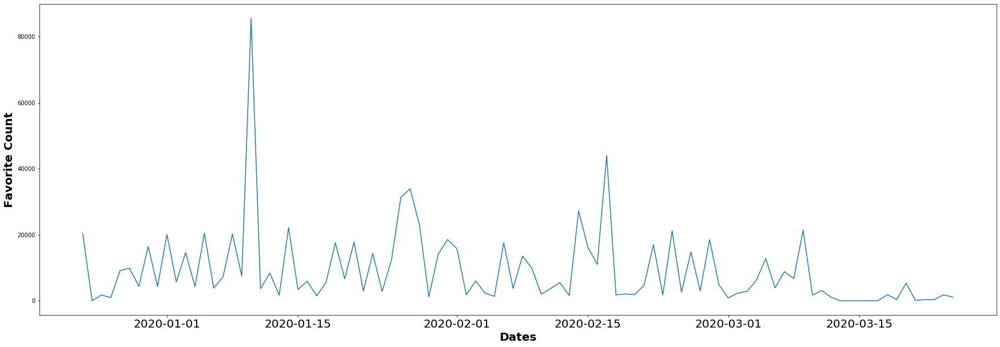

5) The Word Cloud


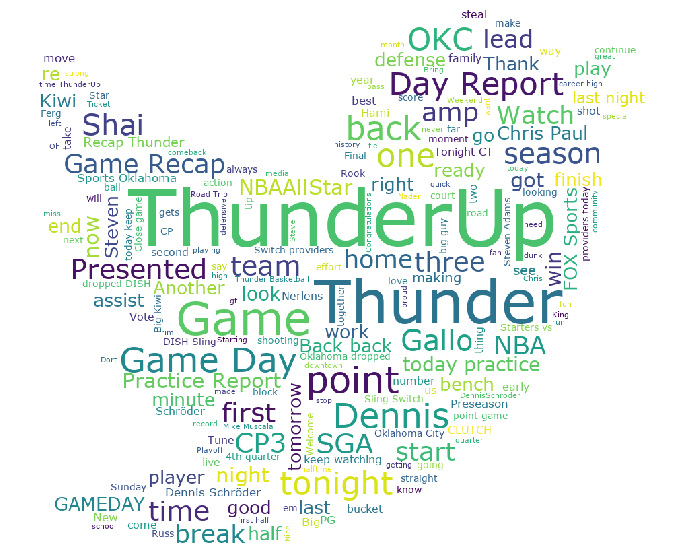

----------------------------28)Describtive statistics for team: Timberwolves----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
770,1225652081089896448,2020-02-07 05:26:42,27401,4211,Timberwolves,1006560,"𝙇𝙖𝙙𝙞𝙚𝙨 𝙖𝙣𝙙 𝙂𝙚𝙣𝙩𝙡𝙚𝙢𝙚𝙣, 𝙬𝙚 𝙜𝙤𝙩 𝙝𝙞𝙢. https://t.co/8vqpq10Jxq"
787,1225547340393730050,2020-02-06 22:30:30,19917,2864,Timberwolves,1006560,LOADING...\n \n██████████████]99% https://t.co/cetmQUACyC
1740,1203890878609330176,2019-12-09 04:15:27,12939,1563,Timberwolves,1006560,🎶 New man on the Minnesota Timberwolves 🎶\n\ncc: @KarlTowns @lizzo 😂 https://t.co/FQveOCZA2K
3,1242692333965127680,2020-03-25 05:58:35,11787,1598,Timberwolves,1006560,"❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️\n\nWe’re all with you, @KarlTowns &amp; family. \n\nhttps://t.co/O4TL4YBNf4"
927,1221963550975045632,2020-01-28 01:09:48,11522,2111,Timberwolves,1006560,Remembering Kobe https://t.co/ytFI08WGMR


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3208.00,3208.00,3208.00
mean,416.62,64.43,1006560.00
std,1093.31,276.03,0.00
min,0.00,0.00,1006560.00
25%,0.00,8.00,1006560.00
50%,135.00,16.00,1006560.00
75%,368.25,42.00,1006560.00
max,27401.00,8258.00,1006560.00


>> Most favorite tweet:
770    𝙇𝙖𝙙𝙞𝙚𝙨 𝙖𝙣𝙙 𝙂𝙚𝙣𝙩𝙡𝙚𝙢𝙚𝙣, 𝙬𝙚 𝙜𝙤𝙩 𝙝𝙞𝙢. https://t.co/8vqpq10Jxq
Name: text, dtype: object
>> Most retweeted tweet:
902    RT @Lakers: The Mamba Sports Foundation has set up the MambaOnThree Fund to support the families affected by this tragedy. To help, please…
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-09-13 18:49:24] to [2020-03-25 14:28:04] / days = 193 days 19:38:40
Orignal number of tweets = 2332
Orignal number of retweets = 876
average tweets per day = 12.082901554404145

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,16.64,8318.32,1315.04
std,13.29,14668.94,2313.98
min,0.00,0.00,0.00
25%,6.00,1259.25,205.50
50%,12.50,3981.50,538.00
75%,25.75,9555.50,1144.00
max,61.00,93302.00,12574.00


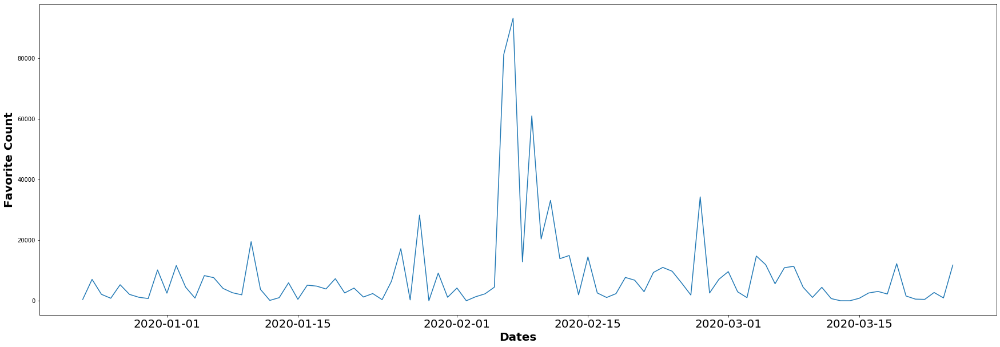

5) The Word Cloud


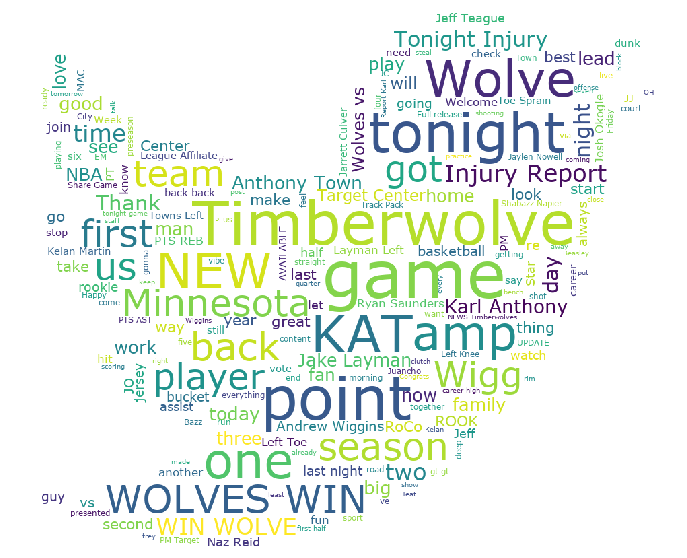

----------------------------29)Describtive statistics for team: Warriors----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
907,1221566500537958400,2020-01-26 22:52:03,69655,14047,warriors,6486908,"We were incredibly saddened and shocked to learn about the tragic passing of Kobe Bryant and his daughter, Gianna,… https://t.co/mRyEOiFVio"
680,1226406628313817089,2020-02-09 07:25:00,68958,9461,warriors,6486908,legends live forever https://t.co/Nh04FxhZPa
709,1226319369057136640,2020-02-09 01:38:16,61093,11633,warriors,6486908,Tonight we honor Kobe Bryant https://t.co/CUltuUz4Vx
79,1238830743331037186,2020-03-14 14:14:00,43431,10326,warriors,6486908,"Happy birthday, SC30! 🎉 https://t.co/9JPRRFfuHD"
198,1235787265248350208,2020-03-06 04:40:18,38086,8581,warriors,6486908,First name: Stephen\nLast name: Curry https://t.co/Cy9P5RD4mg


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3217.00,3217.00,3217.00
mean,1865.17,312.13,6486908.00
std,3454.58,1059.10,0.00
min,0.00,2.00,6486908.00
25%,566.00,60.00,6486908.00
50%,957.00,103.00,6486908.00
75%,1853.00,211.00,6486908.00
max,69655.00,26723.00,6486908.00


>> Most favorite tweet:
907    We were incredibly saddened and shocked to learn about the tragic passing of Kobe Bryant and his daughter, Gianna,… https://t.co/mRyEOiFVio
Name: text, dtype: object
>> Most retweeted tweet:
75    RT @StephenCurry30: We all have to take responsibility for ourselves and do whatever it takes to #stopthespread. There’s a sense of urgency…
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-08-13 00:03:00] to [2020-03-26 03:13:04] / days = 226 days 03:10:04
Orignal number of tweets = 3025
Orignal number of retweets = 192
average tweets per day = 13.38495575221239

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,17.47,32696.81,5851.79
std,12.74,39091.08,8857.95
min,0.00,0.00,0.00
25%,7.50,10564.00,1285.50
50%,11.00,19899.00,2536.00
75%,27.00,39319.00,7609.00
max,48.00,264793.00,58061.00


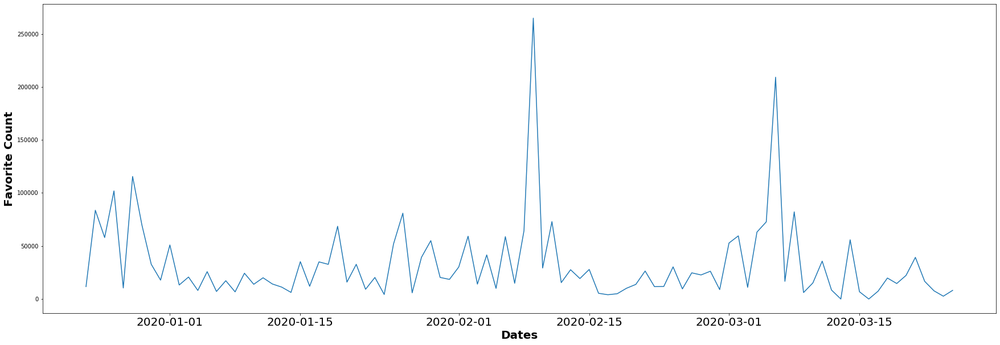

5) The Word Cloud


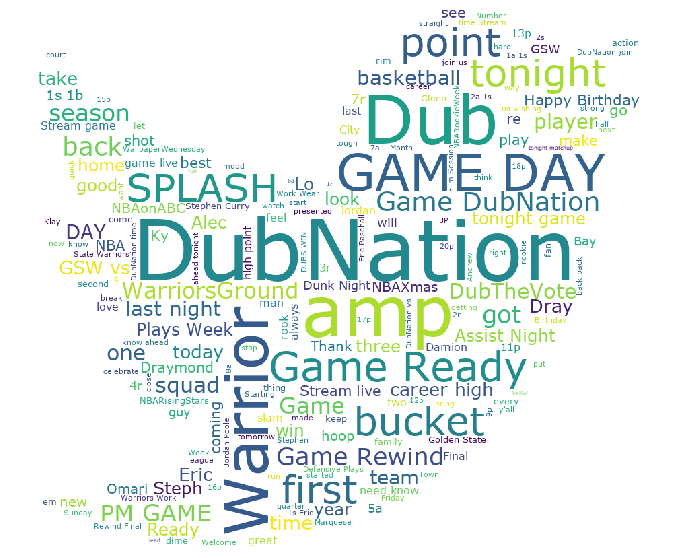

----------------------------30)Describtive statistics for team: Wizards----------------------------------------
1) Header dataframe sorted by favorite count and retweet count


,id,created_at,favorite count,retweet count,user,user followers count,text
879,1232136809292992513,2020-02-25 02:54:41,19587,3875,WashWizards,1055269,Bradley Beal becomes the first player to score 50+ points in consecutive nights since...\n\nKobe Bryant. 💜💛 https://t.co/V141VQ1A8t
1937,1221572843235770369,2020-01-26 23:17:16,16000,4203,WashWizards,1055269,For Kobe.\n\n8️⃣ @ATLHawks \n2️⃣4️⃣ #RepTheDistrict https://t.co/DRx7S6Fucd
1023,1231023828010139648,2020-02-22 01:12:06,15529,3342,WashWizards,1055269,Davido checking out tonight's game!\n\n#RepTheDistrict | @davido https://t.co/moH3OFWmFR
1194,1228400065972232192,2020-02-14 19:26:12,13326,1335,WashWizards,1055269,Rui 🇯🇵 x Luka 🇸🇮 https://t.co/2LKDPV6Llf
1165,1228549503982108673,2020-02-15 05:20:01,11489,1301,WashWizards,1055269,ファミリー https://t.co/RWS85kdpLw


2) Describtive statistics


,favorite count,retweet count,user followers count
count,3203.00,3203.00,3203.00
mean,236.52,89.29,1055269.00
std,828.98,672.24,0.00
min,0.00,0.00,1055269.00
25%,9.00,5.00,1055269.00
50%,69.00,11.00,1055269.00
75%,159.50,31.00,1055269.00
max,19587.00,26673.00,1055269.00


>> Most favorite tweet:
879    Bradley Beal becomes the first player to score 50+ points in consecutive nights since...\n\nKobe Bryant. 💜💛 https://t.co/V141VQ1A8t
Name: text, dtype: object
>> Most retweeted tweet:
1939    RT @NBA: NBA Commissioner Adam Silver issued the following statement today regarding the passing of Kobe Bryant https://t.co/P88GwIwmYV
Name: text, dtype: object

3) How much Active the team is in twitter for the full period
Overall period of tweets is from [2019-12-23 16:30:00] to [2020-03-26 00:15:32] / days = 93 days 07:45:32
Orignal number of tweets = 2616
Orignal number of retweets = 587
average tweets per day = 28.129032258064516

4) Describtive statistic grouped per day and within the minimum commun period: [2019-12-23 : 2020-03-25]


,id,favorite count,retweet count
count,94.00,94.00,94.00
mean,34.03,8058.77,3042.32
std,20.93,9507.50,5741.61
min,2.00,0.00,44.00
25%,19.00,2246.25,479.25
50%,30.00,4685.00,1231.50
75%,48.75,9967.25,2683.00
max,97.00,54008.00,38527.00


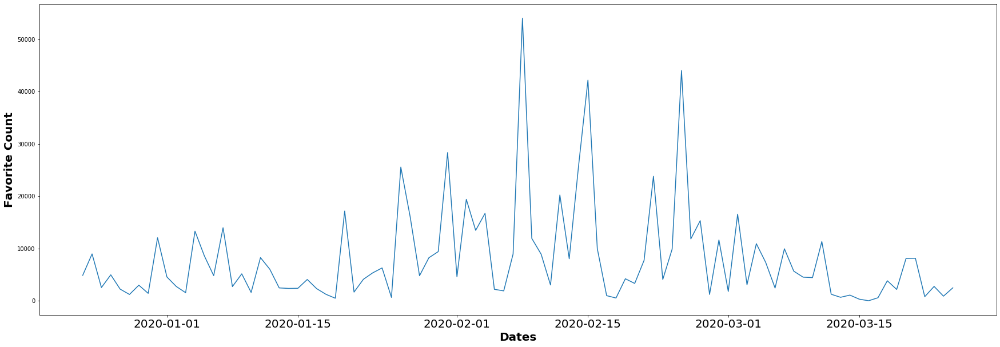

5) The Word Cloud


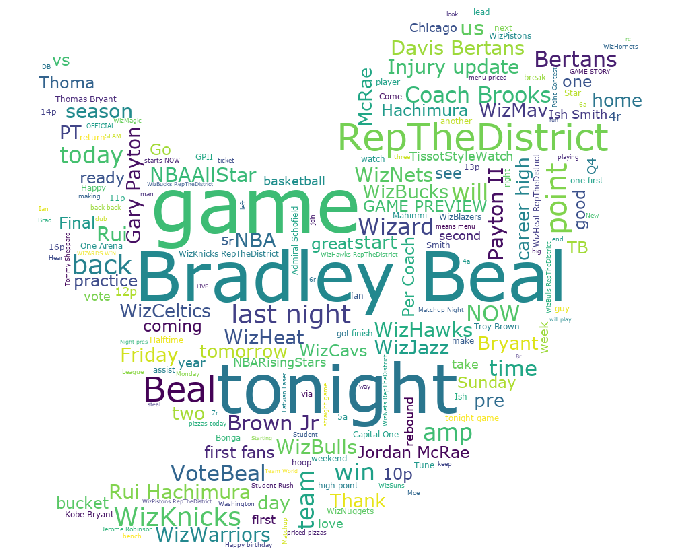

In [364]:
from imageio import imread
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import random
import matplotlib.pyplot as plt
pd.set_option('display.float_format', lambda x: '%.2f' % x) 
pd.set_option('display.max.colwidth', -1)


def plotBagWorld(tweets,team):
    plt.figure(figsize=(20,10))
    text = " ".join(tweets['text'].values.astype(str))
    no_urls_no_tags = " ".join([word for word in text.split()
                                if 'http' not in word
                                    and not word.startswith('@')
                                    and word != 'RT'
                                ])
    nba_mask = imread("pictures/twitter_mask.png")
    wc = WordCloud(background_color="white", font_path="/Library/Fonts/Verdana.ttf", stopwords=STOPWORDS, width=1800,
                          height=140, mask=nba_mask)
    wc.generate(no_urls_no_tags)
    plt.imshow(wc)
    plt.axis("off")
    plt.savefig('pictures/wordcloud/{}.png'.format(team), dpi=300)
    plt.show()

def plotTS(df,xlabel,ylabel):
    plt.figure(figsize=(30,10))
    plt.xlabel(xlabel, fontweight='bold',fontsize='20')
    plt.ylabel(ylabel, fontweight='bold',fontsize='20')
    plt.xticks(fontsize='20')
    # Create legend & Show graphic
    plt.plot(df)
    plt.show()

def getMinimumCommunPeriod():
    min_date = pd.to_datetime("2019-01-01 00:00:00")
    max_date = pd.to_datetime("2020-04-01 00:00:00")
    for team in NBA_Teams.index:
        df_team = pd.read_csv("data/tweets/{}_tweets.csv".format(NBA_Teams['twitter_account'].loc[team]),encoding = 'utf8')
        df_team.created_at = pd.to_datetime(df_team.created_at).dt.date
        if min_date < df_team.created_at.min(): 
            min_date = df_team.created_at.min()        
        if max_date > df_team.created_at.max(): 
            max_date = df_team.created_at.max()
    return min_date, max_date

#create two empty dataframe that will be used to collect final results:
df_final    = pd.DataFrame(columns=['team','avg favorite count','avg retweet count','user followers count'])
df_final_ts = pd.DataFrame()

#iterate from i=1 to 30 as the maximum number of nba teams
i=1

for team in NBA_Teams.index:
    #0) read the csv into a pandas dataframe
    df_team = pd.read_csv("data/tweets/{}_tweets.csv".format(NBA_Teams['twitter_account'].loc[team]),encoding = 'utf8')
    print("----------------------------{})Describtive statistics for team: {}----------------------------------------".format(i,team))
    i+=1
    
    #1) display first 5 rows of the dataframe
    print("1) Header dataframe sorted by favorite count and retweet count")
    display(df_team.sort_values(['favorite count','retweet count'],ascending=False).head(5))
    
    #2) describtive statistics:
    print("2) Describtive statistics")
    df_ds = df_team[['favorite count','retweet count','user followers count']].describe(include='all')
    display(df_ds)
    print(">> Most favorite tweet:")
    print("{}".format(df_team['text'][df_team['favorite count']== df_team['favorite count'].max()]))
    print(">> Most retweeted tweet:")
    print("{}".format(df_team['text'][df_team['retweet count']== df_team['retweet count'].max()]))
    print()
    
    #3) retrieve number of original tweets and remove the bias of retweets
    print("3) How much Active the team is in twitter for the full period")
    df_team.created_at = pd.to_datetime(df_team.created_at)
    print("Overall period of tweets is from [{}] to [{}] / days = {}".format(df_team.created_at.min(),df_team.created_at.max(),df_team.created_at.max() - df_team.created_at.min()))
    list_of_original_tweets = [text for text in df_team['text'].values if not text.startswith("RT")]
    list_of_retweets = [text for text in df_team['text'].values if text.startswith("RT")]
    num_tweets = len(list_of_original_tweets)
    num_retweets = len(list_of_retweets)
    print("Orignal number of tweets = {}".format(num_tweets))
    print("Orignal number of retweets = {}".format(num_retweets))
    #as twitter limit the number of tweets to 3200 independantly from the time frame. It will be intresting to calculate the average per day   
    #calculate the length of the time serie in days:
    ts_lenght = int((df_team.created_at.max() - df_team.created_at.min()).days)
    #calculate the average tweets per day: 
    avg_tweets_day = num_tweets / ts_lenght
    print("average tweets per day = {}".format(avg_tweets_day))
    print()
    
    #4) describtive statistics for minimum commun period:
    min_date, max_date = getMinimumCommunPeriod()
    print("4) Describtive statistic grouped per day and within the minimum commun period: [{} : {}]".format(min_date, max_date))
    df_team.index = df_team.created_at
    df_ts = df_team[['id','favorite count','retweet count']].resample('D').agg({'id':'count','favorite count':sum,'retweet count':sum})    
    df_ts = df_ts[min_date:max_date]
    display(df_ts.describe())
    plotTS(df_ts[['favorite count']],'Dates','Favorite Count')
    
    print("5) The Word Cloud")
    plotBagWorld(df_team,team)
    
    #5) consolidate all results:
    #rename columns by adding team name:
    df_ts.columns = ['tweets_count_{}'.format(team),'favorite_count_{}'.format(team),'retweet_count_{}'.format(team)]
    df_final_ts = pd.concat([df_final_ts,df_ts[['tweets_count_{}'.format(team)]]],axis=1)
    
    row = pd.DataFrame([[team,
                       avg_tweets_day,
                       num_tweets,
                       num_retweets,
                       df_ds['favorite count'].loc['mean'],
                       df_ds['retweet count'].loc['mean'],
                       df_ds['user followers count'].loc['mean']]],
                       columns=['team','daily avg tweets','number tweets','number retweets','avg favorite count','avg retweet count','user followers count'])
    df_final = pd.concat([df_final,row], ignore_index=True,sort=False)

#### c) Summary results of NBA Teams Twitter Engagement:

In [391]:
df_final.index = df_final.team
df_final.drop(['team'],axis=1,inplace=True)
display(df_final.sort_values(['avg favorite count','avg retweet count'],ascending=False))
df_final.to_csv('data/nba_twitter_engagement.csv')
df_final_ts.to_csv('data/nba_twitter_engagement_ts.csv')

,avg favorite count,avg retweet count,user followers count,daily avg tweets,number tweets,number retweets
team,,,,,,
Lakers,6316.75,1472.73,8803559.32,18.38,2684.00,551.00
Warriors,1865.17,312.13,6486908.00,13.38,3025.00,192.00
Raptors,1401.37,260.74,2180121.63,14.46,2936.00,274.00
Celtics,1293.12,225.46,3560217.00,14.86,2898.00,317.00
Heat,979.87,182.80,4735009.00,17.77,3199.00,39.00
76ers,908.79,147.99,1893437.00,21.09,3079.00,155.00
Rockets,846.90,153.74,3068469.00,20.95,3121.00,110.00
Mavericks,718.27,171.71,1724260.00,15.24,2759.00,444.00
Clippers,688.50,121.63,1626258.00,11.38,3026.00,193.00


In [283]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plotNBAEngagement(df,cols,xlabel,ylabel):
    # set width of bar
    barWidth = 0.20
    df = df.sort_values([cols[0],cols[1]],ascending=False)
    # set height of bar
    bars1 = df[cols[0]]
    bars2 = df[cols[1]]
    
    # Set position of bar on X axis
    r1 = np.arange(len(bars1))
    r2 = [x + barWidth for x in r1]

    plt.figure(figsize=(40,15))
    # Make the plot
    plt.bar(r1, bars1, color='#7f6d5f', width=barWidth, edgecolor='white', label=cols[0])
    plt.bar(r2, bars2, color='#557f2d', width=barWidth, edgecolor='white', label=cols[1])

    # Add xticks on the middle of the group bars
    plt.xlabel(xlabel, fontweight='bold',fontsize='30')
    plt.ylabel(ylabel, fontweight='bold',fontsize='30')
    plt.xticks([r + barWidth for r in range(len(bars1))], df.index ,rotation=70,fontsize='25')
    # Create legend & Show graphic
    plt.legend(fontsize='22')
    plt.show()

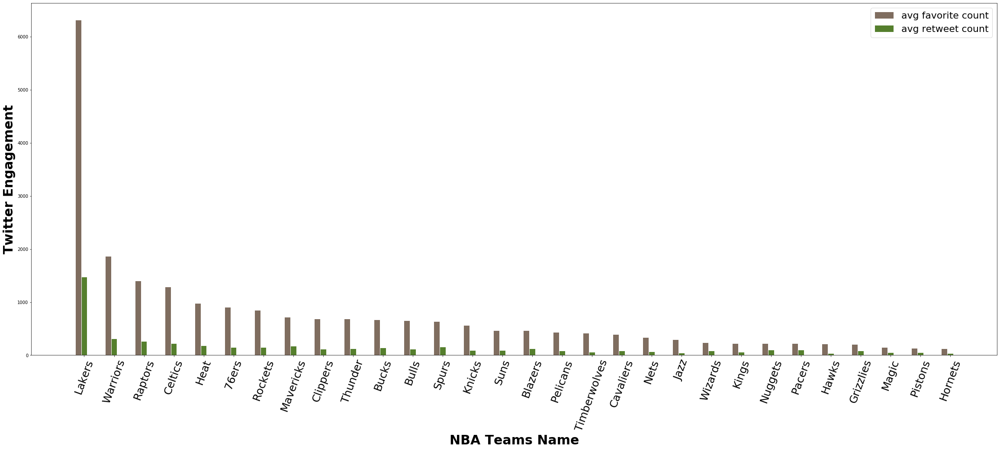

In [287]:
cols=['avg favorite count','avg retweet count']
plotNBAEngagement(df_final,cols,'NBA Teams Name','Twitter Engagement')

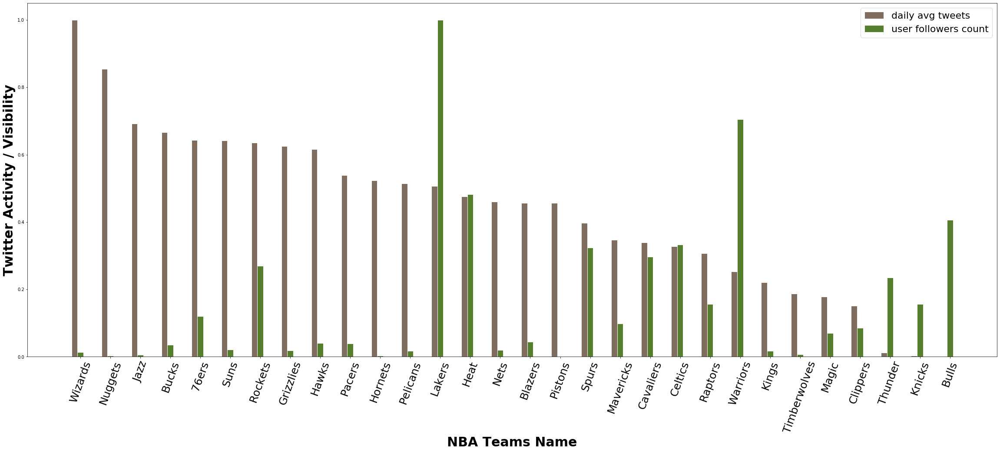

In [290]:
#scale the data to be able to plot at the same time both columns daily avg and followers count:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
array_final_scaled = min_max_scaler.fit_transform(df_final)
df_final_scaled = pd.DataFrame(array_final_scaled,columns=df_final.columns,index = df_final.index)

cols=['daily avg tweets','user followers count']
plotNBAEngagement(df_final_scaled,cols,'NBA Teams Name','Twitter Activity / Visibility')

### << Conclusion Social Media Analysis

- Lakers dominate by far the twitter platform in terms of number favorite and retweet
- High activity in terms of daily average tweets doesn't influence the number of favorite neither retweets (example Wizards vs Lakers), it is better to have quality tweets than quantity.


## 3) Data Environment

# C) Data Understanding

## 1) Cleaning And Wrangling

### >> Merge all datasets
Unfortunatly, twitter API allow requests up to 3200 tweets per twitter page. The tweets correspond to a period between 2019 and 2020. In order to compare all datasets, I will filter them in order to match the same minimum commun period.

#### Cleaning and wrangling Datasets
Create a list to store all datasets: dfs

Profitability (df_pro):
- Remove columns: GMS, GMS.1,GMS.2 as they contains always the same information except 2020 as the season is not finished
- Keep only 2019 and 2020 for the rest of the analysis. I will make an everage per Team of the last two years.
- Set TEAM column as index
- Rename all columns by attend a suffix attendance_ and make it all lower case
- Convert dataset to float

Ticket Cost (df_cos):
- Set TEAM column as index
- Remove columns: TEAM,Team, TFC_dollar, Total Family Cost(TFC)
- Remove the '$' from all values and convert the value to float.
- Rename team the 'Bobcats' with 'Hornets'
- Rename all columns by attend a suffix cost_ and make it all lower case
- Convert dataset to float

Ticket Cost (df_wip):
- remove columns: Lg, From, To
- Create the TEAM column using index
- Replace index with the new TEAM value
- Rename all columns by attend a suffix winning_ and make it all lower case
- Convert dataset to float

Twitter Engagement (df_eng):
- Rename the index
- Rename all columns by attend a suffix twitter_eng_ and make it all lower case

In [509]:
#create a list to store all datasets for futher statistical analysis:
dfs = []

In [564]:
#Load data:
df_pro = pd.read_csv('data/nba_profitability.csv',index_col=0,).sort_values(['Year','RK']) # teams profitability metrics

#clean dataframe profitability:
df_pro = df_pro[(df_pro.Year==2019) | (df_pro.Year==2020)].copy()
df_pro.drop(['GMS.1','GMS.2','GMS','Year'],axis=1,inplace=True)
df_pro = df_pro.groupby('TEAM').median()

#rename columns:
columns = []
for col in df_pro.columns[:-2]:
    columns.append('attendance_' + col.lower())
for col in df_pro.columns[-2:]:
    columns.append('cost_' + col.lower())
df_pro.columns = columns

#make sure all fields are float:
df_pro = df_pro.astype(float)


#save dataframe in dfs:
df_pro.to_csv("data/processed/nba_profitability.csv")
dfs.append(df_pro)

df_pro


,attendance_rk,attendance_total,attendance_avg,attendance_pct,attendance_avg.1,attendance_pct.1,attendance_avg.2,attendance_pct.2,cost_tfc_dollar,cost_avg_ticket_profit
TEAM,,,,,,,,,,
76ers,1.00,738791.50,20534.50,101.50,17800.50,94.40,19145.00,98.00,380.67,7816868.12
Blazers,6.00,703989.50,19564.50,100.65,17966.50,96.00,18750.50,98.35,429.00,8393170.50
Bucks,17.50,635364.00,17656.00,101.80,18038.50,95.00,17849.00,98.15,298.00,5261488.00
Bulls,6.50,731413.50,19444.00,92.95,17794.50,94.20,18631.50,93.50,726.40,14124121.60
Cavaliers,12.50,708456.50,18582.50,95.65,17943.00,93.75,18252.00,94.60,222.67,4137765.28
Celtics,9.00,687224.00,18856.50,101.25,18540.00,97.60,18698.00,99.45,418.14,7884656.91
Clippers,14.00,660251.50,18196.50,95.45,17544.00,93.80,17870.00,94.65,585.20,10648591.80
Grizzlies,26.00,565430.50,15717.50,87.55,17543.50,93.30,16637.00,90.55,276.40,4344317.00
Hawks,26.00,586946.50,15684.50,88.40,17786.00,93.30,16729.00,90.85,492.71,7727909.99


In [567]:
#Load Data
df_cos = pd.read_csv('data/nba_total_familly_cost.csv',index_col=0) # ticket price and total familly cost metrics

#clean dataframe Ticket Price:
# Rename team the 'Bobcats' with 'Hornets'
df_cos['TEAM'][df_cos.TEAM=='Bobcats'] = 'Hornets'
df_cos.index = df_cos.TEAM
df_cos.drop(['TEAM','Team','TFC_dollar','Total Family Cost (TFC)'],axis=1,inplace=True)
for col in df_cos.columns[1:]:
    df_cos[col] = df_cos[col].map(lambda x: x[1:]).astype(float)
    
#rename columns:
columns = []
for col in df_cos.columns:
    columns.append('cost_' + col.lower())
df_cos.columns = columns

#save dataframe in dfs:
dfs.append(df_cos)
df_cos.to_csv('data/processed/nba_total_familly_cost.csv')
df_cos

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cost_rank,cost_median resale ticket price,cost_16oz. beer,cost_16oz. soda,cost_hot dog,cost_parking
TEAM,,,,,,
Cavaliers,1,42.00,9.33,4.50,5.50,5.00
Pacers,2,55.00,6.00,3.25,4.00,8.00
Mavericks,3,52.00,5.33,4.00,4.00,20.00
Grizzlies,4,55.00,7.50,3.20,5.00,15.00
Spurs,5,59.00,5.00,2.50,4.75,8.00
Nuggets,6,60.00,4.17,4.25,4.50,16.00
Pelicans,7,60.00,5.60,5.33,4.00,15.00
Bucks,8,60.00,6.50,5.50,4.00,18.00
Wizards,9,64.00,5.33,5.00,5.50,20.00


In [568]:
#Load Data
df_wip = pd.read_csv("data/nba_team_stats.csv", sep=';') # winning percentage metrics

#clean dataframe Winning Percentage:
df_wip = setTeam(df_wip,'Franchise')
df_wip.index = df_wip['TEAM']
df_wip.drop(['TEAM','Lg','From','To','Franchise'],axis=1,inplace=True)

#rename columns:
columns = []
for col in df_wip.columns:
    columns.append('winning_' + col.lower())
df_wip.columns = columns

df_wip = df_wip.astype(float)

#save dataframe in dfs:
dfs.append(df_wip)
df_wip.to_csv("data/processed/nba_team_stats.csv")
df_wip

,winning_yrs,winning_g,winning_w,winning_l,winning_w/l%,winning_plyfs,winning_div,winning_conf,winning_champ
TEAM,,,,,,,,,
Spurs,53.00,4285.00,2567.00,1718.00,0.60,47.00,22.00,6.00,5.00
Lakers,72.00,5678.00,3382.00,2296.00,0.60,61.00,32.00,18.00,16.00
Celtics,74.00,5788.00,3421.00,2367.00,0.59,57.00,31.00,9.00,17.00
Thunder,53.00,4280.00,2323.00,1957.00,0.54,31.00,11.00,4.00,1.00
Jazz,46.00,3706.00,2005.00,1701.00,0.54,28.00,9.00,2.00,0.00
Blazers,50.00,4036.00,2163.00,1873.00,0.54,35.00,6.00,3.00,1.00
Rockets,53.00,4280.00,2265.00,2015.00,0.53,33.00,7.00,4.00,2.00
Suns,52.00,4199.00,2212.00,1987.00,0.53,29.00,6.00,2.00,0.00
Heat,32.00,2559.00,1335.00,1224.00,0.52,20.00,13.00,5.00,3.00


In [569]:
#Load Data:
df_eng = pd.read_csv("data/nba_twitter_engagement.csv",index_col=0) # twitter engagement metrics

#Clean dataframe Twitter Engagement:
df_eng.index = df_eng.index.rename('TEAM')

#rename columns:
columns = []
for col in df_eng.columns:
    columns.append('engagement_' + col.lower())
df_eng.columns = columns

#save dataframe in dfs:
dfs.append(df_eng)
df_eng.to_csv("data/processed/nba_twitter_engagement.csv")
df_eng

,engagement_avg favorite count,engagement_avg retweet count,engagement_user followers count,engagement_daily avg tweets,engagement_number tweets,engagement_number retweets
TEAM,,,,,,
76ers,908.79,147.99,1893437.00,21.09,3079.00,155.00
Blazers,464.20,125.09,1296816.00,17.41,2612.00,596.00
Bucks,671.76,143.97,1232313.00,21.54,2779.00,422.00
Bulls,655.78,121.00,4143215.00,8.39,2803.00,398.00
Cavaliers,391.38,83.70,3276382.00,15.09,2444.00,805.00
Celtics,1293.12,225.46,3560217.00,14.86,2898.00,317.00
Clippers,688.50,121.63,1626258.00,11.38,3026.00,193.00
Grizzlies,211.45,84.91,1097162.00,20.73,2467.00,781.00
Hawks,211.94,40.20,1271940.56,20.56,3146.00,54.00


## 2) Exploration: basic statistics

In [514]:
#Basic statistics for the overall NBA:
for df in dfs:
    display(df.describe(include='all'))

,attendance_rk,attendance_total,attendance_avg,attendance_pct,attendance_avg.1,attendance_pct.1,attendance_avg.2,attendance_pct.2,cost_tfc_dollar,cost_avg_ticket_profit
count,30.00,30.00,30.00,30.00,30.00,30.00,30.00,30.00,30.00,30.00
mean,15.50,652815.48,17825.50,94.55,17824.73,94.48,17823.72,94.50,442.28,7960918.80
std,8.51,58481.06,1559.16,7.18,340.61,1.93,853.81,4.16,174.74,3481414.99
min,1.00,554827.50,15185.50,77.20,17318.50,92.05,16368.50,85.20,222.67,4137765.28
25%,9.12,596823.75,16358.75,89.29,17549.00,93.08,17112.88,91.62,303.17,5275896.26
50%,14.25,659220.50,18199.75,96.12,17797.50,94.05,17883.75,94.90,408.35,6945514.19
75%,23.50,702976.62,18894.00,100.04,17997.25,95.26,18594.38,98.00,531.20,9551935.92
max,29.00,751332.50,20534.50,104.35,18869.50,101.10,19145.00,100.65,878.20,16603688.30


,cost_rank,cost_median resale ticket price,cost_16oz. beer,cost_16oz. soda,cost_hot dog,cost_parking
count,30.00,30.00,30.00,30.00,30.00,30.00
mean,15.50,96.57,6.92,3.83,4.82,15.21
std,8.80,42.30,1.89,0.85,0.92,7.53
min,1.00,42.00,4.17,2.50,3.00,5.00
25%,8.25,61.00,5.40,3.21,4.00,10.00
50%,15.50,87.00,6.50,3.67,4.75,15.00
75%,22.75,117.75,7.69,4.46,5.75,18.00
max,30.00,200.00,12.00,5.50,6.00,35.00


,winning_yrs,winning_g,winning_w,winning_l,winning_w/l%,winning_plyfs,winning_div,winning_conf,winning_champ
count,30.00,30.00,30.00,30.00,30.00,30.00,30.00,30.00,30.00
mean,51.43,4106.73,2061.40,2045.33,0.50,29.87,9.23,3.27,2.57
std,16.60,1298.01,736.56,628.93,0.05,14.20,7.66,3.68,4.16
min,18.00,1442.00,671.00,771.00,0.40,7.00,0.00,0.00,0.00
25%,41.50,3339.25,1622.50,1629.00,0.46,20.25,5.25,0.25,0.00
50%,53.00,4280.00,2172.50,2046.50,0.50,30.00,8.00,2.00,1.00
75%,68.00,5401.50,2584.25,2419.00,0.53,35.00,11.00,5.00,3.00
max,74.00,5788.00,3421.00,3089.00,0.60,61.00,32.00,18.00,17.00


,engagement_avg favorite count,engagement_avg retweet count,engagement_user followers count,engagement_daily avg tweets,engagement_number tweets,engagement_number retweets
count,30.00,30.00,30.00,30.00,30.00,30.00
mean,759.79,162.65,2265733.31,16.97,2847.33,375.00
std,1126.15,255.79,1831987.03,4.82,252.38,249.47
min,125.67,32.81,949574.37,8.39,2308.00,39.00
25%,229.17,72.94,1085398.25,13.65,2699.25,180.75
50%,467.80,99.97,1401287.50,17.45,2907.00,320.00
75%,710.83,152.30,3000482.75,20.69,3040.00,533.25
max,6316.75,1472.73,8803559.32,28.13,3199.00,902.00


## 3) Statistical Analysis

#### a) Correlation Matrix
Correlation express one quantity in terms of its relationship with others. It is only one data summary statistic that by no means tells the complete story of relationships in the data. I will use it in the following steps to get a first idea of correlated features.

In [547]:
#First merge the dataframe based on TEAM
df = pd.concat(dfs,axis=1,sort=False)
pd.set_option('display.max_columns', 500)
display(df)

,attendance_rk,attendance_total,attendance_avg,attendance_pct,attendance_avg.1,attendance_pct.1,attendance_avg.2,attendance_pct.2,cost_tfc_dollar,cost_avg_ticket_profit,cost_rank,cost_median resale ticket price,cost_16oz. beer,cost_16oz. soda,cost_hot dog,cost_parking,winning_yrs,winning_g,winning_w,winning_l,winning_w/l%,winning_plyfs,winning_div,winning_conf,winning_champ,engagement_avg favorite count,engagement_avg retweet count,engagement_user followers count,engagement_daily avg tweets,engagement_number tweets,engagement_number retweets
76ers,1.00,738791.50,20534.50,101.50,17800.50,94.40,19145.00,98.00,380.67,7816868.12,14,81.00,10.33,3.00,4.50,12.00,71.00,5615.00,2896.00,2719.00,0.52,49.00,11.00,5.00,3.00,908.79,147.99,1893437.00,21.09,3079.00,155.00
Blazers,6.00,703989.50,19564.50,100.65,17966.50,96.00,18750.50,98.35,429.00,8393170.50,19,92.00,7.00,5.00,6.00,13.00,50.00,4036.00,2163.00,1873.00,0.54,35.00,6.00,3.00,1.00,464.20,125.09,1296816.00,17.41,2612.00,596.00
Bucks,17.50,635364.00,17656.00,101.80,18038.50,95.00,17849.00,98.15,298.00,5261488.00,8,60.00,6.50,5.50,4.00,18.00,52.00,4199.00,2182.00,2017.00,0.52,32.00,14.00,2.00,1.00,671.76,143.97,1232313.00,21.54,2779.00,422.00
Bulls,6.50,731413.50,19444.00,92.95,17794.50,94.20,18631.50,93.50,726.40,14124121.60,28,165.00,7.50,4.20,5.75,20.00,54.00,4362.00,2227.00,2135.00,0.51,35.00,9.00,6.00,6.00,655.78,121.00,4143215.00,8.39,2803.00,398.00
Cavaliers,12.50,708456.50,18582.50,95.65,17943.00,93.75,18252.00,94.60,222.67,4137765.28,1,42.00,9.33,4.50,5.50,5.00,50.00,4035.00,1867.00,2168.00,0.46,22.00,7.00,5.00,1.00,391.38,83.70,3276382.00,15.09,2444.00,805.00
Celtics,9.00,687224.00,18856.50,101.25,18540.00,97.60,18698.00,99.45,418.14,7884656.91,16,85.00,8.00,4.57,4.75,34.00,74.00,5788.00,3421.00,2367.00,0.59,57.00,31.00,9.00,17.00,1293.12,225.46,3560217.00,14.86,2898.00,317.00
Clippers,14.00,660251.50,18196.50,95.45,17544.00,93.80,17870.00,94.65,585.20,10648591.80,25,130.00,10.00,3.60,5.75,15.00,50.00,4034.00,1654.00,2380.00,0.41,14.00,2.00,0.00,0.00,688.50,121.63,1626258.00,11.38,3026.00,193.00
Grizzlies,26.00,565430.50,15717.50,87.55,17543.50,93.30,16637.00,90.55,276.40,4344317.00,4,55.00,7.50,3.20,5.00,15.00,25.00,1985.00,824.00,1161.00,0.41,10.00,0.00,0.00,0.00,211.45,84.91,1097162.00,20.73,2467.00,781.00
Hawks,26.00,586946.50,15684.50,88.40,17786.00,93.30,16729.00,90.85,492.71,7727909.99,21,111.00,7.00,2.86,4.75,10.00,71.00,5619.00,2766.00,2853.00,0.49,46.00,11.00,0.00,1.00,211.94,40.20,1271940.56,20.56,3146.00,54.00
Heat,4.50,717517.50,19660.00,100.30,18151.50,96.15,18899.50,98.25,696.33,13689847.80,26,155.00,5.33,3.33,6.00,35.00,32.00,2559.00,1335.00,1224.00,0.52,20.00,13.00,5.00,3.00,979.87,182.80,4735009.00,17.77,3199.00,39.00


In [548]:
# Features Enrichement:
df['profit_total'] = df['attendance_total'] * df['cost_tfc_dollar']


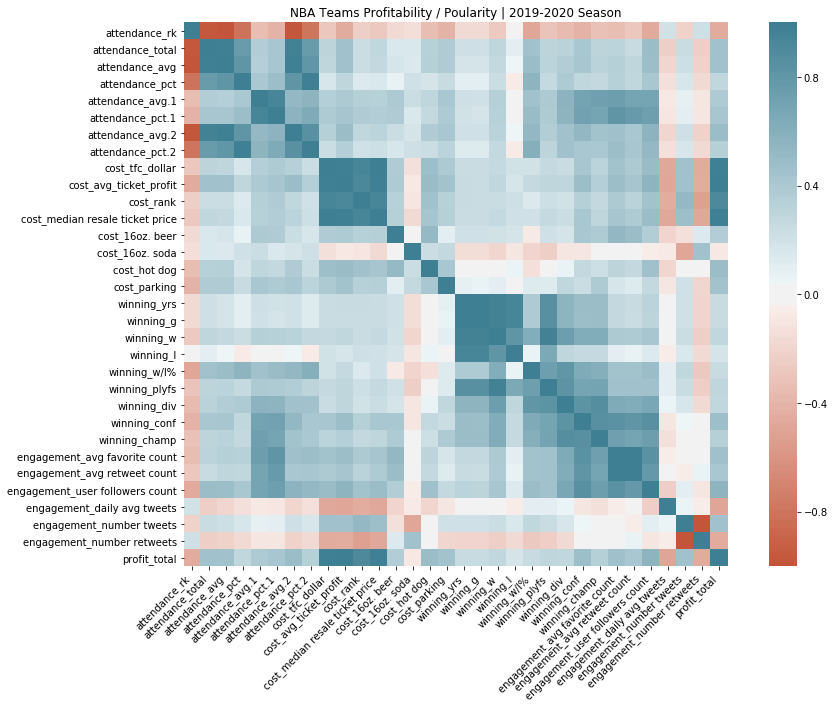

In [549]:
#Plot heatmap for correlation:
corr = df.corr()
plotHeatMap(corr,"NBA Teams Profitability / Poularity | 2019-2020 Season")

We can see from above heatmap that:
- nba team profitability is correlated with winning in conference division, average favorite tweets and number of followers.
- At the same time, nba team profitability is negatively correlated with number of retweets, daily average tweets and soda prices.

With some initial discovery of what features are correlated, the next step is to further discover relationships in the data.

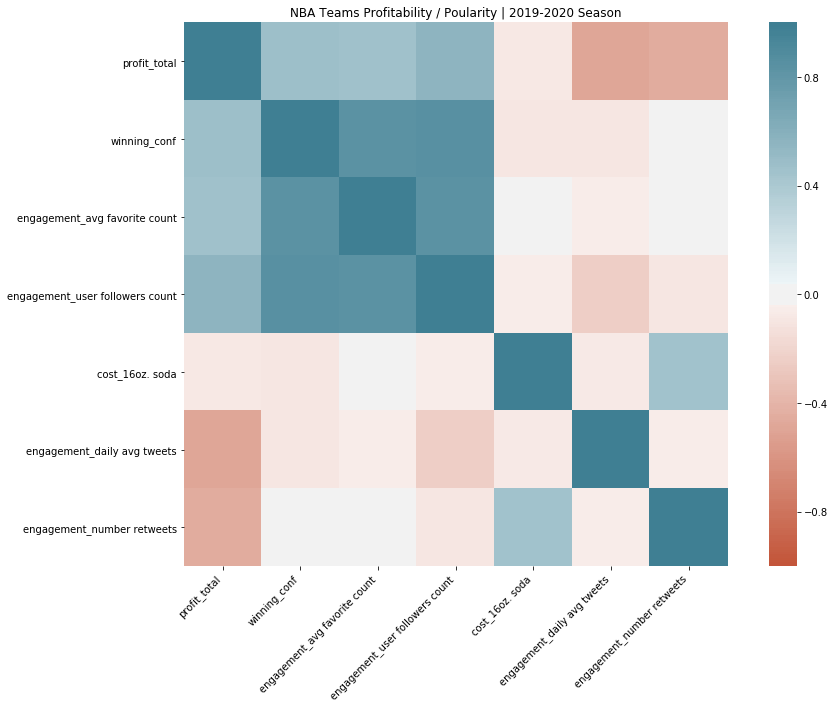

In [550]:
df1 =df[['profit_total', 
         'winning_conf',
         'engagement_avg favorite count',
         'engagement_user followers count',
         'cost_16oz. soda',
         'engagement_daily avg tweets',
         'engagement_number retweets'
         ]
       ]
corr = df1.corr()
plotHeatMap(corr,"NBA Teams Profitability / Poularity | 2019-2020 Season")

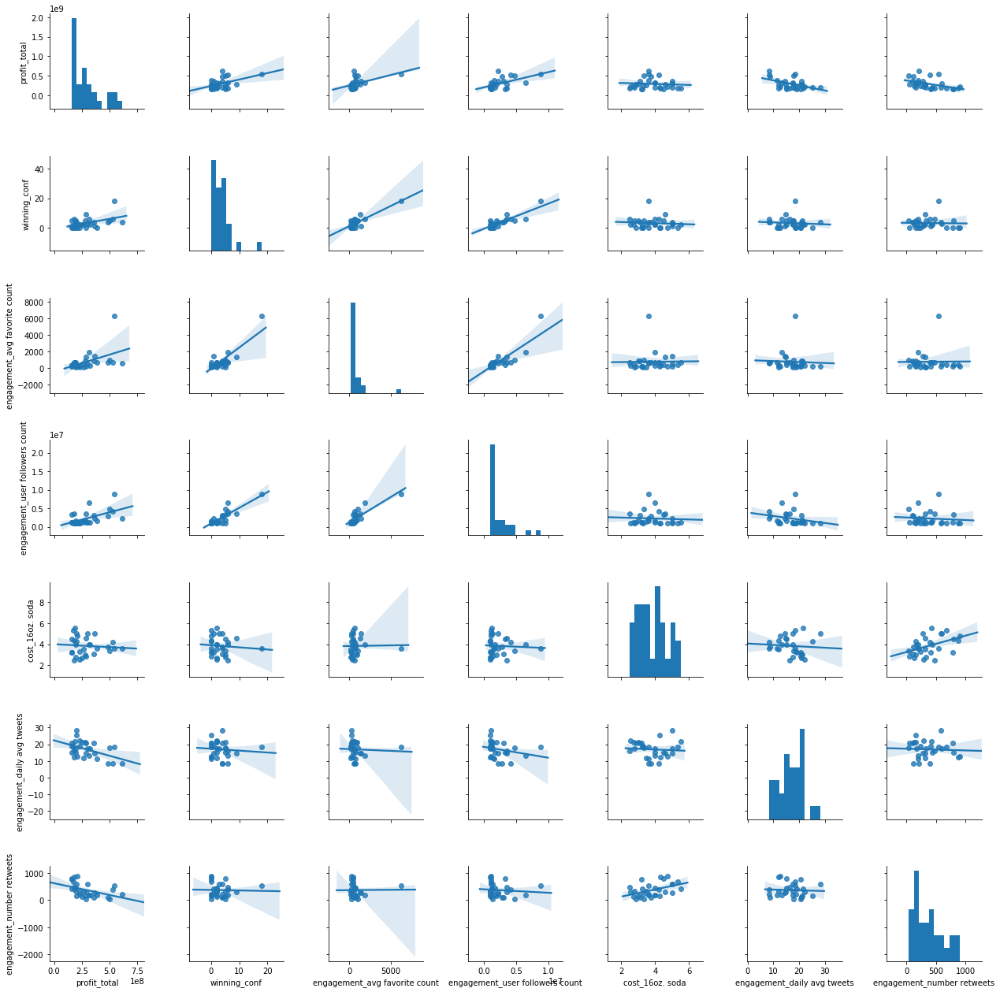

In [563]:
seaborn.pairplot(df1,kind='reg')

In the plot output shown above, there appears to be a strong linear relationship between total profit and engagement favorite count. To further investigate this, run a linear regression.

#### b) Linear Regression Analysis

In [558]:
import statsmodels.api as sm
X = df[['winning_conf','engagement_avg favorite count','engagement_user followers count']] # here we have 3 variables for the multiple linear regression.
Y = df['profit_total']

X = sm.add_constant(X) # adding a constant

model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:           profit_total   R-squared:                       0.313
Model:                            OLS   Adj. R-squared:                  0.262
Method:                 Least Squares   F-statistic:                     6.160
Date:                Fri, 27 Mar 2020   Prob (F-statistic):            0.00625
Time:                        17:18:03   Log-Likelihood:                -596.54
No. Observations:                  30   AIC:                             1199.
Df Residuals:                      27   BIC:                             1203.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

- Adjusted. R-squared reflects not a very good fit of the model as it is between 0 to 1.
- std err reflects the level of accuracy is of the coefficients.
- A p-value is not always below 0.05 

# D) Deployment:

## 1) Designing The Data Pipeline

![](pictures/datapipeline_design.jpg)

The above data pipeline will be implemented to maintain it and automate the generation of the final tables to be used by the Data Scientist team.

## 2) Maintaining The Data Pipeline

I have completed below steps documented in AWS Big Data Blog.  However, I had to adapt the solution to my case study.
- [Original steps](https://aws.amazon.com/blogs/big-data/build-and-automate-a-serverless-data-lake-using-an-aws-glue-trigger-for-the-data-catalog-and-etl-jobs/): Build and automate a serverless data lake using an AWS Glue trigger for the Data Catalog and ETL jobs

> [Data Pipeline CloudFormation Template](src/aws/nba_data_papeline.json)

####  Modificaitons to the orignal stack:
- For each source data (engagement, winning, ticket price and attendance) created additional:
    - folder in the S3 raw bucket
    - S3 trigger to lambda function
    - lambda function to trigger crawler
    - crawler
- The ETL job script in PySpark was updated to merge the resulted 4 tables to a final parquet file. The file was saved in processed bucket.
_ As for Raw bucket, I have also created a trigger, lambda and crawler for the final parquet file in order to generate the final table to be consumed by the data scientist team.

## 3) Twitter Real Time Streaming

In addition to the first dump of historical tweets, I have also create a full automated data pipeline to stream in real time new tweets. The steps are described also in the following AWS Blog:
- [Original steps](https://aws.amazon.com/blogs/machine-learning/build-a-social-media-dashboard-using-machine-learning-and-bi-services/): Build a social media dashboard using machine learning and BI services

### Modification to the orignal stack:
I have updated the cloudformation to include NBA teams as default search criteria: 
- [Twitter Real Time Streaming Automated Data Pipeline](src/aws/twitter_real_time_streaming_cloudformation.yaml)
- Also fixed a bug for the version of nodejs supported by lambda function (from nodejs8 to nodejs12.x)

![](pictures/twitter_real_time_streaming.jpg)


# Conclusion: